<font size="6.5"><b>Analyzing Salaries data</b></font>

<div class="c">
This notebook is gathering insights on the salaries data that was cleaned in the Salaries_Preparation notebook.<br>
There are 3 main goals:<br>
    &nbsp;&nbsp;&nbsp;&nbsp - Exploratory Data Analysis to better understand the dynamics of the parameters affecting salary.<br>
    &nbsp;&nbsp;&nbsp;&nbsp - Discovering the effect of the surveys: Are they representing the same underlying salary trends? This would increase our confidence. <br>
    &nbsp;&nbsp;&nbsp;&nbsp - Preparing for salary prediction.
</div>

# Import libraries & data, general settings

In [13]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
from datetime import datetime
import re

import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.multicomp as mc
from scipy.stats import levene, shapiro

# If the notebook is opened from the "notebooks" folder, we need to append the main directory to the "python path" so it sees all subfolders.
import sys
sys.path.append('../')

In [14]:
import geopandas as gpd
from shapely.geometry import box

In [15]:
df_it = pd.read_csv('../data/cleaned/df_it.csv', low_memory=False)
df_k = pd.read_csv('../data/cleaned/df_k.csv', low_memory=False)
df_ai = pd.read_csv('../data/cleaned/df_ai.csv', low_memory=False)

In [16]:
df_combined_0 = pd.concat([df_ai, df_it, df_k])

## Styles

In [18]:
# General Display settings

# Column display is supressed by default
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

#changing the display format
pd.set_option('display.float_format', lambda x: '%.2f' % x)

# Plotting format
#print(plt.style.available)
plt.style.use('seaborn-v0_8-whitegrid')

In [19]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


# Preparing dataframes

<div class="c">
Different sections and filters of the dataframes were iteratively experimented with through the later chapters.<br>
These filterings are collected into this chapter for logical consistency of the project.
</div>

## Western countries

In [23]:
firstworld_countries = [
    'al', 'ad', 'am', 'at', 'az', 'by', 'be', 'ba', 'bg', 'hr',
    'cy', 'cz', 'dk', 'ee', 'fi', 'fr', 'ge', 'de', 'gr', 'hu',
    'is', 'ie', 'it', 'kz', 'xk', 'lv', 'li', 'lt', 'lu', 'mt',
    'md', 'mc', 'me', 'nl', 'mk', 'no', 'pl', 'pt', 'ro', 'ru',
    'sm', 'rs', 'sk', 'si', 'es', 'se', 'ch', 'tr', 'ua', 'gb',
    'va', 'ca', 'au', 'us'
]

In [24]:
#developed_countries = ['de', 'gb', 'nl', 'se', 'dk', 'be', 'fi', 'at', 'ch', 'ie', 'ca', 'au', 'us']
western_countries = ['de', 'at', 'gb', 'fr', 'nl', 'be', 'dk', 'se', 'fi', 'no', 'us', 'ca', 'au']

## Exclusion categories

<div class="n">
These kind of responses are out of scope
</div> 

In [27]:
seniority_exclusion = ['other'] #executive

exclude_categories = ['Consultant', '"Other"', 'Uncategorized', 'Advocacy', 'Out of scope', 'Too vague answers', 'Other managers']
jobcategory_exclusion = ['Consultant', '"Other"', 'Uncategorized', 'Advocacy', 'Out of scope', 'Too vague answers']

In [28]:
# First we filter for western countries
df_ai_w= df_ai.copy()
df_it_w= df_it.copy()
df_k_w = df_k.copy()

# Western countries
df_ai_w = df_ai_w[df_ai_w['country'].isin(western_countries)].copy()
df_it_w = df_it_w[df_it_w['country'].isin(western_countries)].copy()
df_k_w = df_k_w[df_k_w['country'].isin(western_countries)].copy()

# Filter out rows where 'job_category' is in the exclude list
df_ai_w = df_ai_w[~df_ai_w['seniority_level'].isin(seniority_exclusion)]
df_it_w = df_it_w[~df_it_w['seniority_level'].isin(seniority_exclusion)]
df_k_w = df_k_w[~df_k_w['seniority_level'].isin(seniority_exclusion)]

df_ai_w = df_ai_w[~df_ai_w['job_category'].isin(jobcategory_exclusion)]
df_it_w = df_it_w[~df_it_w['job_category'].isin(jobcategory_exclusion)]
df_k_w = df_k_w[~df_k_w['job_category'].isin(jobcategory_exclusion)]

In [29]:
# Filtering out rows, which would result in Factorial Groups with less datapoint than the statistically required threshold

# Specify the minimum number of counts required to keep the group
min_count = 20

# Calculate the count of data points for each job category
group_counts1 = df_ai_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
group_counts2 = df_it_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
group_counts3 = df_k_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()

# Rename the count column for clarity
group_counts1.rename(columns={'salary_norm': 'count'}, inplace=True)
group_counts2.rename(columns={'salary_norm': 'count'}, inplace=True)
group_counts3.rename(columns={'salary_norm': 'count'}, inplace=True)

# Filter groups that meet the criteria
valid_groups1 = group_counts1[group_counts1['count'] >= min_count]
valid_groups2 = group_counts2[group_counts2['count'] >= min_count]
valid_groups3 = group_counts3[group_counts3['count'] >= min_count]

# Merge the valid groups back with the original dataframe to keep only the desired rows
df_ai_w_l = pd.merge(df_ai_w, valid_groups1[['seniority_level', 'job_category']], 
                       on=['seniority_level', 'job_category'], 
                       how='inner')

df_it_w_l = pd.merge(df_it_w, valid_groups2[['seniority_level', 'job_category']], 
                       on=['seniority_level', 'job_category'], 
                       how='inner')

df_k_w_l = pd.merge(df_k_w, valid_groups3[['seniority_level', 'job_category']], 
                       on=['seniority_level', 'job_category'], 
                       how='inner')

In [30]:
df_combined = pd.concat([df.dropna(axis=1, how='all') for df in [df_ai_w_l, df_it_w_l, df_k_w_l]])

In [31]:
print(df_ai_w_l['job_category'].unique())
print(df_it_w_l['job_category'].unique())
print(df_k_w_l['job_category'].unique())

['Data Analyst' 'Business Analyst' 'Data Scientist/ ML Engineer'
 'Data Engineer' 'Leaders' 'Other managers' 'Architects'
 'Project managers']
['Software Engineer' 'Architects' 'Team leaders' 'DevOps Engineer'
 'Data Scientist/ ML Engineer' 'Other managers' 'Back End'
 'Project managers' 'Leaders' 'Front End' 'QA/Test Engineers' 'Mobile'
 'Data Analyst' 'Full Stack Developers' 'Data Engineer'
 'Java/Scala Developers' 'UI/UX Designers' 'Security' 'PHP Developers']
['Software Engineer' 'Data Analyst' 'Data Engineer'
 'Data Scientist/ ML Engineer' 'Project managers' 'Other Engineers'
 'Statisticians' 'Database Dev & Admin']


## Creating the exclusively data-related dataframes

In [33]:
data_fields = ['Data Analyst', 'Data Engineer', 'Data Scientist/ ML Engineer']

df_k_data = df_k_w_l[df_k_w_l['job_category'].isin(data_fields)]
df_it_data = df_it_w_l[df_it_w_l['job_category'].isin(data_fields)]
df_ai_data = df_ai_w_l[df_ai_w_l['job_category'].isin(data_fields)]

# df_k_data = df_k_data[(df_k_data['seniority_level'] != 'executive')]
# df_it_data = df_it_data[(df_it_data['seniority_level'] != 'executive')]
# df_it_data = df_it_data[(df_it_data['seniority_level'] != 'other')]
# df_ai_data = df_ai_data[(df_ai_data['seniority_level'] != 'executive')]

# Creating a union from the dataframes
#df_data = pd.concat([df_ai_data, df_k_data, df_it_data], ignore_index=True)
df_data = pd.concat([df.dropna(axis=1, how='all') for df in [df_ai_data, df_k_data, df_it_data]])
df_data_combined = pd.concat([df.dropna(axis=1, how='all') for df in [df_ai_data, df_k_data, df_it_data]])
df_data['year'] = df_data['year'].astype(int)

#### Listing out the eligible factorial groups for K-S

In [35]:
# Extract unique (job_category, seniority_level) pairs from each dataframe
groups_ai_factorial = set(df_ai_w_l[['job_category', 'seniority_level']].drop_duplicates().itertuples(index=False, name=None))
groups_k_factorial = set(df_k_w_l[['job_category', 'seniority_level']].drop_duplicates().itertuples(index=False, name=None))
groups_it_factorial = set(df_it_w_l[['job_category', 'seniority_level']].drop_duplicates().itertuples(index=False, name=None))

groups_ai_factorial_list = sorted(list(groups_ai_factorial))
groups_k_factorial_list = sorted(list(groups_k_factorial))
groups_it_factorial_list = sorted(list(groups_it_factorial))

In [36]:
print(df_ai_w.groupby(['seniority_level', 'job_category']).size())
print(df_ai_w_l.groupby(['seniority_level', 'job_category']).size())

seniority_level  job_category                
executive        Architects                         5
                 Business Analyst                  24
                 Data Analyst                      36
                 Data Engineer                    153
                 Data Scientist/ ML Engineer      120
                 Leaders                          105
                 Other managers                    17
junior           Business Analyst                  59
                 Data Analyst                     633
                 Data Engineer                    138
                 Data Scientist/ ML Engineer      292
                 DevOps Engineer                    1
                 Other managers                     4
                 Software Engineer                  2
medior           Architects                        34
                 Business Analyst                 136
                 Data Analyst                     785
                 Data Engineer      

In [37]:
# Specify the minimum number of counts required to keep the group
min_count = 20

# Calculate the count of data points for each combination of seniority_level and job_category
group_counts = df_combined.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()

# Rename the count column for clarity
group_counts.rename(columns={'salary_norm': 'count'}, inplace=True)

# Filter groups that meet the minimum count criteria
valid_groups = group_counts[group_counts['count'] >= min_count]

# Merge the valid groups back with the original dataframe to keep only the rows from the valid combinations
df_combined_filtered = pd.merge(df_combined, valid_groups[['seniority_level', 'job_category']], 
                                on=['seniority_level', 'job_category'], 
                                how='inner')

In [38]:
df_combined_filtered['job_category'].unique()

array(['Data Analyst', 'Business Analyst', 'Data Scientist/ ML Engineer',
       'Data Engineer', 'Leaders', 'Other managers', 'Architects',
       'Project managers', 'Software Engineer', 'Team leaders',
       'DevOps Engineer', 'Back End', 'Front End', 'QA/Test Engineers',
       'Mobile', 'Full Stack Developers', 'Java/Scala Developers',
       'UI/UX Designers', 'Security', 'PHP Developers', 'Other Engineers',
       'Statisticians', 'Database Dev & Admin'], dtype=object)

## 'job_categories' that are present in all 3 surveys

In [40]:
# Extract unique job categories from each dataframe
categories_ai = set(df_ai_w_l['job_category'].unique())
categories_k = set(df_k_w_l['job_category'].unique())
categories_it = set(df_it_w_l['job_category'].unique())

# Find the intersection of all three sets
common_categories = categories_ai & categories_k & categories_it

print("Job categories present in all three surveys:")
common_categories

Job categories present in all three surveys:


{'Data Analyst',
 'Data Engineer',
 'Data Scientist/ ML Engineer',
 'Project managers'}

## The common factorial cells

### For levene (or ANOVA)

In [43]:
df_ai_common = df_ai_w_l.copy()
df_k_common = df_k_w_l.copy()
df_it_common = df_it_w_l.copy()

# Extract unique (job_category, seniority_level) pairs from each dataframe
groups_ai = set(df_ai_common[['job_category', 'seniority_level']].drop_duplicates().itertuples(index=False, name=None))
groups_k = set(df_k_common[['job_category', 'seniority_level']].drop_duplicates().itertuples(index=False, name=None))
groups_it = set(df_it_common[['job_category', 'seniority_level']].drop_duplicates().itertuples(index=False, name=None))

# Find intersection of these sets to get common factorial groups
common_groups = groups_ai & groups_k & groups_it

# Convert the set to a sorted list (optional)
common_groups_list = sorted(list(common_groups))

print("Factorial groups present in all three surveys:")
common_groups_list

Factorial groups present in all three surveys:


[('Data Analyst', 'medior'),
 ('Data Analyst', 'senior'),
 ('Data Engineer', 'medior'),
 ('Data Engineer', 'senior'),
 ('Data Scientist/ ML Engineer', 'executive'),
 ('Data Scientist/ ML Engineer', 'junior'),
 ('Data Scientist/ ML Engineer', 'medior'),
 ('Data Scientist/ ML Engineer', 'senior'),
 ('Project managers', 'senior')]

In [44]:
# Filter each dataframe to include only the common factorial groups
df_ai_common = df_ai_common[df_ai_common[['job_category', 'seniority_level']].apply(tuple, axis=1).isin(common_groups)]
df_k_common = df_k_common[df_k_common[['job_category', 'seniority_level']].apply(tuple, axis=1).isin(common_groups)]
df_it_common = df_it_common[df_it_common[['job_category', 'seniority_level']].apply(tuple, axis=1).isin(common_groups)]

In [45]:
df_common_combined = pd.concat([df.dropna(axis=1, how='all') for df in [df_ai_common, df_k_common, df_it_common]])

In [46]:
print(len(df_combined_0))
print(len(df_combined))
print(len(df_data))
print(len(df_common_combined))

45864
26946
19496
18246


# Profile of Survey Respondents

<div class="c">
A general profiling of the respondents can give insights where the data came from; what are the independent variables. <br>
    However, this is not yet about focusing on the dependent variable, the salary, as there are multiple impactful variables, which will require a multivariate approach
</div> 

## Ratio of the categorical variables

In [50]:
import plotly.express as px
import plotly.subplots as sp
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [51]:
# Function to create a treemap figure for a given DataFrame
def create_treemap(df, title):
    counts = df['seniority_level'].value_counts().reset_index()
    counts.columns = ['Category', 'Count']
    fig = go.Figure(go.Treemap(
        labels=counts['Category'],
        parents=[''] * len(counts),
        values=counts['Count'],
        textinfo="label+value+percent entry",
        hoverinfo="label+value+percent entry"
    ))
    fig.update_layout(title=title, margin=dict(t=50, b=0, l=0, r=0))
    return fig

# Create individual treemaps
treemap_ai = create_treemap(df_ai, 'AI-Jobs.net job-categories distribution')
treemap_bi = create_treemap(df_it, 'DE-IT-Survey job-categories distribution')
treemap_ci = create_treemap(df_k, 'DE-IT-Survey job-categories distribution')

# Create subplots
fig = sp.make_subplots(
    rows=1, cols=3,
    subplot_titles=('AI-Jobs.net', 'DE-IT-Survey', 'Kaggle'),
    specs=[[{'type': 'domain'}, {'type': 'domain'}, {'type': 'domain'}]]  # domain type for treemaps
)

# Add treemaps to subplots
for trace in treemap_ai.data:
    fig.add_trace(trace, row=1, col=1)
for trace in treemap_bi.data:
    fig.add_trace(trace, row=1, col=2)
for trace in treemap_ci.data:
    fig.add_trace(trace, row=1, col=3)

# Update layout
fig.update_layout(
    width=1300,
    height=600,
    title_text="Distribution of Seniority Levels",
    showlegend=False
)

fig.show()


In [52]:
# Function to create a treemap figure for a given DataFrame
def create_treemap(df, title):
    counts = df['year'].value_counts().reset_index()
    counts.columns = ['Category', 'Count']
    fig = go.Figure(go.Treemap(
        labels=counts['Category'],
        parents=[''] * len(counts),
        values=counts['Count'],
        textinfo="label+value+percent entry",
        hoverinfo="label+value+percent entry"
    ))
    fig.update_layout(title=title, margin=dict(t=50, b=0, l=0, r=0))
    return fig

# Create individual treemaps
treemap_ai = create_treemap(df_ai, 'AI-Jobs.net job-categories distribution')
treemap_bi = create_treemap(df_it, 'DE-IT-Survey job-categories distribution')
treemap_ci = create_treemap(df_k, 'DE-IT-Survey job-categories distribution')

# Create subplots
fig = sp.make_subplots(
    rows=1, cols=3,
    subplot_titles=('AI-Jobs.net', 'DE-IT-Survey', 'Kaggle'),
    specs=[[{'type': 'domain'}, {'type': 'domain'}, {'type': 'domain'}]]  # domain type for treemaps
)

# Add treemaps to subplots
for trace in treemap_ai.data:
    fig.add_trace(trace, row=1, col=1)
for trace in treemap_bi.data:
    fig.add_trace(trace, row=1, col=2)
for trace in treemap_ci.data:
    fig.add_trace(trace, row=1, col=3)

# Update layout
fig.update_layout(
    width=1300,
    height=600,
    title_text="Responses by year",
    showlegend=False
)

fig.show()


In [53]:
# Count the number of respondents per seniority level
country_counts = df_ai['country'].value_counts().reset_index()
country_counts.columns = ['Seniority Level', 'Count']

# Create the treemap
fig = px.treemap(country_counts,
                 path=['Seniority Level'],
                 values='Count',
                 title='Distribution of Country',
                 color='Seniority Level')
                 #color_discrete_map=custom_colors)

fig.update_layout(width=1200, height=600)

fig.show()

In [54]:
# Count the number of respondents per seniority level
country_counts = df_k['country'].value_counts().reset_index()
country_counts.columns = ['Seniority Level', 'Count']

# Create the treemap
fig = px.treemap(country_counts,
                 path=['Seniority Level'],
                 values='Count',
                 title='Distribution of Country',
                 color='Seniority Level')
                 #color_discrete_map=custom_colors)

fig.update_layout(width=1200, height=600)

fig.show()

In [55]:
# Count the number of respondents per seniority level
country_counts = df_combined['job_category'].value_counts().reset_index()
country_counts.columns = ['Seniority Level', 'Count']

# Create the treemap
fig = px.treemap(country_counts,
                 path=['Seniority Level'],
                 values='Count',
                 title='Distribution of Country',
                 color='Seniority Level')
                 #color_discrete_map=custom_colors)

fig.update_layout(width=1200, height=600)

fig.show()

## Germany-IT specific

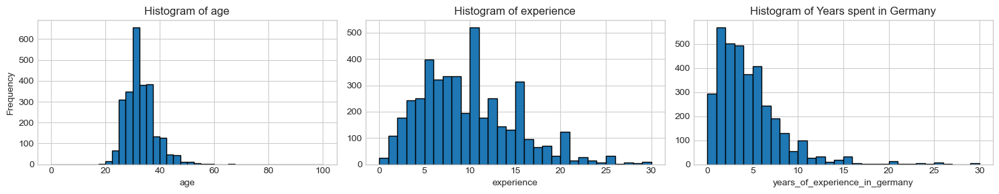

In [57]:
fig, axs = plt.subplots(1, 3, figsize=(15, 3), sharey=False)

# Plot histogram for the 'salary' column from the first DataFrame
axs[0].hist(df_it['age'], bins=40, range=(0, 100), edgecolor='black')
axs[0].set_title('Histogram of age')
axs[0].set_xlabel('age')
axs[0].set_ylabel('Frequency')

# Plot histogram for the 'salary' column from the second DataFrame
axs[1].hist(df_it['experience'], bins=30, range=(0, 30), edgecolor='black')
axs[1].set_title('Histogram of experience')
axs[1].set_xlabel('experience')

# Plot histogram for the 'salary' column from the third DataFrame
axs[2].hist(df_it['years_of_experience_in_germany'], bins=30, range=(0, 30), edgecolor='black')
axs[2].set_title('Histogram of Years spent in Germany')
axs[2].set_xlabel('years_of_experience_in_germany')

# Adjust layout
plt.tight_layout()

# Display the plot
plt.show()

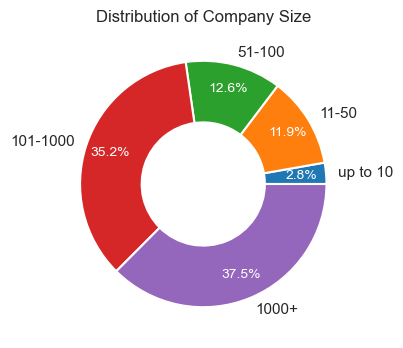

In [58]:
# df_k = pd.DataFrame({'education_level': ['Bsc', 'Msc', 'Phd', 'Msc', 'Bsc', 'Bsc', 'Phd', 'Msc']})

# Data to plot
education_counts = df_it['company_size'].value_counts().sort_values()
labels = education_counts.index
sizes = education_counts.values

# Create an explode list to separate slices for better readability
explode = [0.1] * len(labels)  # Explode all slices for visibility

# Create the ring plot (donut chart)
plt.figure(figsize=(4, 4))
wedges, texts, autotexts = plt.pie(
    sizes,
    #explode=explode,
    labels=labels,
    autopct='%1.1f%%',
    #shadow=True,
    startangle=0,
    pctdistance=0.8,  # Distance of percentage from the center
    labeldistance=1.1, # Distance of labels from the center
    wedgeprops=dict(width=0.5, edgecolor='white', linewidth=1.5)  # This creates the ring effect
)

# Formatting labels and percentages
for text in texts:
    text.set_fontsize(11)
for autotext in autotexts:
    autotext.set_fontsize(10)
    autotext.set_color('white')

plt.title('Distribution of Company Size')
plt.show()

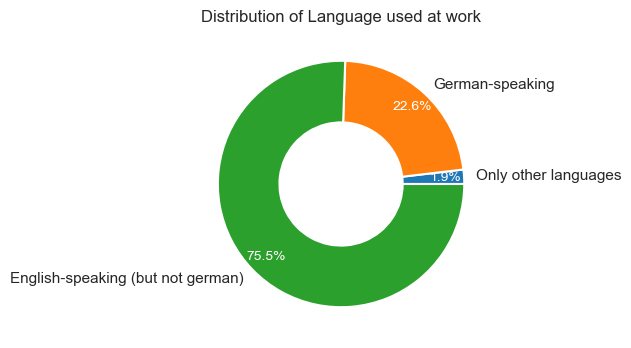

In [59]:
# Example DataFrame
# df_k = pd.DataFrame({'education_level': ['Bsc', 'Msc', 'Phd', 'Msc', 'Bsc', 'Bsc', 'Phd', 'Msc']})

# Data to plot
education_counts = df_it['language_category'].value_counts().sort_values()
labels = education_counts.index
sizes = education_counts.values

# Create an explode list to separate slices for better readability
explode = [0.1] * len(labels)  # Explode all slices for visibility

# Create the ring plot (donut chart)
plt.figure(figsize=(4, 4))
wedges, texts, autotexts = plt.pie(
    sizes,
    #explode=explode,
    labels=labels,
    autopct='%1.1f%%',
    #shadow=True,
    startangle=0,
    pctdistance=0.85,  # Distance of percentage from the center
    labeldistance=1.1, # Distance of labels from the center
    wedgeprops=dict(width=0.5, edgecolor='white', linewidth=1.5)  # This creates the ring effect
)

# Formatting labels and percentages
for text in texts:
    text.set_fontsize(11)
for autotext in autotexts:
    autotext.set_fontsize(10)
    autotext.set_color('white')

plt.title('Distribution of Language used at work')
plt.show()

In [60]:
# Count the number of respondents per seniority level
country_counts = df_it['language_at_work'].value_counts().reset_index()
country_counts.columns = ['language_at_work', 'Count']

# Create the treemap
fig = px.treemap(country_counts,
                 path=['language_at_work'],
                 values='Count',
                 title='Distribution language used at work',
                 color='language_at_work')
                 #color_discrete_map=custom_colors)

fig.update_layout(width=1200, height=600)

fig.show()

In [61]:
# Count the number of respondents per seniority level
country_counts = df_it['skills'].value_counts().reset_index()
country_counts.columns = ['skills', 'Count']

# Create the treemap
fig = px.treemap(country_counts,
                 path=['skills'],
                 values='Count',
                 title='Distribution of skills',
                 color='skills')
                 #color_discrete_map=custom_colors)

fig.update_layout(width=1200, height=600)

fig.show()

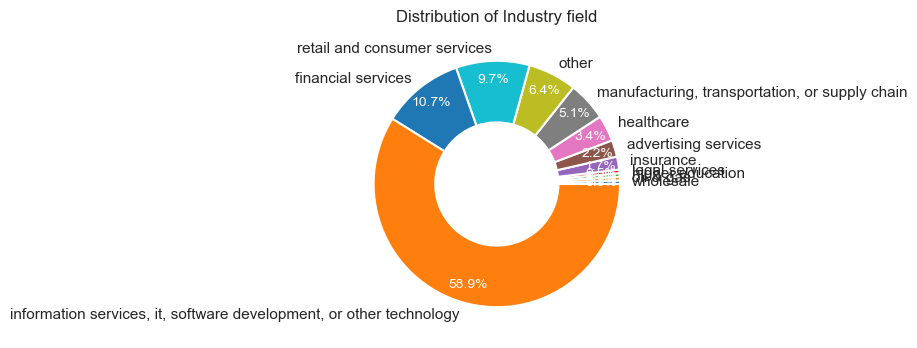

In [62]:
# Data to plot
education_counts = df_it['company_industry'].value_counts().sort_values()
labels = education_counts.index
sizes = education_counts.values

# Create an explode list to separate slices for better readability
explode = [0.1] * len(labels)  # Explode all slices for visibility

# Create the ring plot (donut chart)
plt.figure(figsize=(4, 4))
wedges, texts, autotexts = plt.pie(
    sizes,
    #explode=explode,
    labels=labels,
    autopct='%1.1f%%',
    #shadow=True,
    startangle=0,
    pctdistance=0.85,  # Distance of percentage from the center
    labeldistance=1.1, # Distance of labels from the center
    wedgeprops=dict(width=0.5, edgecolor='white', linewidth=1.5)  # This creates the ring effect
)

# Formatting labels and percentages
for text in texts:
    text.set_fontsize(11)
for autotext in autotexts:
    autotext.set_fontsize(10)
    autotext.set_color('white')

plt.title('Distribution of Industry field')
plt.show()

In [63]:
# Count the number of respondents per seniority level
country_counts = df_it['company_industry'].value_counts().reset_index()
country_counts.columns = ['company_industry', 'Count']

# Create the treemap
fig = px.treemap(country_counts,
                 path=['company_industry'],
                 values='Count',
                 title='Distribution of Industry',
                 color='company_industry')
                 #color_discrete_map=custom_colors)

fig.update_layout(width=1200, height=600)

fig.show()

In [64]:
# Count the number of respondents per seniority level
country_counts = df_it['job_category'].value_counts().reset_index()
country_counts.columns = ['job_category', 'Count']

# Create the treemap
fig = px.treemap(country_counts,
                 path=['job_category'],
                 values='Count',
                 title='Distribution of Job categories',
                 color='job_category')
                 #color_discrete_map=custom_colors)

fig.update_layout(width=1200, height=600)

fig.show()

## Kaggle-specific

In [66]:
df_k.head()

,age,country,education_level,job_title,job_title_2,company_size,salary_range,year,lower_salary,upper_salary,salary,industry,are_you_student,survey,seniority_level,company_size_category,country_code,median_income_2020_usd,mean_income_2020_usd,gdp_ppp_usd,glassdoor_software_engineer_usd,salary_normmed,salary_normmean,salary_normgdp,salary_normse,salary_norm,salary_2024,salary_norm_2024,salary_normmed_2024,salary_normmean_2024,salary_normgdp_2024,salary_normse_2024,job_category,salary_log,salary_2024_log,salary_norm_log,salary_norm_2024_log,salary_normmed_2024_log,salary_normmean_2024_log,salary_normgdp_2024_log,salary_normse_2024_log,z_score,modif_z_score,modif_z_score_signed
0,22-24,fr,master’s degree,software engineer,-1.00,"1000-9,999 employees","30,000-39,999",2019,30000.00,39999.00,34999.50,NaN,NaN,k,junior,l,fr,16372,19409,61157,58888.00,2.14,1.80,0.57,0.59,0.86,42130.49,1.03,2.57,2.17,0.69,0.72,Software Engineer,10.46,10.65,-0.16,0.03,0.95,0.78,-0.37,-0.33,0.32,0.08,0.08
1,40-44,au,master’s degree,other,0.00,"> 10,000 employees","250,000-299,999",2019,250000.00,299999.00,274999.50,NaN,NaN,k,junior,l,au,17076,21329,69115,81659.00,16.10,12.89,3.98,3.37,4.22,331029.43,5.09,19.39,15.52,4.79,4.05,"""Other""",12.52,12.71,1.44,1.63,2.96,2.74,1.57,1.40,1.55,1.33,1.33
2,22-24,ie,master’s degree,data analyst,-1.00,"1000-9,999 employees","20,000-24,999",2019,20000.00,24999.00,22499.50,NaN,NaN,k,junior,l,ie,14520,17938,127623,72221.00,1.55,1.25,0.18,0.31,0.26,27083.67,0.31,1.87,1.51,0.21,0.38,Data Analyst,10.02,10.21,-1.36,-1.18,0.62,0.41,-1.55,-0.98,0.12,0.12,-0.12
3,40-44,ru,master’s degree,software engineer,-1.00,50-249 employees,"10,000-14,999",2019,10000.00,14999.00,12499.50,NaN,NaN,k,junior,m,ru,5504,7275,44104,32076.00,2.27,1.72,0.28,0.39,0.82,15046.22,0.99,2.73,2.07,0.34,0.47,Software Engineer,9.43,9.62,-0.20,-0.01,1.01,0.73,-1.08,-0.76,0.35,0.12,0.12
4,30-34,gr,master’s degree,software engineer,-1.00,0-49 employees,"20,000-24,999",2019,20000.00,24999.00,22499.50,NaN,NaN,k,junior,s,gr,6936,8131,41187,21333.00,3.24,2.77,0.55,1.05,1.13,27083.67,1.37,3.90,3.33,0.66,1.27,Software Engineer,10.02,10.21,0.13,0.31,1.36,1.20,-0.42,0.24,0.57,0.34,0.34


In [67]:
df_k['education_level'].unique()

array(['master’s degree', 'bachelor’s degree', 'doctoral degree',
       'no degree'], dtype=object)

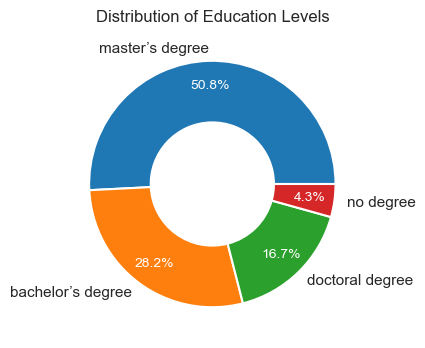

In [68]:
# df_k = pd.DataFrame({'education_level': ['Bsc', 'Msc', 'Phd', 'Msc', 'Bsc', 'Bsc', 'Phd', 'Msc']})

# Data to plot
education_counts = df_k['education_level'].value_counts()
labels = education_counts.index
sizes = education_counts.values

# Create an explode list to separate slices for better readability
explode = [0.1] * len(labels)  # Explode all slices for visibility

# Create the ring plot (donut chart)
plt.figure(figsize=(4, 4))
wedges, texts, autotexts = plt.pie(
    sizes,
    #explode=explode,
    labels=labels,
    autopct='%1.1f%%',
    #shadow=True,
    startangle=0,
    pctdistance=0.8,  # Distance of percentage from the center
    labeldistance=1.1, # Distance of labels from the center
    wedgeprops=dict(width=0.5, edgecolor='white', linewidth=1.5)  # This creates the ring effect
)

# Formatting labels and percentages
for text in texts:
    text.set_fontsize(11)
for autotext in autotexts:
    autotext.set_fontsize(10)
    autotext.set_color('white')

plt.title('Distribution of Education Levels')
plt.show()

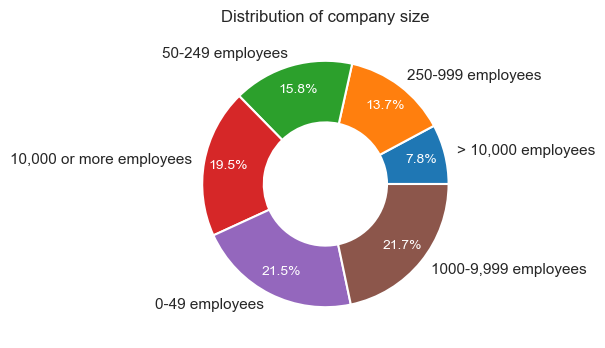

In [69]:
# Data to plot
education_counts = df_k['company_size'].value_counts().sort_values()
labels = education_counts.index
sizes = education_counts.values

# Create an explode list to separate slices for better readability
explode = [0.1] * len(labels)  # Explode all slices for visibility

# Create the ring plot (donut chart)
plt.figure(figsize=(4, 4))
wedges, texts, autotexts = plt.pie(
    sizes,
    #explode=explode,
    labels=labels,
    autopct='%1.1f%%',
    #shadow=True,
    startangle=0,
    pctdistance=0.8,  # Distance of percentage from the center
    labeldistance=1.1, # Distance of labels from the center
    wedgeprops=dict(width=0.5, edgecolor='white', linewidth=1.5)  # This creates the ring effect
)

# Formatting labels and percentages
for text in texts:
    text.set_fontsize(11)
for autotext in autotexts:
    autotext.set_fontsize(10)
    autotext.set_color('white')

plt.title('Distribution of company size')
plt.show()

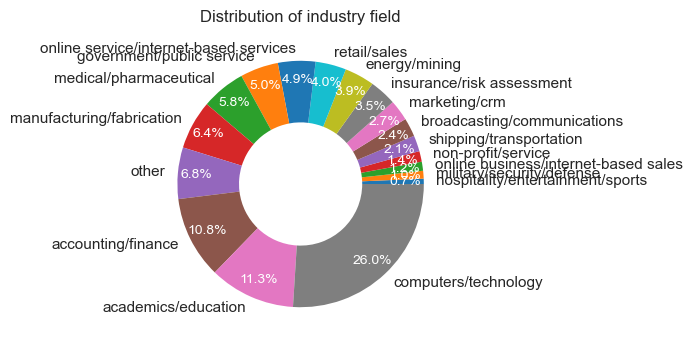

In [70]:
# Data to plot
education_counts = df_k['industry'].value_counts().sort_values()
labels = education_counts.index
sizes = education_counts.values

# Create an explode list to separate slices for better readability
explode = [0.1] * len(labels)  # Explode all slices for visibility

# Create the ring plot (donut chart)
plt.figure(figsize=(4, 4))
wedges, texts, autotexts = plt.pie(
    sizes,
    #explode=explode,
    labels=labels,
    autopct='%1.1f%%',
    #shadow=True,
    startangle=0,
    pctdistance=0.85,  # Distance of percentage from the center
    labeldistance=1.1, # Distance of labels from the center
    wedgeprops=dict(width=0.5)  # This creates the ring effect
)

# Formatting labels and percentages
for text in texts:
    text.set_fontsize(11)
for autotext in autotexts:
    autotext.set_fontsize(10)
    autotext.set_color('white')

plt.title('Distribution of industry field')
plt.show()

In [71]:
# Count the number of respondents per seniority level
country_counts = df_k['job_category'].value_counts().reset_index()
country_counts.columns = ['job_category', 'Count']

# Create the treemap
fig = px.treemap(country_counts,
                 path=['job_category'],
                 values='Count',
                 title='Distribution of job category',
                 color='job_category')
                 #color_discrete_map=custom_colors)

fig.update_layout(width=1200, height=600)

fig.show()

## AI-Jobs.net

In [73]:
df_ai.head()

,seniority_level,level_1,year,employment_status,job_title,salary_in_currency,salary_currency,salary,country,remote_ratio,company_location,company_size,ratio,survey,company_size_category,country_code,median_income_2020_usd,mean_income_2020_usd,gdp_ppp_usd,glassdoor_software_engineer_usd,salary_normmed,salary_normmean,salary_normgdp,salary_normse,salary_norm,salary_2024,salary_norm_2024,salary_normmed_2024,salary_normmean_2024,salary_normgdp_2024,salary_normse_2024,job_category,salary_log,salary_2024_log,salary_norm_log,salary_norm_2024_log,salary_normmed_2024_log,salary_normmean_2024_log,salary_normgdp_2024_log,salary_normse_2024_log,z_score,modif_z_score,modif_z_score_signed
0,junior,5,2024,ft,data analyst,102927,usd,102927,au,0,au,m,1.00,ai,m,au,17076,21329,69115,81659.00,6.03,4.83,1.49,1.26,1.58,102927.00,1.58,6.03,4.83,1.49,1.26,Data Analyst,11.54,11.54,0.46,0.46,1.80,1.57,0.40,0.23,0.36,0.54,0.54
1,junior,6,2024,ft,data analyst,95010,usd,95010,au,0,au,m,1.00,ai,m,au,17076,21329,69115,81659.00,5.56,4.45,1.37,1.16,1.46,95010.00,1.46,5.56,4.45,1.37,1.16,Data Analyst,11.46,11.46,0.38,0.38,1.72,1.49,0.32,0.15,0.21,0.37,0.37
2,junior,7,2024,ft,business intelligence analyst,157400,usd,157400,us,100,us,m,1.00,ai,m,us,19306,25332,81695,160899.00,8.15,6.21,1.93,0.98,2.06,157400.00,2.06,8.15,6.21,1.93,0.98,Business Analyst,11.97,11.97,0.72,0.72,2.10,1.83,0.66,-0.02,0.94,1.17,1.17
3,junior,8,2024,ft,business intelligence analyst,98600,usd,98600,us,100,us,m,1.00,ai,m,us,19306,25332,81695,160899.00,5.11,3.89,1.21,0.61,1.29,98600.00,1.29,5.11,3.89,1.21,0.61,Business Analyst,11.50,11.50,0.26,0.26,1.63,1.36,0.19,-0.49,0.05,0.19,0.19
4,junior,9,2024,ft,data analyst,83000,usd,83000,us,100,us,m,1.00,ai,m,us,19306,25332,81695,160899.00,4.30,3.28,1.02,0.52,1.09,83000.00,1.09,4.30,3.28,1.02,0.52,Data Analyst,11.33,11.33,0.08,0.08,1.46,1.19,0.02,-0.66,-0.28,0.17,-0.17


In [74]:
# Count the number of respondents per seniority level
country_counts = df_ai['job_category'].value_counts().reset_index()
country_counts.columns = ['job_category', 'Count']

# Create the treemap
fig = px.treemap(country_counts,
                 path=['job_category'],
                 values='Count',
                 title='Distribution of job category',
                 color='job_category')
                 #color_discrete_map=custom_colors)

fig.update_layout(width=1200, height=600)

fig.show()

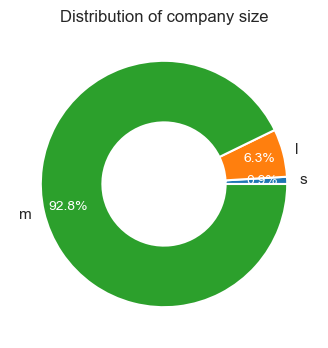

In [75]:
# Data to plot
education_counts = df_ai['company_size'].value_counts().sort_values()
labels = education_counts.index
sizes = education_counts.values

# Create an explode list to separate slices for better readability
explode = [0.1] * len(labels)  # Explode all slices for visibility

# Create the ring plot (donut chart)
plt.figure(figsize=(4, 4))
wedges, texts, autotexts = plt.pie(
    sizes,
    #explode=explode,
    labels=labels,
    autopct='%1.1f%%',
    #shadow=True,
    startangle=0,
    pctdistance=0.8,  # Distance of percentage from the center
    labeldistance=1.1, # Distance of labels from the center
    wedgeprops=dict(width=0.5, edgecolor='white', linewidth=1.5)  # This creates the ring effect
)

# Formatting labels and percentages
for text in texts:
    text.set_fontsize(11)
for autotext in autotexts:
    autotext.set_fontsize(10)
    autotext.set_color('white')

plt.title('Distribution of company size')
plt.show()

In [76]:
# Function to create a treemap figure for a given DataFrame
def create_treemap(df, title):
    counts = df['job_category'].value_counts().reset_index()
    counts.columns = ['Category', 'Count']
    fig = go.Figure(go.Treemap(
        labels=counts['Category'],
        parents=[''] * len(counts),
        values=counts['Count'],
        textinfo="label+value+percent entry",
        hoverinfo="label+value+percent entry"
    ))
    fig.update_layout(title=title, margin=dict(t=50, b=0, l=0, r=0))
    return fig

# Create individual treemaps
treemap_ai = create_treemap(df_ai, 'AI-Jobs.net job-categories distribution')
treemap_bi = create_treemap(df_it, 'DE-IT-Survey job-categories distribution')
treemap_ci = create_treemap(df_k, 'Kaggle job-categories distribution')

# Create subplots
fig = sp.make_subplots(
    rows=1, cols=3,
    subplot_titles=('AI Jobs Distribution', 'BI Jobs Distribution', 'CI Jobs Distribution'),
    specs=[[{'type': 'domain'}, {'type': 'domain'}, {'type': 'domain'}]]  # domain type for treemaps
)

# Add treemaps to subplots
for trace in treemap_ai.data:
    fig.add_trace(trace, row=1, col=1)
for trace in treemap_bi.data:
    fig.add_trace(trace, row=1, col=2)
for trace in treemap_ci.data:
    fig.add_trace(trace, row=1, col=3)

# Update layout
fig.update_layout(
    width=1300,
    height=600,
    title_text="Distribution of Job Categories",
    showlegend=False
)

fig.show()


# Strength of Association analysis

<div class="c">
Strength of association between categorical variables can give insight into multicollinearity.<br>
Multicollinearity takes assiociation it one-step further, by not only assessing correlation, but also taking into account whether the correlating variables predict the dependent variable or not.<br>
But strength of association is a good initial, comprehensible step.
</div> 

In [79]:
from scipy.stats import chi2_contingency
from scipy.stats import chi2

In [80]:
# Function to calculate Cramér's V and its confidence interval
def cramers_v_ci(x, y, alpha=0.05):
    confusion_matrix = pd.crosstab(x, y)
    chi2_stat = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    r, k = confusion_matrix.shape
    cramers_v_value = np.sqrt(chi2_stat / (n * (min(r, k) - 1)))
    
    # Calculate confidence interval for chi-squared statistic
    df = (r - 1) * (k - 1)  # degrees of freedom
    chi2_lower = chi2.ppf(alpha / 2, df)
    chi2_upper = chi2.ppf(1 - alpha / 2, df)
    
    # Convert chi-squared CIs to Cramér's V CIs
    lower_v = np.sqrt(chi2_lower / (n * (min(r, k) - 1)))
    upper_v = np.sqrt(chi2_upper / (n * (min(r, k) - 1)))
    
    return cramers_v_value, lower_v, upper_v

## Ai-jobs.

In [82]:
categorical_columns = ['seniority_level', 'country', 'job_category', 'year', 'company_size','company_location']
df_name = df_ai.copy()

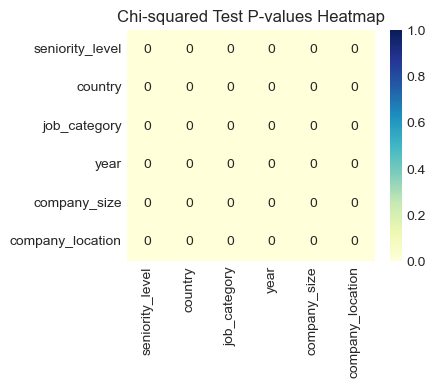

In [83]:
# Create an empty DataFrame to store Chi-squared p-values
chi2_p_matrix = pd.DataFrame(np.ones((len(categorical_columns), len(categorical_columns))), 
                             index=categorical_columns, columns=categorical_columns)

# Calculate the Chi-squared test p-value for each pair of categorical variables
for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            confusion_matrix = pd.crosstab(df_name[col1], df_name[col2])
            chi2_var, p, _, _ = chi2_contingency(confusion_matrix)
            chi2_p_matrix.loc[col1, col2] = p
        else:
            chi2_p_matrix.loc[col1, col2] = 0.0  # No p-value for comparison with itself

# Round the p-values to three decimal places for better readability
chi2_p_matrix_rounded = chi2_p_matrix.round(3)

# Plotting the heatmap with rounded p-values
plt.figure(figsize=(4, 3))
sns.heatmap(chi2_p_matrix_rounded, annot=True, cmap='YlGnBu', vmin=0, vmax=1)
plt.title("Chi-squared Test P-values Heatmap")
plt.show()

The p-values in this heatmap indicate whether there is a statistically significant association between each pair of categorical variables.
A p-value < 0.05 (common threshold) suggests a statistically significant association, meaning the relationship is unlikely to have occurred by chance.

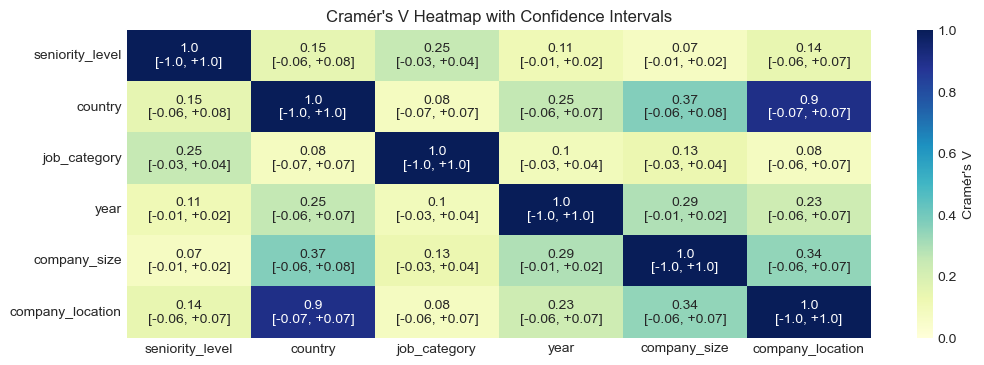

In [85]:
# Create an empty DataFrame to store Cramér's V values and confidence intervals
cramers_v_matrix = pd.DataFrame(np.zeros((len(categorical_columns), len(categorical_columns))), 
                                index=categorical_columns, columns=categorical_columns)
ci_matrix_lower = pd.DataFrame(np.zeros((len(categorical_columns), len(categorical_columns))), 
                               index=categorical_columns, columns=categorical_columns)
ci_matrix_upper = pd.DataFrame(np.zeros((len(categorical_columns), len(categorical_columns))), 
                               index=categorical_columns, columns=categorical_columns)

# Calculate Cramér's V and confidence intervals for each pair of categorical variables
for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            v, lower_v, upper_v = cramers_v_ci(df_name[col1], df_name[col2])
            cramers_v_matrix.loc[col1, col2] = v
            ci_matrix_lower.loc[col1, col2] = lower_v
            ci_matrix_upper.loc[col1, col2] = upper_v
        else:
            cramers_v_matrix.loc[col1, col2] = 1.0  # Perfect correlation with itself
            ci_matrix_lower.loc[col1, col2] = 1.0
            ci_matrix_upper.loc[col1, col2] = 1.0

# Combine Cramér's V values and confidence intervals into one annotation format
annot_matrix = cramers_v_matrix.round(2).astype(str) + "\n[-" + ci_matrix_lower.round(2).astype(str) + ", +" + ci_matrix_upper.round(2).astype(str) + "]"

# Plotting the heatmap with annotations
plt.figure(figsize=(12, 4))
sns.heatmap(cramers_v_matrix, annot=annot_matrix, fmt='', cmap='YlGnBu', vmin=0, vmax=1, cbar_kws={'label': "Cramér's V"})
plt.title("Cramér's V Heatmap with Confidence Intervals")
plt.show()

## DE IT-survey

In [87]:
categorical_columns = ['seniority_level', 'job_category', 'year','experience', 'company_type', 'company_size', 'language_at_work', 'years_of_experience_in_germany']
df_name = df_it.copy()

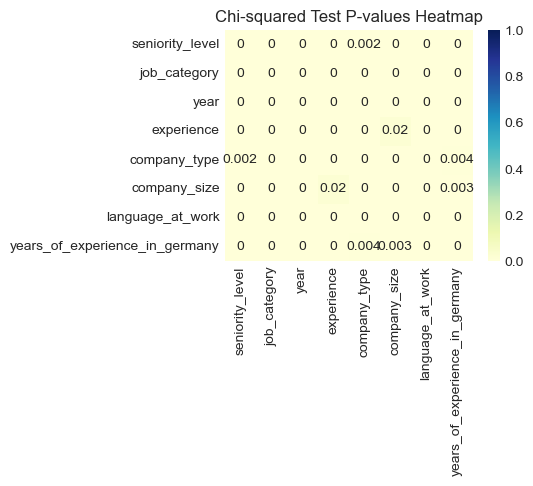

In [88]:
# Create an empty DataFrame to store Chi-squared p-values
chi2_p_matrix = pd.DataFrame(np.ones((len(categorical_columns), len(categorical_columns))), 
                             index=categorical_columns, columns=categorical_columns)

# Calculate the Chi-squared test p-value for each pair of categorical variables
for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            confusion_matrix = pd.crosstab(df_name[col1], df_name[col2])
            chi2_var, p, _, _ = chi2_contingency(confusion_matrix)
            chi2_p_matrix.loc[col1, col2] = p
        else:
            chi2_p_matrix.loc[col1, col2] = 0.0  # No p-value for comparison with itself

# Round the p-values to three decimal places for better readability
chi2_p_matrix_rounded = chi2_p_matrix.round(3)

# Plotting the heatmap with rounded p-values
plt.figure(figsize=(4, 3))
sns.heatmap(chi2_p_matrix_rounded, annot=True, cmap='YlGnBu', vmin=0, vmax=1)
plt.title("Chi-squared Test P-values Heatmap")
plt.show()

The p-values in this heatmap indicate whether there is a statistically significant association between each pair of categorical variables.
A p-value < 0.05 (common threshold) suggests a statistically significant association, meaning the relationship is unlikely to have occurred by chance.

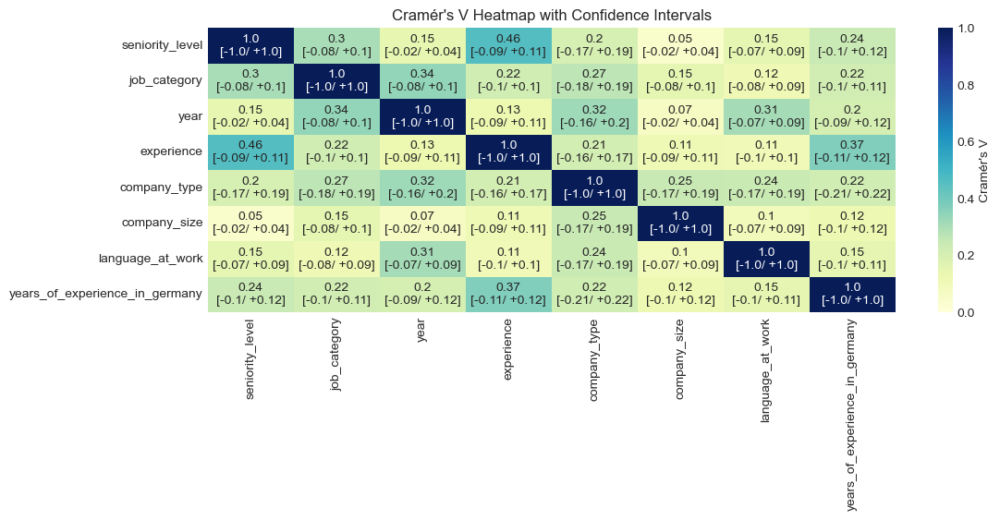

In [90]:
# Create an empty DataFrame to store Cramér's V values and confidence intervals
cramers_v_matrix = pd.DataFrame(np.zeros((len(categorical_columns), len(categorical_columns))), 
                                index=categorical_columns, columns=categorical_columns)
ci_matrix_lower = pd.DataFrame(np.zeros((len(categorical_columns), len(categorical_columns))), 
                               index=categorical_columns, columns=categorical_columns)
ci_matrix_upper = pd.DataFrame(np.zeros((len(categorical_columns), len(categorical_columns))), 
                               index=categorical_columns, columns=categorical_columns)

# Calculate Cramér's V and confidence intervals for each pair of categorical variables
for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            v, lower_v, upper_v = cramers_v_ci(df_name[col1], df_name[col2])
            cramers_v_matrix.loc[col1, col2] = v
            ci_matrix_lower.loc[col1, col2] = lower_v
            ci_matrix_upper.loc[col1, col2] = upper_v
        else:
            cramers_v_matrix.loc[col1, col2] = 1.0  # Perfect correlation with itself
            ci_matrix_lower.loc[col1, col2] = 1.0
            ci_matrix_upper.loc[col1, col2] = 1.0

# Combine Cramér's V values and confidence intervals into one annotation format
annot_matrix = cramers_v_matrix.round(2).astype(str) + "\n[-" + ci_matrix_lower.round(2).astype(str) + "/ +" + ci_matrix_upper.round(2).astype(str) + "]"

# Plotting the heatmap with annotations
plt.figure(figsize=(12, 4))
sns.heatmap(cramers_v_matrix, annot=annot_matrix, fmt='', cmap='YlGnBu', vmin=0, vmax=1, cbar_kws={'label': "Cramér's V"})
plt.title("Cramér's V Heatmap with Confidence Intervals")
plt.show()

## Kaggle

In [92]:
categorical_columns = ['seniority_level', 'country', 'job_category', 'year','education_level', 'company_size']
df_name = df_k.copy()

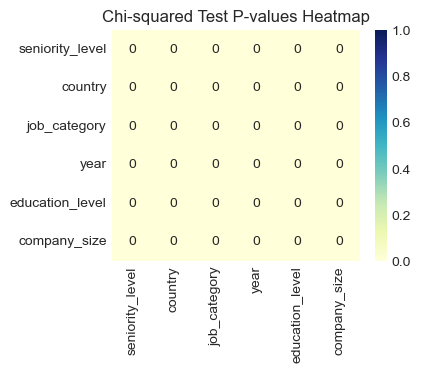

In [93]:
# Create an empty DataFrame to store Chi-squared p-values
chi2_p_matrix = pd.DataFrame(np.ones((len(categorical_columns), len(categorical_columns))), 
                             index=categorical_columns, columns=categorical_columns)

# Calculate the Chi-squared test p-value for each pair of categorical variables
for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            confusion_matrix = pd.crosstab(df_name[col1], df_name[col2])
            chi2_var, p, _, _ = chi2_contingency(confusion_matrix)
            chi2_p_matrix.loc[col1, col2] = p
        else:
            chi2_p_matrix.loc[col1, col2] = 0.0  # No p-value for comparison with itself

# Round the p-values to three decimal places for better readability
chi2_p_matrix_rounded = chi2_p_matrix.round(3)

# Plotting the heatmap with rounded p-values
plt.figure(figsize=(4, 3))
sns.heatmap(chi2_p_matrix_rounded, annot=True, cmap='YlGnBu', vmin=0, vmax=1)
plt.title("Chi-squared Test P-values Heatmap")
plt.show()

The p-values in this heatmap indicate whether there is a statistically significant association between each pair of categorical variables.
A p-value < 0.05 (common threshold) suggests a statistically significant association, meaning the relationship is unlikely to have occurred by chance.

In [95]:
# Encode categorical variables using .cat.codes
for column in ['seniority_level', 'country', 'job_category', 'year','education_level', 'company_size']:
    df_name[column] = df_name[column].astype('category').cat.codes

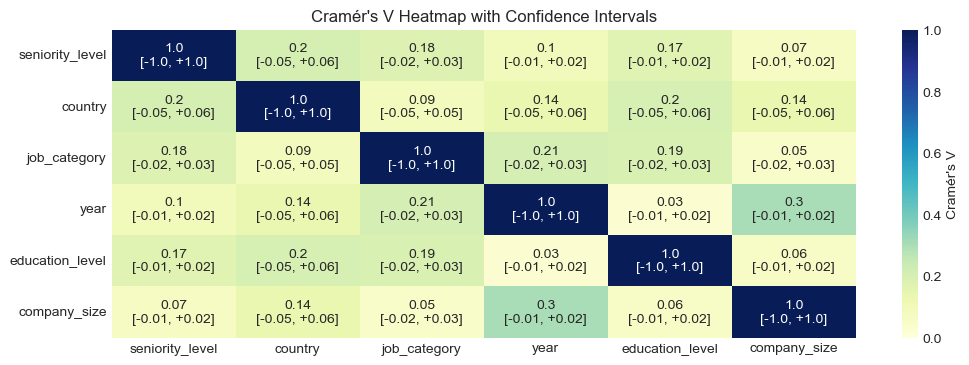

In [96]:
# Create an empty DataFrame to store Cramér's V values and confidence intervals
cramers_v_matrix = pd.DataFrame(np.zeros((len(categorical_columns), len(categorical_columns))), 
                                index=categorical_columns, columns=categorical_columns)
ci_matrix_lower = pd.DataFrame(np.zeros((len(categorical_columns), len(categorical_columns))), 
                               index=categorical_columns, columns=categorical_columns)
ci_matrix_upper = pd.DataFrame(np.zeros((len(categorical_columns), len(categorical_columns))), 
                               index=categorical_columns, columns=categorical_columns)

# Calculate Cramér's V and confidence intervals for each pair of categorical variables
for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            v, lower_v, upper_v = cramers_v_ci(df_name[col1], df_name[col2])
            cramers_v_matrix.loc[col1, col2] = v
            ci_matrix_lower.loc[col1, col2] = lower_v
            ci_matrix_upper.loc[col1, col2] = upper_v
        else:
            cramers_v_matrix.loc[col1, col2] = 1.0  # Perfect correlation with itself
            ci_matrix_lower.loc[col1, col2] = 1.0
            ci_matrix_upper.loc[col1, col2] = 1.0

# Combine Cramér's V values and confidence intervals into one annotation format
annot_matrix = cramers_v_matrix.round(2).astype(str) + "\n[-" + ci_matrix_lower.round(2).astype(str) + ", +" + ci_matrix_upper.round(2).astype(str) + "]"

# Plotting the heatmap with annotations
plt.figure(figsize=(12, 4))
sns.heatmap(cramers_v_matrix, annot=annot_matrix, fmt='', cmap='YlGnBu', vmin=0, vmax=1, cbar_kws={'label': "Cramér's V"})
plt.title("Cramér's V Heatmap with Confidence Intervals")
plt.show()

In [97]:
df_k.head()

,age,country,education_level,job_title,job_title_2,company_size,salary_range,year,lower_salary,upper_salary,salary,industry,are_you_student,survey,seniority_level,company_size_category,country_code,median_income_2020_usd,mean_income_2020_usd,gdp_ppp_usd,glassdoor_software_engineer_usd,salary_normmed,salary_normmean,salary_normgdp,salary_normse,salary_norm,salary_2024,salary_norm_2024,salary_normmed_2024,salary_normmean_2024,salary_normgdp_2024,salary_normse_2024,job_category,salary_log,salary_2024_log,salary_norm_log,salary_norm_2024_log,salary_normmed_2024_log,salary_normmean_2024_log,salary_normgdp_2024_log,salary_normse_2024_log,z_score,modif_z_score,modif_z_score_signed
0,22-24,fr,master’s degree,software engineer,-1.00,"1000-9,999 employees","30,000-39,999",2019,30000.00,39999.00,34999.50,NaN,NaN,k,junior,l,fr,16372,19409,61157,58888.00,2.14,1.80,0.57,0.59,0.86,42130.49,1.03,2.57,2.17,0.69,0.72,Software Engineer,10.46,10.65,-0.16,0.03,0.95,0.78,-0.37,-0.33,0.32,0.08,0.08
1,40-44,au,master’s degree,other,0.00,"> 10,000 employees","250,000-299,999",2019,250000.00,299999.00,274999.50,NaN,NaN,k,junior,l,au,17076,21329,69115,81659.00,16.10,12.89,3.98,3.37,4.22,331029.43,5.09,19.39,15.52,4.79,4.05,"""Other""",12.52,12.71,1.44,1.63,2.96,2.74,1.57,1.40,1.55,1.33,1.33
2,22-24,ie,master’s degree,data analyst,-1.00,"1000-9,999 employees","20,000-24,999",2019,20000.00,24999.00,22499.50,NaN,NaN,k,junior,l,ie,14520,17938,127623,72221.00,1.55,1.25,0.18,0.31,0.26,27083.67,0.31,1.87,1.51,0.21,0.38,Data Analyst,10.02,10.21,-1.36,-1.18,0.62,0.41,-1.55,-0.98,0.12,0.12,-0.12
3,40-44,ru,master’s degree,software engineer,-1.00,50-249 employees,"10,000-14,999",2019,10000.00,14999.00,12499.50,NaN,NaN,k,junior,m,ru,5504,7275,44104,32076.00,2.27,1.72,0.28,0.39,0.82,15046.22,0.99,2.73,2.07,0.34,0.47,Software Engineer,9.43,9.62,-0.20,-0.01,1.01,0.73,-1.08,-0.76,0.35,0.12,0.12
4,30-34,gr,master’s degree,software engineer,-1.00,0-49 employees,"20,000-24,999",2019,20000.00,24999.00,22499.50,NaN,NaN,k,junior,s,gr,6936,8131,41187,21333.00,3.24,2.77,0.55,1.05,1.13,27083.67,1.37,3.90,3.33,0.66,1.27,Software Engineer,10.02,10.21,0.13,0.31,1.36,1.20,-0.42,0.24,0.57,0.34,0.34


<div class="c">
Conclusion:
Chi-squared test showed significance everywhere, meaning, some form of correlation is always lurking in the background.<br>
But this can be expected with large numbers of datapoints and a relatively small amount of categorical variables.<br>
<br>
Cramér's V is a more insightful parameter, quantifying the strength of association in a [0,1] interval; 0 being no- and 1 being total correlation.<br>
For most cases, Cramér's V is below 0.2 which is a good result, but there are some instances of 0.3 & 0.4 values, which gives a warning the possibility of multicollinearity in the future.<br>
    <br>
Also, there are some trivial correlations of course, taking on high numbers: Country & Company_location, and Experience # Seniority_level for example. This is to be expected, and just gives some relief that the code is working well.
</div> 

# Visualizing

<div class="c">
Discovering insights and formulating a feeling of the independent variables can best be achieved with visualizations.<br>
This is subjective, can be iterated over endlessly, and many consider it an artform.<br>
I report here only the most interesting plots/insights I discovered.
</div> 

## Histograms

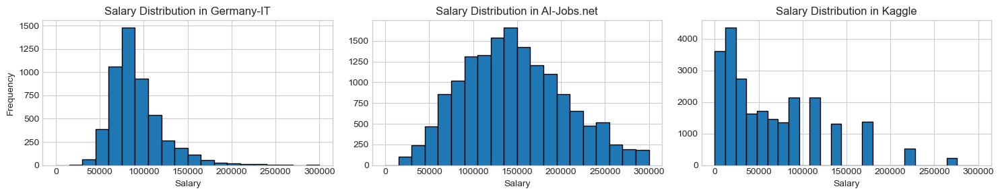

In [102]:
fig, axs = plt.subplots(1, 3, figsize=(15, 3), sharey=False)

# Plot histogram for the 'salary' column from the first DataFrame
axs[0].hist(df_it['salary'], bins=20, range=(0, 300000), edgecolor='black')
axs[0].set_title('Salary Distribution in Germany-IT')
axs[0].set_xlabel('Salary')
axs[0].set_ylabel('Frequency')

# Plot histogram for the 'salary' column from the second DataFrame
axs[1].hist(df_ai['salary'], bins=20, range=(0, 300000), edgecolor='black')
axs[1].set_title('Salary Distribution in AI-Jobs.net')
axs[1].set_xlabel('Salary')

# Plot histogram for the 'salary' column from the third DataFrame
axs[2].hist(df_k['salary'], bins=25, range=(0, 300000), edgecolor='black')
axs[2].set_title('Salary Distribution in Kaggle')
axs[2].set_xlabel('Salary')

# Adjust layout
plt.tight_layout()

# Display the plot
plt.show()

<div class="n">
The plot above is a very rough histogram of the salary data without control for any independent variable.<br>
At this stage, this was very frightful to observe, how different shape they take on!
</div> 

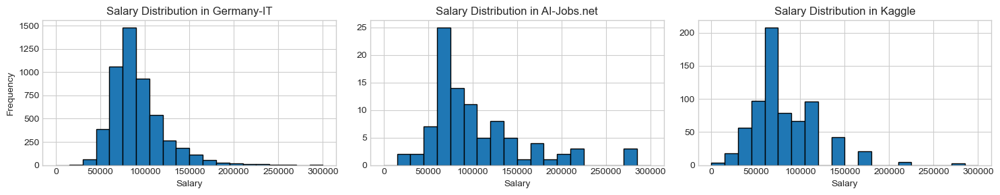

In [104]:
fig, axs = plt.subplots(1, 3, figsize=(15, 3), sharey=False)

# Plot histogram for the 'salary' column from the first DataFrame
axs[0].hist(df_it['salary'][df_it['country']=='de'], bins=20, range=(0, 300000), edgecolor='black')
axs[0].set_title('Salary Distribution in Germany-IT')
axs[0].set_xlabel('Salary')
axs[0].set_ylabel('Frequency')

# Plot histogram for the 'salary' column from the second DataFrame
axs[1].hist(df_ai['salary'][df_ai['country']=='de'], bins=20, range=(0, 300000), edgecolor='black')
axs[1].set_title('Salary Distribution in AI-Jobs.net')
axs[1].set_xlabel('Salary')

# Plot histogram for the 'salary' column from the third DataFrame
axs[2].hist(df_k['salary'][df_k['country']=='de'], bins=20, range=(0, 300000), edgecolor='black')
axs[2].set_title('Salary Distribution in Kaggle')
axs[2].set_xlabel('Salary')

# Adjust layout
plt.tight_layout()

# Display the plot
plt.show()

<div class="n">
Normalizing by country; it is starting to take shape.
</div> 

In [106]:
df_k.head(2)

,age,country,education_level,job_title,job_title_2,company_size,salary_range,year,lower_salary,upper_salary,salary,industry,are_you_student,survey,seniority_level,company_size_category,country_code,median_income_2020_usd,mean_income_2020_usd,gdp_ppp_usd,glassdoor_software_engineer_usd,salary_normmed,salary_normmean,salary_normgdp,salary_normse,salary_norm,salary_2024,salary_norm_2024,salary_normmed_2024,salary_normmean_2024,salary_normgdp_2024,salary_normse_2024,job_category,salary_log,salary_2024_log,salary_norm_log,salary_norm_2024_log,salary_normmed_2024_log,salary_normmean_2024_log,salary_normgdp_2024_log,salary_normse_2024_log,z_score,modif_z_score,modif_z_score_signed
0,22-24,fr,master’s degree,software engineer,-1.00,"1000-9,999 employees","30,000-39,999",2019,30000.00,39999.00,34999.50,NaN,NaN,k,junior,l,fr,16372,19409,61157,58888.00,2.14,1.80,0.57,0.59,0.86,42130.49,1.03,2.57,2.17,0.69,0.72,Software Engineer,10.46,10.65,-0.16,0.03,0.95,0.78,-0.37,-0.33,0.32,0.08,0.08
1,40-44,au,master’s degree,other,0.00,"> 10,000 employees","250,000-299,999",2019,250000.00,299999.00,274999.50,NaN,NaN,k,junior,l,au,17076,21329,69115,81659.00,16.10,12.89,3.98,3.37,4.22,331029.43,5.09,19.39,15.52,4.79,4.05,"""Other""",12.52,12.71,1.44,1.63,2.96,2.74,1.57,1.40,1.55,1.33,1.33


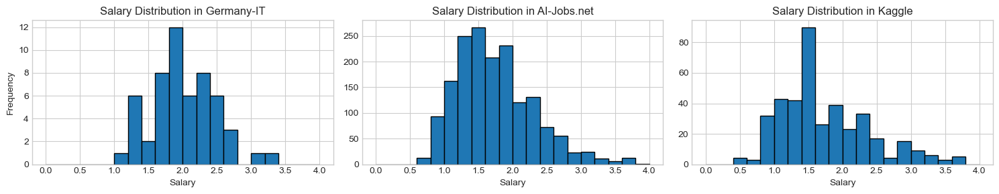

In [107]:
fig, axs = plt.subplots(1, 3, figsize=(15, 3), sharey=False)

# Plot histogram for the 'salary' column from the first DataFrame
axs[0].hist(df_it['salary_norm'][(df_it['seniority_level']=='senior') & (df_it['job_category']=='Data Analyst')], bins=20, range=(0, 4), edgecolor='black')
axs[0].set_title('Salary Distribution in Germany-IT')
axs[0].set_xlabel('Salary')
axs[0].set_ylabel('Frequency')

# Plot histogram for the 'salary' column from the second DataFrame
axs[1].hist(df_ai['salary_norm'][(df_ai['seniority_level']=='senior') & (df_ai['job_category']=='Data Analyst')], bins=20, range=(0, 4), edgecolor='black')
axs[1].set_title('Salary Distribution in AI-Jobs.net')
axs[1].set_xlabel('Salary')

# Plot histogram for the 'salary' column from the third DataFrame
axs[2].hist(df_k['salary_norm'][(df_k['seniority_level']=='senior') & (df_k['job_category']=='Data Analyst')], bins=20, range=(0, 4), edgecolor='black')
axs[2].set_title('Salary Distribution in Kaggle')
axs[2].set_xlabel('Salary')

# Adjust layout
plt.tight_layout()

# Display the plot
plt.show()

<div class="n">
Normalizing by country, seniority-level and Job_category, the data is very much in shape!<br>
<br>
Note:<br>
Germany-IT survey is exlusively from germany; while the other 2 surveys have sparse data from germany.<br>
This is where normalization by gdp-per-capita comes in place: To [try to] utilize the many datapoints of different surveys, yet be able to compare to an exslusively german survey.
</div> 

<div class="c">
Conclusion:<br>
<br>
The distributions are often skewed to the right. This is expected of salary data.<br>
For measuring central tendency, Median is reasonable.<br>
<br>
The more variable I control for, the more similar the ditributions become. This is expected, and substantiates a multivariate analysis that controls for multiple variables.
</div> 

## Yearly trends

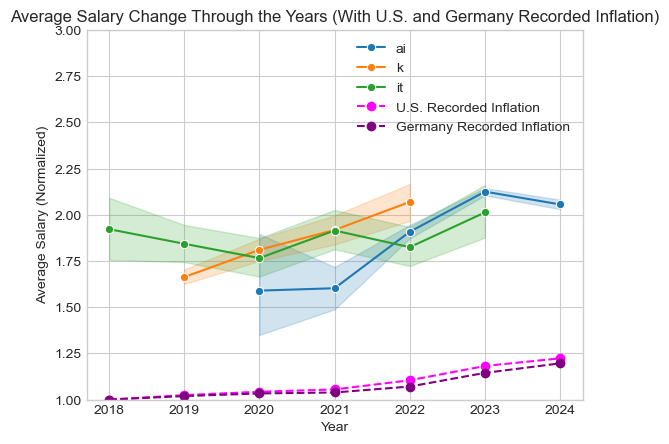

In [111]:
# Real U.S. inflation rates from 2018 to 2024
us_inflation_rates = [1.024, 1.018, 1.012, 1.047, 1.070, 1.035, 1.030]  # Approximate U.S. inflation rates

# Real Germany inflation rates from 2018 to 2024
germany_inflation_rates = [1.019, 1.014, 1.005, 1.031, 1.069, 1.045, 1.030]  # Approximate Germany inflation rates

# Create inflation values starting from 1.0 in 2018 for both countries
inflation_values_us = [1.0]  # Start at 1.0 in 2018 for the U.S.
inflation_values_germany = [1.0]  # Start at 1.0 in 2018 for Germany

for rate_us, rate_germany in zip(us_inflation_rates, germany_inflation_rates):
    inflation_values_us.append(inflation_values_us[-1] * rate_us)
    inflation_values_germany.append(inflation_values_germany[-1] * rate_germany)

# Create DataFrames for U.S. and Germany inflation values
years = np.arange(2018, 2025)  # Years from 2018 to 2024 inclusive
df_inflation_us = pd.DataFrame({
    'year': years,
    'inflation_factor_us': inflation_values_us[:-1]  # Remove the last extrapolation
})

df_inflation_germany = pd.DataFrame({
    'year': years,
    'inflation_factor_germany': inflation_values_germany[:-1]  # Remove the last extrapolation
})

# Plot the normalized salary data
sns.lineplot(data=df_data, x='year', y='salary_norm', hue='survey', marker='o')

# Plot the U.S. recorded inflation line
plt.plot(df_inflation_us['year'], df_inflation_us['inflation_factor_us'], color='magenta', linestyle='--', marker='o', label='U.S. Recorded Inflation')
# Plot the Germany recorded inflation line
plt.plot(df_inflation_germany['year'], df_inflation_germany['inflation_factor_germany'], color='purple', linestyle='--', marker='o', label='Germany Recorded Inflation')

# Customize plot appearance
plt.title('Average Salary Change Through the Years (With U.S. and Germany Recorded Inflation)')
plt.xlabel('Year')
plt.ylabel('Average Salary (Normalized)')
plt.ylim(1, 3)
plt.grid(True)
plt.legend()

# Show the plot
plt.show()

<div class="n">
For comparison, I added the yearly inflation curves (in a cumulative fashion) from US and Germany<br>
</div> 

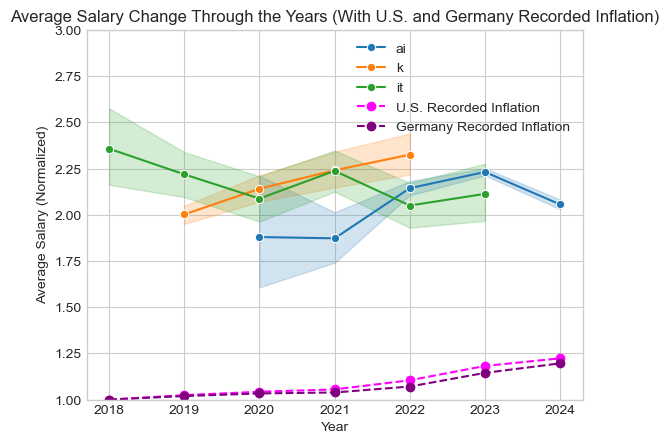

In [113]:
# Real U.S. inflation rates from 2018 to 2024
us_inflation_rates = [1.024, 1.018, 1.012, 1.047, 1.070, 1.035, 1.030]  # Approximate U.S. inflation rates

# Real Germany inflation rates from 2018 to 2024
germany_inflation_rates = [1.019, 1.014, 1.005, 1.031, 1.069, 1.045, 1.030]  # Approximate Germany inflation rates

# Create inflation values starting from 1.0 in 2018 for both countries
inflation_values_us = [1.0]  # Start at 1.0 in 2018 for the U.S.
inflation_values_germany = [1.0]  # Start at 1.0 in 2018 for Germany

for rate_us, rate_germany in zip(us_inflation_rates, germany_inflation_rates):
    inflation_values_us.append(inflation_values_us[-1] * rate_us)
    inflation_values_germany.append(inflation_values_germany[-1] * rate_germany)

# Create DataFrames for U.S. and Germany inflation values
years = np.arange(2018, 2025)  # Years from 2018 to 2024 inclusive
df_inflation_us = pd.DataFrame({
    'year': years,
    'inflation_factor_us': inflation_values_us[:-1]  # Remove the last extrapolation
})

df_inflation_germany = pd.DataFrame({
    'year': years,
    'inflation_factor_germany': inflation_values_germany[:-1]  # Remove the last extrapolation
})

# Plot the normalized salary data
sns.lineplot(data=df_data, x='year', y='salary_norm_2024', hue='survey', marker='o')

# Plot the U.S. recorded inflation line
plt.plot(df_inflation_us['year'], df_inflation_us['inflation_factor_us'], color='magenta', linestyle='--', marker='o', label='U.S. Recorded Inflation')
# Plot the Germany recorded inflation line
plt.plot(df_inflation_germany['year'], df_inflation_germany['inflation_factor_germany'], color='purple', linestyle='--', marker='o', label='Germany Recorded Inflation')

# Customize plot appearance
plt.title('Average Salary Change Through the Years (With U.S. and Germany Recorded Inflation)')
plt.xlabel('Year')
plt.ylabel('Average Salary (Normalized)')
plt.ylim(1, 3)
plt.grid(True)
plt.legend()

# Show the plot
plt.show()

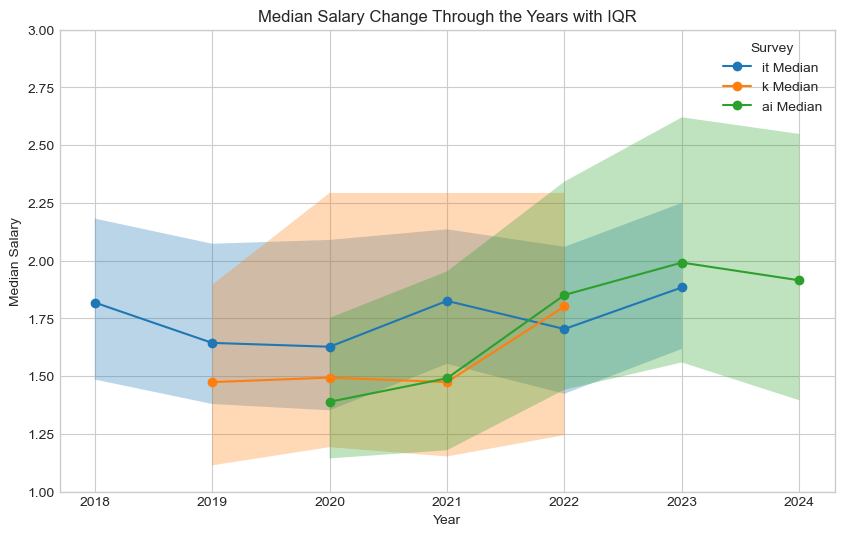

In [114]:
# Compute median salary, Q1, and Q3 for each combination of year and survey
summary_stats = df_data.groupby(['year', 'survey'])['salary_norm'].describe(percentiles=[.25, .75]).reset_index()

# Rename columns for clarity
summary_stats = summary_stats.rename(columns={'25%': 'Q1', '75%': 'Q3'})

# Compute IQR
summary_stats['IQR'] = summary_stats['Q3'] - summary_stats['Q1']

# Plot the median salary with IQR as shaded region
plt.figure(figsize=(10, 6))
for survey in summary_stats['survey'].unique():
    survey_data = summary_stats[summary_stats['survey'] == survey]
    plt.plot(survey_data['year'], survey_data['50%'], marker='o', label=f'{survey} Median')
    plt.fill_between(survey_data['year'], survey_data['Q1'], survey_data['Q3'], alpha=0.3)

plt.title('Median Salary Change Through the Years with IQR')
plt.xlabel('Year')
plt.ylabel('Median Salary')
plt.ylim(1, 3)
plt.grid(True)
plt.legend(title='Survey')
plt.show()


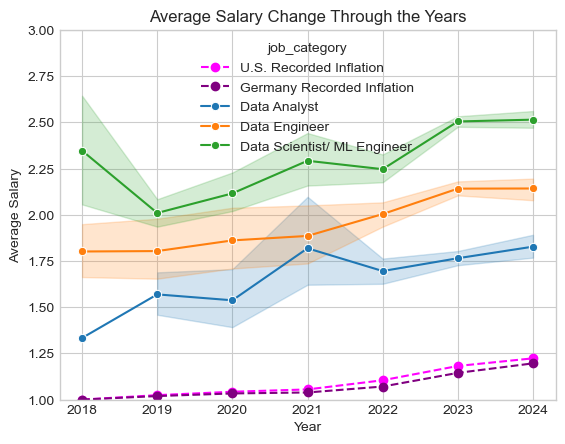

In [115]:
df_data_plot = df_data.copy()
df_data_plot = df_data_plot[df_data_plot['country'].isin(western_countries)]
#df_data_plot = df_data
df_data_plot = df_data_plot[df_data_plot['seniority_level'] == 'senior']
#df_data_plot = df_data_plot[~((df_data_plot['survey'] == 'ai') & (df_data_plot['year'] == 2020))]



# Real U.S. inflation rates from 2018 to 2024
us_inflation_rates = [1.024, 1.018, 1.012, 1.047, 1.070, 1.035, 1.030]  # Approximate U.S. inflation rates

# Real Germany inflation rates from 2018 to 2024
germany_inflation_rates = [1.019, 1.014, 1.005, 1.031, 1.069, 1.045, 1.030]  # Approximate Germany inflation rates

# Create inflation values starting from 1.0 in 2018 for both countries
inflation_values_us = [1.0]  # Start at 1.0 in 2018 for the U.S.
inflation_values_germany = [1.0]  # Start at 1.0 in 2018 for Germany

for rate_us, rate_germany in zip(us_inflation_rates, germany_inflation_rates):
    inflation_values_us.append(inflation_values_us[-1] * rate_us)
    inflation_values_germany.append(inflation_values_germany[-1] * rate_germany)

# Create DataFrames for U.S. and Germany inflation values
years = np.arange(2018, 2025)  # Years from 2018 to 2024 inclusive
df_inflation_us = pd.DataFrame({
    'year': years,
    'inflation_factor_us': inflation_values_us[:-1]  # Remove the last extrapolation
})

df_inflation_germany = pd.DataFrame({
    'year': years,
    'inflation_factor_germany': inflation_values_germany[:-1]  # Remove the last extrapolation
})

# Plot the U.S. recorded inflation line
plt.plot(df_inflation_us['year'], df_inflation_us['inflation_factor_us'], color='magenta', linestyle='--', marker='o', label='U.S. Recorded Inflation')
# Plot the Germany recorded inflation line
plt.plot(df_inflation_germany['year'], df_inflation_germany['inflation_factor_germany'], color='purple', linestyle='--', marker='o', label='Germany Recorded Inflation')



sns.lineplot(data=df_data_plot, x='year', y='salary_norm', hue='job_category', marker='o')

plt.title('Average Salary Change Through the Years')
plt.xlabel('Year')
plt.ylabel('Average Salary')
plt.ylim(1, 3)
plt.grid(True)

plt.show()

<div class="n">
The everycreeping upward trend of inflation gives a stark contrast to the seemingly evolving position of the dataprofessionals<br>
</div> 

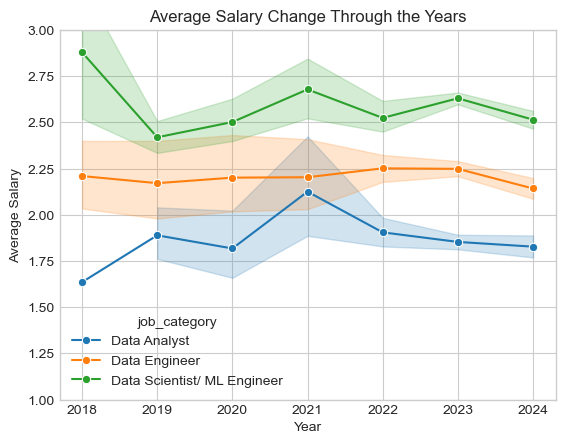

In [117]:
df_data_plot = df_data.copy()
df_data_plot = df_data_plot[df_data_plot['country'].isin(western_countries)]
#df_data_plot = df_data
df_data_plot = df_data_plot[df_data_plot['seniority_level'] == 'senior']
#df_data_plot = df_data_plot[~((df_data_plot['survey'] == 'ai') & (df_data_plot['year'] == 2020))]

sns.lineplot(data=df_data_plot, x='year', y='salary_norm_2024', hue='job_category', marker='o')

plt.title('Average Salary Change Through the Years')
plt.xlabel('Year')
plt.ylabel('Average Salary')
plt.ylim(1, 3)
plt.grid(True)

plt.show()

<div class="n">
And indeed, by normalizing all the values with inflation: So standardizing every datapoint to 2024's values, these curves flatten.<br>
</div> 

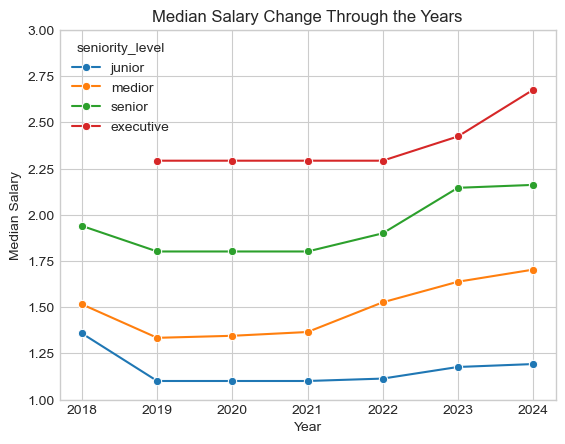

In [119]:
# Filter the data for Western countries
df_data_plot = df_data.copy()
df_data_plot = df_data_plot[df_data_plot['country'].isin(western_countries)]

# Group by 'year' and 'seniority_level' to compute the median of 'salary_norm'
df_medians = df_data_plot.groupby(['year', 'seniority_level'], as_index=False)['salary_norm'].median()

custom_palette = {
    'junior': '#1f77b4',  # Replace with desired color code
    'medior': '#ff7f0e',     # Replace with desired color code
    'senior': '#2ca02c',  # Replace with desired color code
    'executive': '#d62728'     # Replace with desired color code
}

# Plot using seaborn lineplot
sns.lineplot(data=df_medians, x='year', y='salary_norm', hue='seniority_level', marker='o', palette=custom_palette)

# Set plot titles and labels
plt.title('Median Salary Change Through the Years')
plt.xlabel('Year')
plt.ylabel('Median Salary')
plt.ylim(1, 3)
plt.grid(True)

# Show the plot
plt.show()

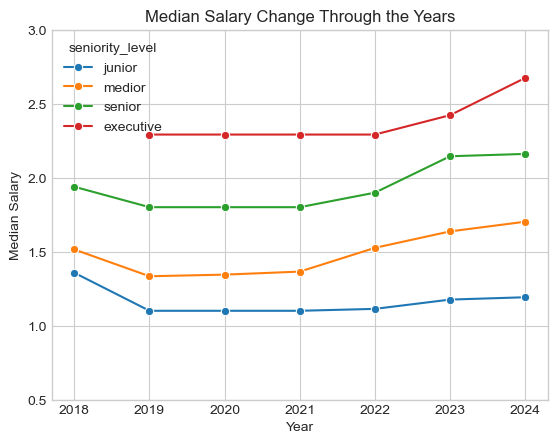

In [120]:
# Filter the data for Western countries
df_data_plot = df_data.copy()
df_data_plot = df_data_plot[df_data_plot['country'].isin(western_countries)]

# Group by 'year' and 'seniority_level' to compute the median of 'salary_norm'
df_medians = df_data_plot.groupby(['year', 'seniority_level'], as_index=False)['salary_norm'].median()

custom_palette = {
    'junior': '#1f77b4',  # Replace with desired color code
    'medior': '#ff7f0e',     # Replace with desired color code
    'senior': '#2ca02c',  # Replace with desired color code
    'executive': '#d62728'     # Replace with desired color code
}

# Plot using seaborn lineplot
sns.lineplot(data=df_medians, x='year', y='salary_norm', hue='seniority_level', marker='o', palette=custom_palette)

# Set plot titles and labels
plt.title('Median Salary Change Through the Years')
plt.xlabel('Year')
plt.ylabel('Median Salary')
plt.ylim(0.5, 3)
plt.grid(True)

# Show the plot
plt.show()

<div class="n">
Here again: without normalization, the curves are trending upwards steadily.<br>
</div> 

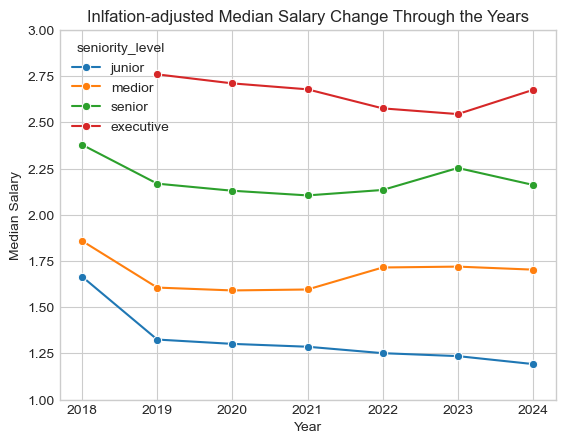

In [122]:
# Filter the data for Western countries
df_data_plot = df_data.copy()
df_data_plot = df_data_plot[df_data_plot['country'].isin(western_countries)]

# Group by 'year' and 'seniority_level' to compute the median of 'salary_norm'
df_medians = df_data_plot.groupby(['year', 'seniority_level'], as_index=False)['salary_norm_2024'].median()

custom_palette = {
    'junior': '#1f77b4',  # Replace with desired color code
    'medior': '#ff7f0e',     # Replace with desired color code
    'senior': '#2ca02c',  # Replace with desired color code
    'executive': '#d62728'     # Replace with desired color code
}

# Plot using seaborn lineplot
sns.lineplot(data=df_medians, x='year', y='salary_norm_2024', hue='seniority_level', marker='o', palette=custom_palette)

# Set plot titles and labels
plt.title('Inlfation-adjusted Median Salary Change Through the Years')
plt.xlabel('Year')
plt.ylabel('Median Salary')
plt.ylim(1, 3)
plt.grid(True)

# Show the plot
plt.show()

<div class="n">
But yet again, the trend is flattedn by inflation.
</div> 

<div class="c">
Conclusion: <br>
It's fascinating how deceptive yearly salary increases get, if one forgots to normalize salary data by inflation.<br>
And the crushing cumulative effect of inflation is also something...<br>
<br>
We can conclude that using inflation-normalized salary values could potentially eliminate year as a factor.
</div> 

## Map

<div class="c">
Let's see the effect of countries<br>
</div> 

In [127]:
import geopandas as gpd
from shapely.geometry import box

# Load the shapefile or GeoDataFrame (use appropriate path)
shapefile_path = '../data/world_shapefile/ne_110m_admin_0_countries.shp'
world = gpd.read_file(shapefile_path)

### World

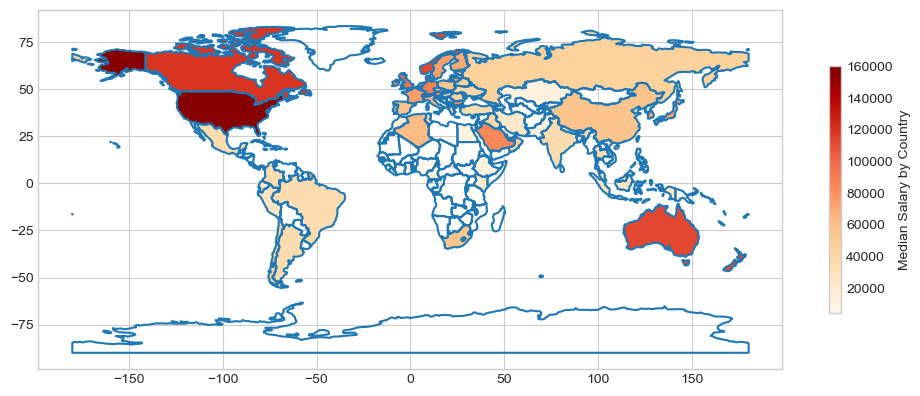

In [129]:
df_data_seniors = df_combined_0.copy()
df_data_seniors = df_data_seniors[df_data_seniors['seniority_level'] == 'senior']
df_data_seniors['country'] = df_data_seniors['country'].str.upper()

# Calculate average salary
median_salary = df_data_seniors.groupby('country')['salary'].median().reset_index()

# Merge DataFrame with GeoDataFrame
world = gpd.read_file(shapefile_path)
world = world.merge(median_salary, left_on='ISO_A2_EH', right_on='country', how='left')

# Plot the heatmap
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
world.boundary.plot(ax=ax)
world.plot(column='salary', ax=ax, legend=True,
           legend_kwds={'label': "Median Salary by Country",
                        'orientation': "vertical",
                        'shrink': 0.4},  # Adjust the size of the legend
           cmap='OrRd')  # Choose a colormap

plt.show()

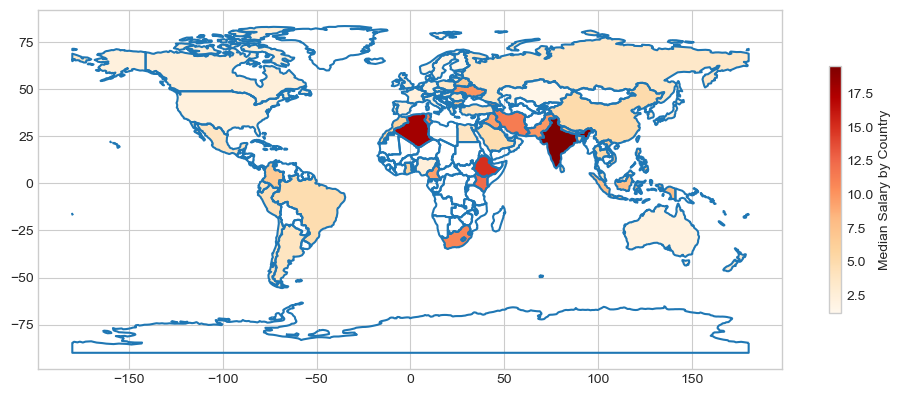

In [130]:
df_data_seniors = df_combined_0.copy()
df_data_seniors = df_data_seniors[df_data_seniors['seniority_level'] == 'senior']
df_data_seniors['country'] = df_data_seniors['country'].str.upper()

# Calculate average salary
median_salary = df_data_seniors.groupby('country')['salary_norm_2024'].median().reset_index()

# Merge DataFrame with GeoDataFrame
world = gpd.read_file(shapefile_path)
world = world.merge(median_salary, left_on='ISO_A2_EH', right_on='country', how='left')

# Plot the heatmap
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
world.boundary.plot(ax=ax)
world.plot(column='salary_norm_2024', ax=ax, legend=True,
           legend_kwds={'label': "Median Salary by Country",
                        'orientation': "vertical",
                        'shrink': 0.4},  # Adjust the size of the legend
           cmap='OrRd')  # Choose a colormap

plt.show()

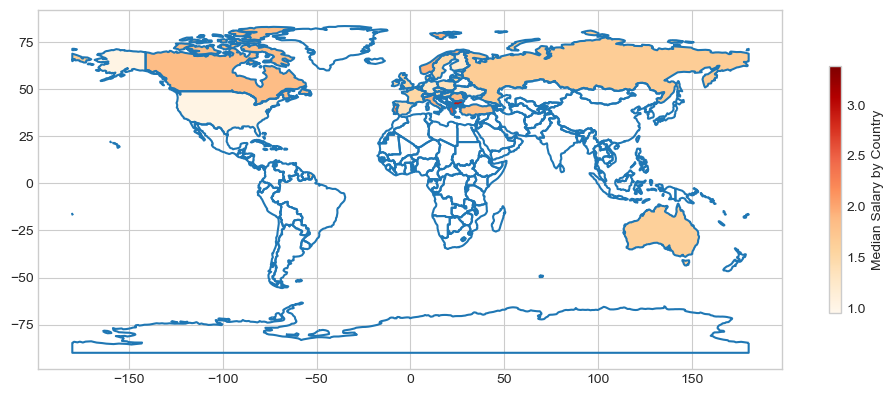

In [131]:
df_data_seniors = df_combined_0.copy()
df_data_seniors = df_data_seniors[df_data_seniors['seniority_level'] == 'senior']
df_data_seniors['country'] = df_data_seniors['country'].str.upper()

# Calculate average salary
median_salary = df_data_seniors.groupby('country')['salary_normse_2024'].median().reset_index()

# Merge DataFrame with GeoDataFrame
world = gpd.read_file(shapefile_path)
world = world.merge(median_salary, left_on='ISO_A2_EH', right_on='country', how='left')

# Plot the heatmap
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
world.boundary.plot(ax=ax)
world.plot(column='salary_normse_2024', ax=ax, legend=True,
           legend_kwds={'label': "Median Salary by Country",
                        'orientation': "vertical",
                        'shrink': 0.4},  # Adjust the size of the legend
           cmap='OrRd')  # Choose a colormap

plt.show()

### Europe

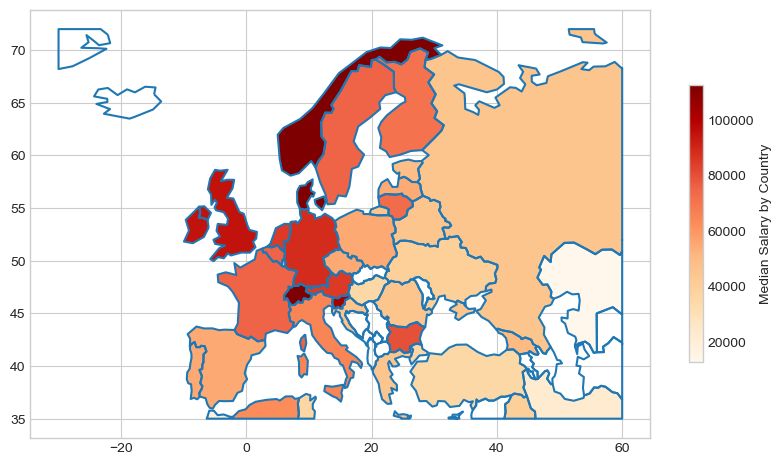

In [133]:
df_data_seniors = df_combined_0.copy()
df_data_seniors = df_data_seniors[df_data_seniors['seniority_level'] == 'senior']
df_data_seniors['country'] = df_data_seniors['country'].str.upper()

# Calculate median salary instead of mean
median_salary = df_data_seniors.groupby('country')['salary'].median().reset_index()

# Merge DataFrame with GeoDataFrame
world = gpd.read_file(shapefile_path)
world = world.merge(median_salary, left_on='ISO_A2_EH', right_on='country', how='left')

# Define the bounding box for Europe (minx, miny, maxx, maxy)
bbox = (-30, 35, 60, 72)

# Create a polygon for the bounding box
bbox_polygon = box(*bbox)

# Clip the GeoDataFrame to the bounding box polygon
world = world.clip(bbox_polygon)

# Plot the heatmap
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
world.boundary.plot(ax=ax)
world.plot(column='salary', ax=ax, legend=True,
           legend_kwds={'label': "Median Salary by Country",
                        'orientation': "vertical",
                        'shrink': 0.6},
           cmap='OrRd')  # Choose a colormap

plt.show()

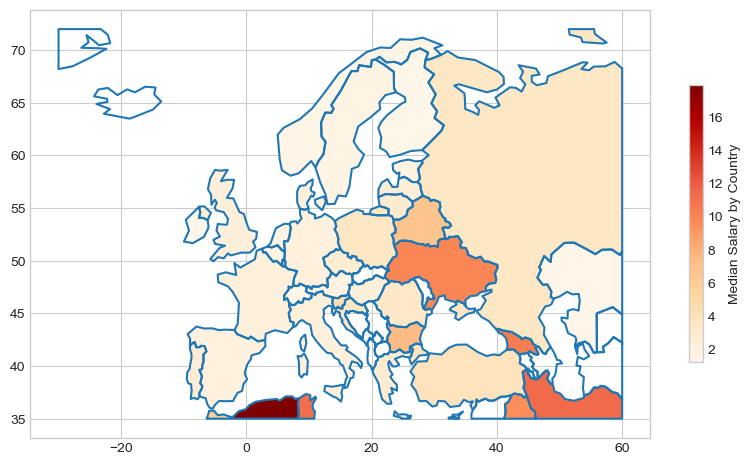

In [134]:
df_data_seniors = df_combined_0.copy()
df_data_seniors = df_data_seniors[df_data_seniors['seniority_level'] == 'senior']
df_data_seniors['country'] = df_data_seniors['country'].str.upper()

#firstworld_countries

# Calculate median salary instead of mean
median_salary = df_data_seniors.groupby('country')['salary_norm_2024'].median().reset_index()

# Merge DataFrame with GeoDataFrame
world = gpd.read_file(shapefile_path)
world = world.merge(median_salary, left_on='ISO_A2_EH', right_on='country', how='left')

# Define the bounding box for Europe (minx, miny, maxx, maxy)
bbox = (-30, 35, 60, 72)

# Create a polygon for the bounding box
bbox_polygon = box(*bbox)

# Clip the GeoDataFrame to the bounding box polygon
world = world.clip(bbox_polygon)

# Plot the heatmap
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
world.boundary.plot(ax=ax)
world.plot(column='salary_norm_2024', ax=ax, legend=True,
           legend_kwds={'label': "Median Salary by Country",
                        'orientation': "vertical",
                        'shrink': 0.6},
           cmap='OrRd')  # Choose a colormap

plt.show()

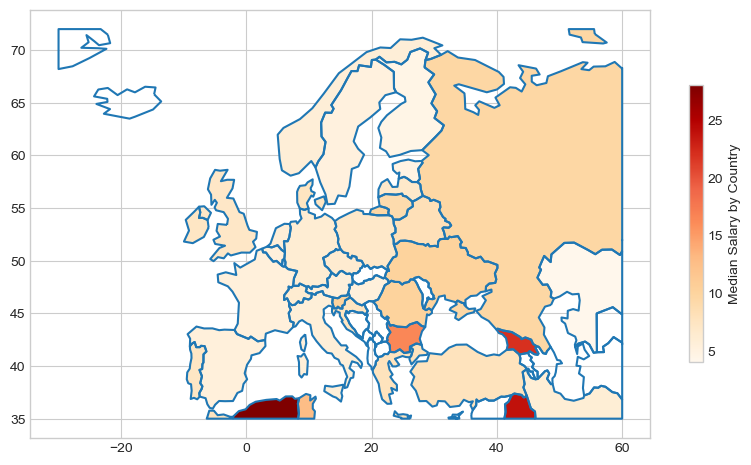

In [135]:
df_data_seniors = df_combined_0.copy()
df_data_seniors = df_data_seniors[df_data_seniors['seniority_level'] == 'senior']
df_data_seniors['country'] = df_data_seniors['country'].str.upper()

#firstworld_countries

# Calculate median salary instead of mean
median_salary = df_data_seniors.groupby('country')['salary_normmed_2024'].median().reset_index()

# Merge DataFrame with GeoDataFrame
world = gpd.read_file(shapefile_path)
world = world.merge(median_salary, left_on='ISO_A2_EH', right_on='country', how='left')

# Define the bounding box for Europe (minx, miny, maxx, maxy)
bbox = (-30, 35, 60, 72)

# Create a polygon for the bounding box
bbox_polygon = box(*bbox)

# Clip the GeoDataFrame to the bounding box polygon
world = world.clip(bbox_polygon)

# Plot the heatmap
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
world.boundary.plot(ax=ax)
world.plot(column='salary_normmed_2024', ax=ax, legend=True,
           legend_kwds={'label': "Median Salary by Country",
                        'orientation': "vertical",
                        'shrink': 0.6},
           cmap='OrRd')  # Choose a colormap

plt.show()

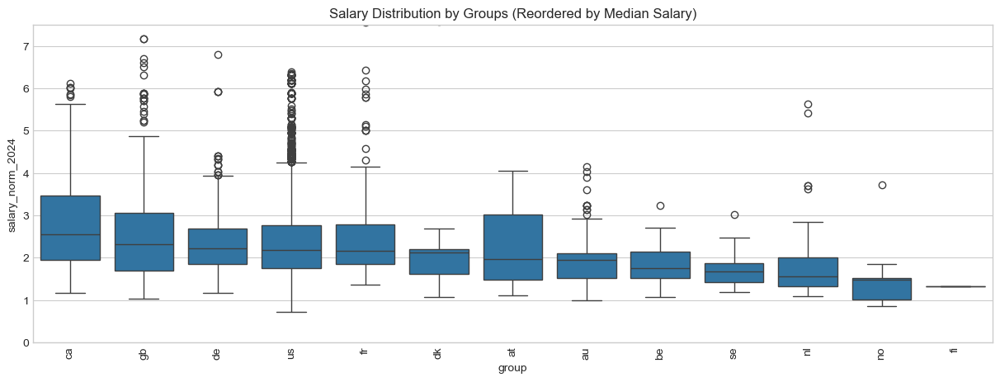

In [136]:
# Filter data for seniors and the specified countries
df_data_seniors = df_data[df_data['seniority_level'] == 'senior'].copy()
#df_data_seniors = df_data_seniors[df_data_seniors['survey'] != 'k']
df_data_seniors = df_data_seniors[df_data_seniors['country'].isin(western_countries)]

# Calculate the median salary for each country and sort by this value
median_salary = df_data_seniors.groupby('country')['salary_norm_2024'].median().sort_values(ascending=False).index

# Reorder the 'country' column based on the sorted median salary
df_data_seniors['group'] = pd.Categorical(df_data_seniors['country'], categories=median_salary, ordered=True)

# Plot the boxplot with reordered groups
plt.figure(figsize=(15, 5))
sns.boxplot(x='group', y='salary_norm_2024', data=df_data_seniors)
plt.xticks(rotation=90)
plt.ylim(0, 7.5)
plt.title('Salary Distribution by Groups (Reordered by Median Salary)')
plt.show()


<div class="c">
Conclusion:<br>
- Country seems to be an enormous factor.<br>
- In the western world, normalizing salary by GDP-Per-Capita seems to be a good step (considering that one of the Surveys was exclusively been made from Germany.)<br>
- Furthermire, by normalizing, we can avoid grouping everything by by country.<br>
- Ukraine seems to be an outlier, but that can be caused by dislocated citizens by the Ukranian war, across Europe.<br>
<br>
Therefore, I'll focus on the Western World, and will experiment further with country-normalized salaries.
</div> 

## Barplot

### Preparation for barplots

In [140]:
# # Filters for: western countries, and specific categories
# df_ai_w= df_ai.copy()
# df_it_w= df_it.copy()
# df_k_w = df_k.copy()
# 
# # Western countries
# df_ai_w = df_ai_w[df_ai_w['country'].isin(western_countries)].copy()
# df_it_w = df_it_w[df_it_w['country'].isin(western_countries)].copy()
# df_k_w = df_k_w[df_k_w['country'].isin(western_countries)].copy()
# 
# # Calculate the count of data points for each job category
# group_counts1 = df_ai_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
# group_counts2 = df_it_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
# group_counts3 = df_k_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
# 
# # Rename the count column for clarity
# group_counts1.rename(columns={'salary_norm': 'count'}, inplace=True)
# group_counts2.rename(columns={'salary_norm': 'count'}, inplace=True)
# group_counts3.rename(columns={'salary_norm': 'count'}, inplace=True)
# 
# # Specify the minimum number of counts required to keep the group
# min_count = 20
# 
# # Filter groups that meet the criteria
# valid_groups1 = group_counts1[group_counts1['count'] >= min_count]
# valid_groups2 = group_counts2[group_counts2['count'] >= min_count]
# valid_groups3 = group_counts3[group_counts3['count'] >= min_count]
# 
# # Merge the valid groups back with the original dataframe to keep only the desired rows
# df_ai_w_c = pd.merge(df_ai_w, valid_groups1[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')
# 
# df_it_w_c = pd.merge(df_it_w, valid_groups2[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')
# 
# df_k_w_c = pd.merge(df_k_w, valid_groups3[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')
# 
# # List of job categories to exclude
# exclude_categories = ['Architects', 'Leaders', 'Consultant', '"Other"', 'Uncategorized', 'Advocacy', 'Team leaders', 
#                       'Out of scope', 'Too vague answers', 'Project managers', 'Other managers']
# 
# # Filter out rows where 'job_category' is in the exclude list
# df_ai_w_c = df_ai_w_c[~df_ai_w_c['job_category'].isin(exclude_categories)]
# df_it_w_c = df_it_w_c[~df_it_w_c['job_category'].isin(exclude_categories)]
# df_k_w_c = df_k_w_c[~df_k_w_c['job_category'].isin(exclude_categories)]

## Try: 2024-10-13

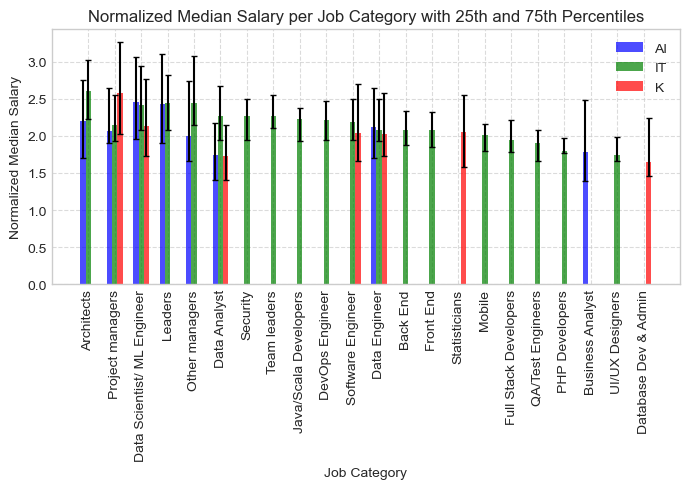

In [142]:
# Filter for senior level
df_ai_w_l_s = df_ai_w_l[df_ai_w_l['seniority_level'] == 'senior'].copy()
df_it_w_l_s = df_it_w_l[df_it_w_l['seniority_level'] == 'senior'].copy()
df_k_w_l_s = df_k_w_l[df_k_w_l['seniority_level'] == 'senior'].copy()

# Function to calculate statistics
def calculate_stats(df, survey_name):
    stats = df.groupby('job_category').agg(
        median=('salary_norm_2024', 'median'),
        p25=('salary_norm_2024', lambda x: x.quantile(0.25)),
        p75=('salary_norm_2024', lambda x: x.quantile(0.75))
    ).reset_index()
    stats['survey'] = survey_name
    return stats

# Calculate stats for each dataset
stats_ai = calculate_stats(df_ai_w_l_s, 'AI')
stats_it = calculate_stats(df_it_w_l_s, 'IT')
stats_k = calculate_stats(df_k_w_l_s, 'K')

# Concatenate all stats
all_stats = pd.concat([stats_ai, stats_it, stats_k], ignore_index=True)

# Compute the maximum median per job_category for ordering
median_max = all_stats.groupby('job_category')['median'].max().reset_index().rename(columns={'median':'median_max'})

# Merge median_max back into all_stats
all_stats = pd.merge(all_stats, median_max, on='job_category', how='left')

# Sort all_stats by median_max descending
all_stats.sort_values(by='median_max', ascending=False, inplace=True)

# Get the ordered list of job categories
job_categories_ordered = all_stats['job_category'].drop_duplicates().tolist()

# Create a mapping from job_category to position
job_category_positions = {job_category: i for i, job_category in enumerate(job_categories_ordered)}

# Bar width and survey offsets
bar_width = 0.2
surveys = ['AI', 'IT', 'K']
offsets = {'AI': -bar_width, 'IT': 0, 'K': bar_width}

# Initialize plot
plt.figure(figsize=(7, 5))

colors = {'AI': 'blue', 'IT': 'green', 'K': 'red'}

for survey in surveys:
    df = all_stats[all_stats['survey'] == survey]
    # Set index to 'job_category' for easy lookup
    df = df.set_index('job_category')
    medians = []
    lower_errors = []
    upper_errors = []
    x_positions = []
    for job_category in job_categories_ordered:
        if job_category in df.index:
            median = df.loc[job_category, 'median']
            p25 = df.loc[job_category, 'p25']
            p75 = df.loc[job_category, 'p75']
            lower_error = median - p25
            upper_error = p75 - median
            position = job_category_positions[job_category] + offsets[survey]
            medians.append(median)
            lower_errors.append(lower_error)
            upper_errors.append(upper_error)
            x_positions.append(position)
        else:
            # No data for this job_category in this survey
            pass
    if medians:
        plt.bar(
            x_positions,
            medians,
            width=bar_width,
            yerr=[lower_errors, upper_errors],
            align='center',
            alpha=0.7,
            ecolor='black',
            capsize=2,
            color=colors[survey],
            label=survey
        )

# Set x-axis labels
x_pos = np.arange(len(job_categories_ordered))
plt.xticks(x_pos, job_categories_ordered, rotation=90)

# Add labels and title
plt.xlabel('Job Category')
plt.ylabel('Normalized Median Salary')
plt.title('Normalized Median Salary per Job Category with 25th and 75th Percentiles')

# Add grid lines
plt.grid(True, linestyle='--', alpha=0.7)

# Add legend
plt.legend()

# Adjust layout to prevent clipping
plt.tight_layout()

# Show plot
plt.show()

## Managers vs. Developers

In [144]:
# # Filters for: western countries, and specific categories
# df_ai_w= df_ai.copy()
# df_it_w= df_it.copy()
# df_k_w = df_k.copy()
# 
# # Western countries
# df_ai_w = df_ai_w[df_ai_w['country'].isin(western_countries)].copy()
# df_it_w = df_it_w[df_it_w['country'].isin(western_countries)].copy()
# df_k_w = df_k_w[df_k_w['country'].isin(western_countries)].copy()
# 
# # Calculate the count of data points for each job category
# group_counts1 = df_ai_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm_2024'].count().reset_index()
# group_counts2 = df_it_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm_2024'].count().reset_index()
# group_counts3 = df_k_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm_2024'].count().reset_index()
# 
# # Rename the count column for clarity
# group_counts1.rename(columns={'salary_norm_2024': 'count'}, inplace=True)
# group_counts2.rename(columns={'salary_norm_2024': 'count'}, inplace=True)
# group_counts3.rename(columns={'salary_norm_2024': 'count'}, inplace=True)
# 
# # Specify the minimum number of counts required to keep the group
# min_count = 5
# 
# # Filter groups that meet the criteria
# valid_groups1 = group_counts1[group_counts1['count'] >= min_count]
# valid_groups2 = group_counts2[group_counts2['count'] >= min_count]
# valid_groups3 = group_counts3[group_counts3['count'] >= min_count]
# 
# # Merge the valid groups back with the original dataframe to keep only the desired rows
# df_ai_w_c = pd.merge(df_ai_w, valid_groups1[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')
# 
# df_it_w_c = pd.merge(df_it_w, valid_groups2[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')
# 
# df_k_w_c = pd.merge(df_k_w, valid_groups3[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')
# 
# # List of job categories to exclude
# exclude_categories = ['Consultant', '"Other"', 'Uncategorized', 'Advocacy', 'Out of scope', 'Too vague answers']
# 
# # Filter out rows where 'job_category' is in the exclude list
# df_ai_w_c = df_ai_w_c[~df_ai_w_c['job_category'].isin(exclude_categories)]
# df_it_w_c = df_it_w_c[~df_it_w_c['job_category'].isin(exclude_categories)]
# df_k_w_c = df_k_w_c[~df_k_w_c['job_category'].isin(exclude_categories)]

In [145]:
# List of managerial categories
managerial_categories = ['Leaders', 'Team leaders', 'Project managers', 'Other managers']

# Create the new column 'developer_job_category'
df_ai_w_l['developer_job_category'] = df_ai_w_l['job_category'].apply(lambda x: 'managerial' if x in managerial_categories else x)
df_it_w_l['developer_job_category'] = df_it_w_l['job_category'].apply(lambda x: 'managerial' if x in managerial_categories else x)
df_k_w_l['developer_job_category'] = df_k_w_l['job_category'].apply(lambda x: 'managerial' if x in managerial_categories else x)

# Create the new column 'managerial_job_category'
df_ai_w_l['managerial_job_category'] = df_ai_w_l['job_category'].apply(lambda x: x if x in managerial_categories else 'developer')
df_it_w_l['managerial_job_category'] = df_it_w_l['job_category'].apply(lambda x: x if x in managerial_categories else 'developer')
df_k_w_l['managerial_job_category'] = df_k_w_l['job_category'].apply(lambda x: x if x in managerial_categories else 'developer')

## Try: 2024-10-13

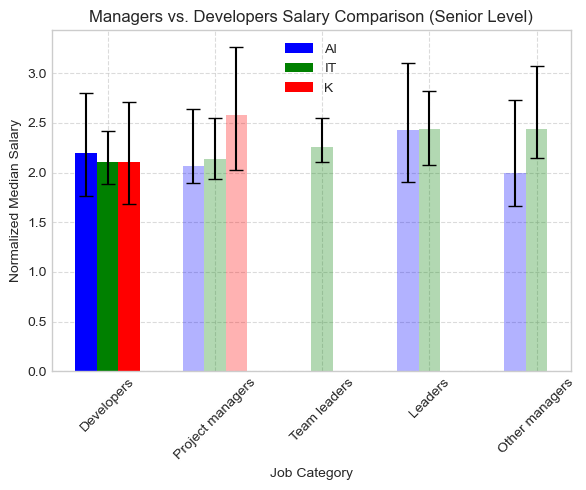

In [147]:
# Apply the managerial categories as per your code
managerial_categories = ['Leaders', 'Team leaders', 'Project managers', 'Other managers']

# Create 'managerial_job_category' in each DataFrame
for df in [df_ai_w_l, df_it_w_l, df_k_w_l]:
    df['managerial_job_category'] = df['job_category'].apply(
        lambda x: x if x in managerial_categories else 'Developers'
    )

# Filter for 'senior' level
df_ai_w_l_s = df_ai_w_l[df_ai_w_l['seniority_level'] == 'senior'].copy()
df_it_w_l_s = df_it_w_l[df_it_w_l['seniority_level'] == 'senior'].copy()
df_k_w_l_s = df_k_w_l[df_k_w_l['seniority_level'] == 'senior'].copy()

# Function to calculate statistics
def calculate_stats(df, survey_name):
    stats = df.groupby('managerial_job_category').agg(
        median=('salary_norm_2024', 'median'),
        p25=('salary_norm_2024', lambda x: x.quantile(0.25)),
        p75=('salary_norm_2024', lambda x: x.quantile(0.75))
    ).reset_index()
    stats['survey'] = survey_name
    return stats

# Calculate stats for each dataset
stats_ai = calculate_stats(df_ai_w_l_s, 'AI')
stats_it = calculate_stats(df_it_w_l_s, 'IT')
stats_k = calculate_stats(df_k_w_l_s, 'K')

# Concatenate all stats
all_stats = pd.concat([stats_ai, stats_it, stats_k], ignore_index=True)

# Define categories in a specific order
categories = ['Developers', 'Project managers', 'Team leaders', 'Leaders', 'Other managers']

# Create a mapping from category to position
category_positions = {category: idx for idx, category in enumerate(categories)}

# Set up the bar plot
bar_width = 0.2
surveys = ['AI', 'IT', 'K']
colors = {'AI': 'blue', 'IT': 'green', 'K': 'red'}
offsets = {'AI': -bar_width, 'IT': 0, 'K': bar_width}

plt.figure(figsize=(6, 5))

# Initialize a dictionary to keep track of labels added for the legend
label_added = {'AI': False, 'IT': False, 'K': False}

for survey in surveys:
    survey_stats = all_stats[all_stats['survey'] == survey]
    for category in categories:
        cat_stats = survey_stats[survey_stats['managerial_job_category'] == category]
        if not cat_stats.empty:
            median = cat_stats['median'].values[0]
            p25 = cat_stats['p25'].values[0]
            p75 = cat_stats['p75'].values[0]
            lower_error = median - p25
            upper_error = p75 - median
            idx = category_positions[category]
            position = idx + offsets[survey]
            # Determine alpha
            alpha = 0.3 if category != 'Developers' else 1.0
            # Determine label for the legend
            if not label_added[survey]:
                label = survey
                label_added[survey] = True
            else:
                label = ""
            # Plot the bar
            plt.bar(
                position,
                median,
                width=bar_width,
                yerr=[[lower_error], [upper_error]],
                align='center',
                alpha=alpha,
                ecolor='black',
                capsize=5,
                color=colors[survey],
                label=label
            )
        else:
            # No data for this category in this survey
            pass

# Adjust x-axis labels
x_positions = np.arange(len(categories))
plt.xticks(x_positions, categories, rotation=45)
plt.xlabel('Job Category')
plt.ylabel('Normalized Median Salary')
plt.title('Managers vs. Developers Salary Comparison (Senior Level)')

# Add legend
plt.legend()

# Add grid lines
plt.grid(True, linestyle='--', alpha=0.7)
# Adjust layout to prevent clipping
plt.tight_layout()

# Show the plot
plt.show()

## Germany-IT specific

### Experience

In [150]:
from scipy.stats import pearsonr
from scipy.stats import linregress

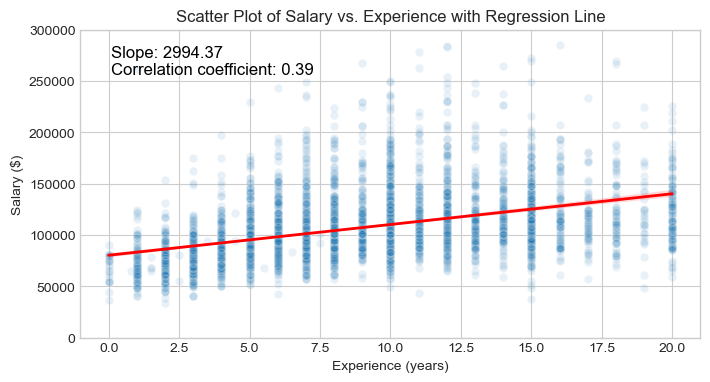

In [151]:
# Prepare the data
df_it_xp = df_it.copy()
df_it_xp = df_it_xp.dropna(subset=['experience', 'salary_2024'])  # Drop rows where either 'experience' or 'salary' is NaN

# Convert experience to numeric and filter values less than 21
df_it_xp['experience'] = df_it_xp['experience'].apply(pd.to_numeric, errors='coerce')
df_it_xp = df_it_xp[df_it_xp['experience'] < 21]

# Drop rows with NaN or Inf values in 'experience' or 'salary'
df_it_xp = df_it_xp[np.isfinite(df_it_xp['experience']) & np.isfinite(df_it_xp['salary_2024'])]

# Perform linear regression to find the slope and intercept
slope, intercept, r_value, p_value, std_err = linregress(df_it_xp['experience'], df_it_xp['salary_2024'])

# Create the scatter plot with a regression line
plt.figure(figsize=(8, 4))
sns.regplot(data=df_it_xp, x='experience', y='salary_2024', 
            scatter_kws={'alpha':0.1, 'edgecolor':'w'}, 
            line_kws={'color':'red', 'lw':2})

# Customize the plot
plt.title('Scatter Plot of Salary vs. Experience with Regression Line')
plt.xlabel('Experience (years)')
plt.ylabel('Salary ($)')
plt.grid(True)
plt.ylim(0, 300000)

# Annotate the plot with the slope and correlation coefficient
plt.text(0.05, 0.95, f'Slope: {slope:.2f}\nCorrelation coefficient: {r_value:.2f}', 
         ha='left', va='top', transform=plt.gca().transAxes, fontsize=12, color='black')

# Show the plot
plt.show()

### Years in Germany

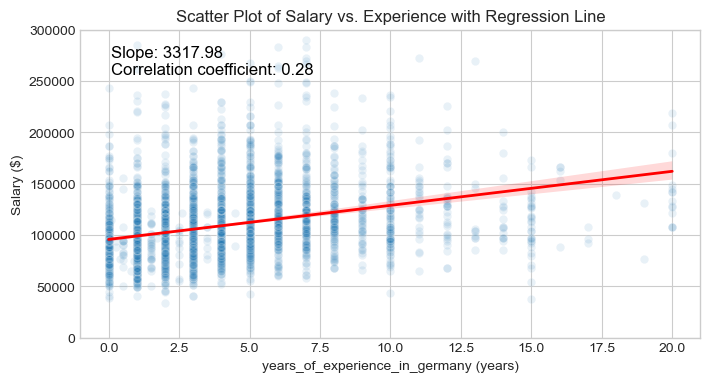

In [153]:
# Prepare the data
df_it_xp = df_it.copy()
df_it_xp = df_it_xp.dropna(subset=['years_of_experience_in_germany', 'salary_2024'])  # Drop rows where either 'experience' or 'salary' is NaN

# Convert experience to numeric and filter values less than 21
df_it_xp['years_of_experience_in_germany'] = df_it_xp['years_of_experience_in_germany'].apply(pd.to_numeric, errors='coerce')
df_it_xp = df_it_xp[df_it_xp['years_of_experience_in_germany'] < 21]

# Drop rows with NaN or Inf values in 'experience' or 'salary'
df_it_xp = df_it_xp[np.isfinite(df_it_xp['years_of_experience_in_germany']) & np.isfinite(df_it_xp['salary_2024'])]

# Perform linear regression to find the slope and intercept
slope, intercept, r_value, p_value, std_err = linregress(df_it_xp['years_of_experience_in_germany'], df_it_xp['salary_2024'])

# Create the scatter plot with a regression line
plt.figure(figsize=(8, 4))
sns.regplot(data=df_it_xp, x='years_of_experience_in_germany', y='salary_2024', 
            scatter_kws={'alpha':0.1, 'edgecolor':'w'}, 
            line_kws={'color':'red', 'lw':2})

# Customize the plot
plt.title('Scatter Plot of Salary vs. Experience with Regression Line')
plt.xlabel('years_of_experience_in_germany (years)')
plt.ylabel('Salary ($)')
plt.grid(True)
plt.ylim(0, 300000)

# Annotate the plot with the slope and correlation coefficient
plt.text(0.05, 0.95, f'Slope: {slope:.2f}\nCorrelation coefficient: {r_value:.2f}', 
         ha='left', va='top', transform=plt.gca().transAxes, fontsize=12, color='black')

# Show the plot
plt.show()

### City

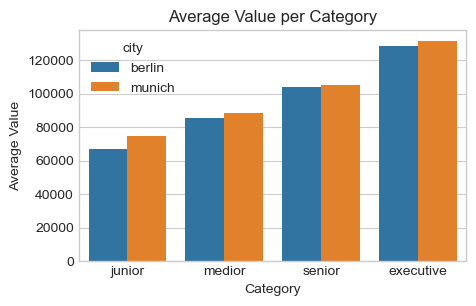

In [155]:
df_it_city = df_it.copy()
df_it_city = df_it_city[(df_it_city['city'] == 'berlin') | (df_it_city['city'] == 'munich')]
avg_values = df_it_city.groupby(['city', 'seniority_level'], observed=True)['salary_2024'].median().reset_index()

plt.figure(figsize=(5, 3))

# Define the order of the seniority levels
seniority_order = ['junior', 'medior', 'senior', 'executive']

# Creating the bar plot
sns.barplot(x='seniority_level', y='salary_2024', hue='city', data=avg_values, order=seniority_order)

# Adding title and labels
plt.title('Average Value per Category')
plt.xlabel('Category')
plt.ylabel('Average Value')

# Display the plot
plt.show()

### Language at work

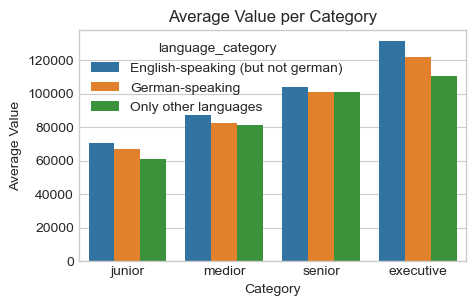

In [157]:
df_it_l = df_it.copy()
avg_values = df_it_l.groupby(['language_category', 'seniority_level'], observed=True)['salary_2024'].median().reset_index()

plt.figure(figsize=(5, 3))

# Define the order of the seniority levels
seniority_order = ['junior', 'medior', 'senior', 'executive']

# Creating the bar plot
sns.barplot(x='seniority_level', y='salary_2024', hue='language_category', data=avg_values, order=seniority_order)

# Adding title and labels
plt.title('Average Value per Category')
plt.xlabel('Category')
plt.ylabel('Average Value')

# Display the plot
plt.show()

## Kaggle-Specific

### BSc/MSc/PhD

In [160]:
df_k.education_level.unique()

array(['master’s degree', 'bachelor’s degree', 'doctoral degree',
       'no degree'], dtype=object)

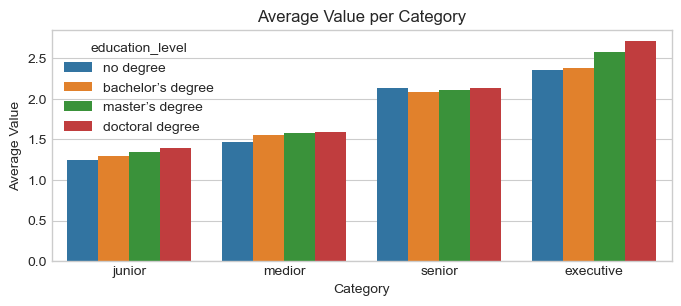

In [161]:
df_k_e = df_k_w.copy()
# df_k_e = df_k_e[(df_k_e['country'] == 'us')]
# df_k_e['education_level'] = df_k_e['education_level'].astype('string')
# df_k_e['education_level'] = df_k_e['education_level'].str.replace('no formal education past high school','no degree')
df_k_e = df_k_e[(df_k_e['education_level'] == 'bachelor’s degree') | (df_k_e['education_level'] == 'master’s degree') | (df_k_e['education_level'] == 'doctoral degree') | (df_k_e['education_level'] == 'no degree')]
median_values = df_k_e.groupby(['education_level', 'seniority_level'], observed=True)['salary_norm_2024'].median().reset_index()

plt.figure(figsize=(8, 3))

# Define the order for plotting
seniority_order = ['junior', 'medior', 'senior', 'executive']
education_order = ['no degree', 'bachelor’s degree', 'master’s degree', 'doctoral degree']

# Creating the bar plot
sns.barplot(x='seniority_level', y='salary_norm_2024', hue='education_level', data=median_values, order=seniority_order, hue_order=education_order)

# Adding title and labels
plt.title('Average Value per Category')
plt.xlabel('Category')
plt.ylabel('Average Value')

# Display the plot
plt.show()

## Parallel coordinates plot

In [163]:
# Step 1: Convert categorical variables into numerical codes for better plotting
df_combined_encoded = df_combined.copy()

# Encode categorical variables using .cat.codes
for column in ['survey', 'job_category', 'seniority_level', 'country', 'year']:
    df_combined_encoded[column] = df_combined_encoded[column].astype('category').cat.codes

# Step 2: Create a parallel coordinates plot using Plotly
fig = px.parallel_coordinates(df_combined_encoded,
                              dimensions=['job_category', 'seniority_level', 'country', 'year', 'survey'],
                              color='survey',
                              #opcaity = 0.5,# Color by the 'survey' column
                              color_continuous_scale=px.colors.sequential.Viridis,  # Use a color scale
                              labels={"job_category": "Job Category",
                                      "seniority_level": "Seniority Level",
                                      "country": "Country",
                                      "year": "Year",
                                      "survey": "Survey"},
                              title="Parallel Coordinates Plot of Software Developer Survey Data")

# Step 3: Update layout for better visual appeal
fig.update_layout(
    title_font_size=18,
    title_x=0.5,  # Center the title
    coloraxis_colorbar=dict(
        title="Survey"
    )
)

# Show the plot
fig.show()

<div class="n">
At last, this is the least interesting plot in here.<br>
I expected some patterns in a parallel coordinates plot, but it does not give any insights.
</div> 

# Factorial cell visualization

## AI-Jobs.net

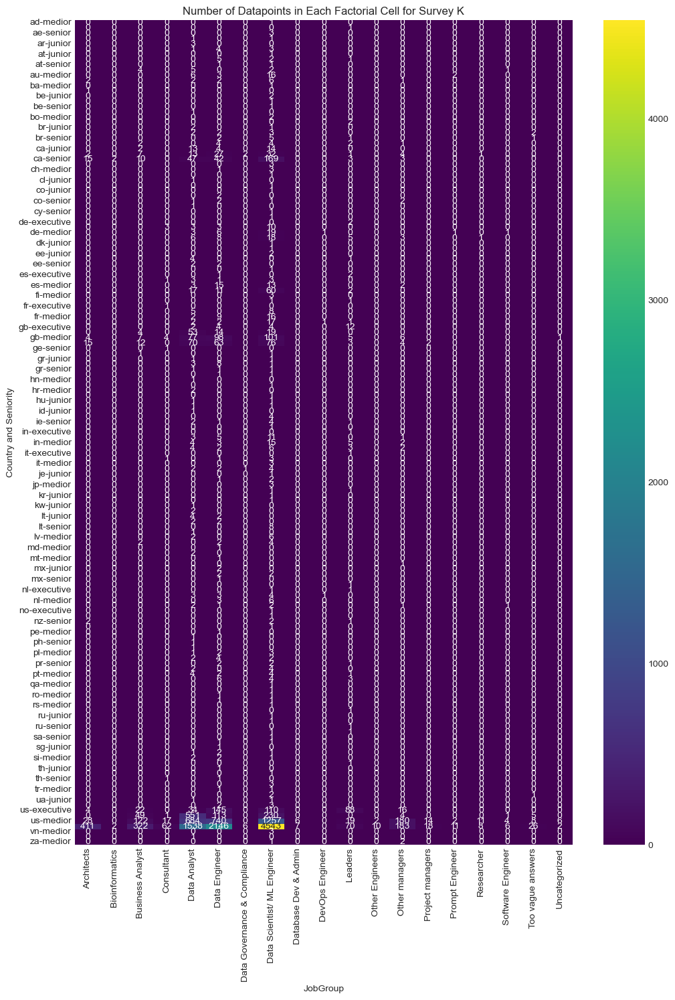

In [167]:
# Create a pivot table to count the number of observations in each factorial cell
pivot_table = df_ai.pivot_table(index=['country', 'seniority_level'], columns='job_category', aggfunc='size', fill_value=0)

# Plot the heatmap
plt.figure(figsize=(12, 16))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='viridis')
plt.title('Number of Datapoints in Each Factorial Cell for Survey K')
plt.xlabel('JobGroup')
plt.ylabel('Country and Seniority')
plt.show()

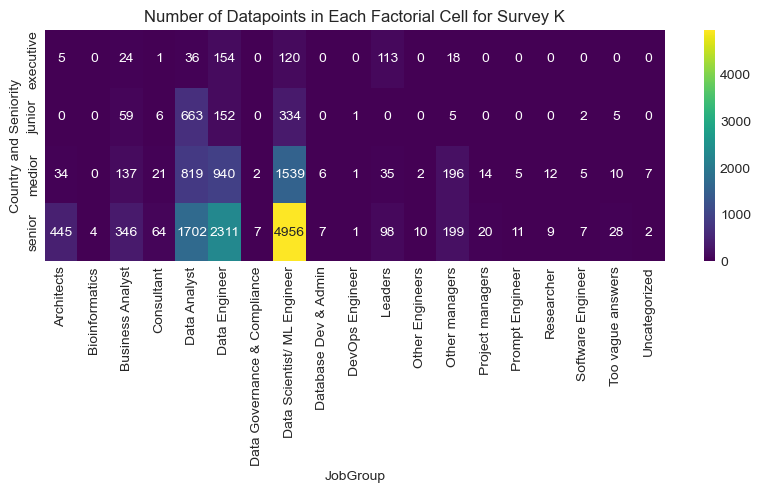

In [168]:
# Create a pivot table to count the number of observations in each factorial cell
pivot_table = df_ai.pivot_table(index='seniority_level', columns='job_category', aggfunc='size', fill_value=0)

# Plot the heatmap
plt.figure(figsize=(10, 3))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='viridis')
plt.title('Number of Datapoints in Each Factorial Cell for Survey K')
plt.xlabel('JobGroup')
plt.ylabel('Country and Seniority')
plt.show()

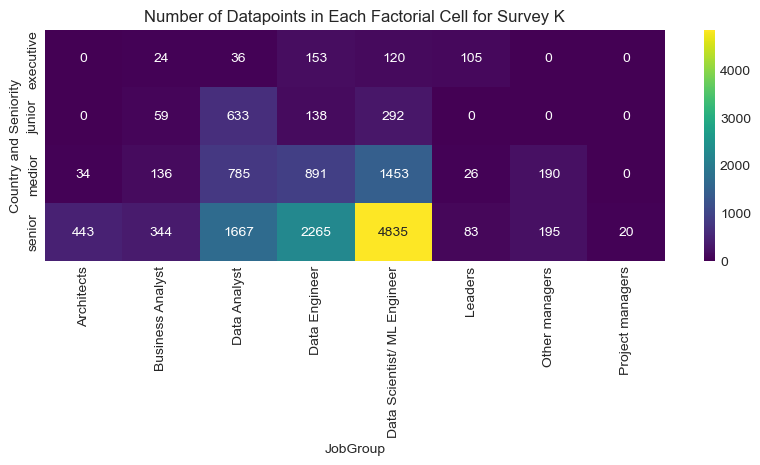

In [169]:
# Create a pivot table to count the number of observations in each factorial cell
pivot_table = df_ai_w_l.pivot_table(index='seniority_level', columns='job_category', aggfunc='size', fill_value=0, observed=True)

# Plot the heatmap
plt.figure(figsize=(10, 3))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='viridis')
plt.title('Number of Datapoints in Each Factorial Cell for Survey K')
plt.xlabel('JobGroup')
plt.ylabel('Country and Seniority')
plt.show()

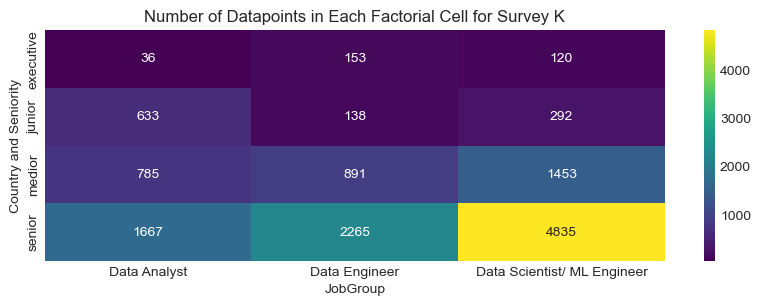

In [170]:
# Create a pivot table to count the number of observations in each factorial cell
pivot_table = df_ai_data.pivot_table(index='seniority_level', columns='job_category', aggfunc='size', fill_value=0, observed=True)

# Plot the heatmap
plt.figure(figsize=(10, 3))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='viridis')
plt.title('Number of Datapoints in Each Factorial Cell for Survey K')
plt.xlabel('JobGroup')
plt.ylabel('Country and Seniority')
plt.show()

## De-IT

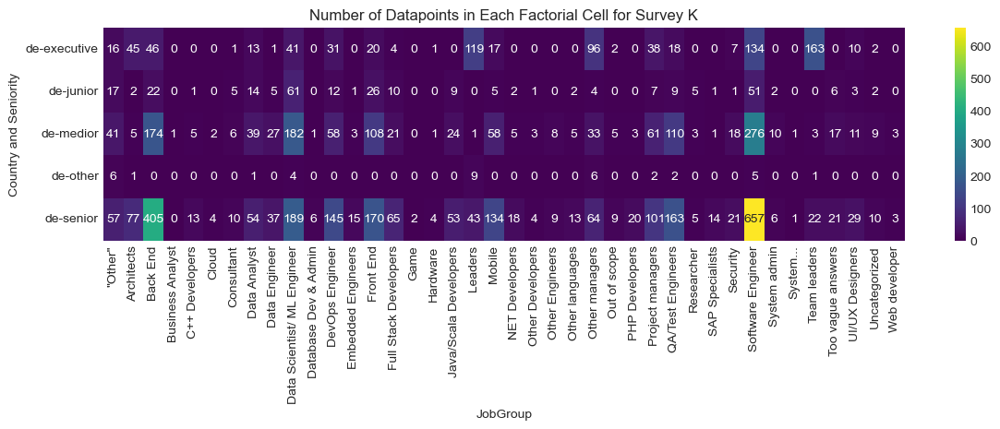

In [172]:
# Create a pivot table to count the number of observations in each factorial cell
pivot_table = df_it.pivot_table(index=['country', 'seniority_level'], columns='job_category', aggfunc='size', fill_value=0)

# Plot the heatmap
plt.figure(figsize=(14, 3))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='viridis')
plt.title('Number of Datapoints in Each Factorial Cell for Survey K')
plt.xlabel('JobGroup')
plt.ylabel('Country and Seniority')
plt.show()

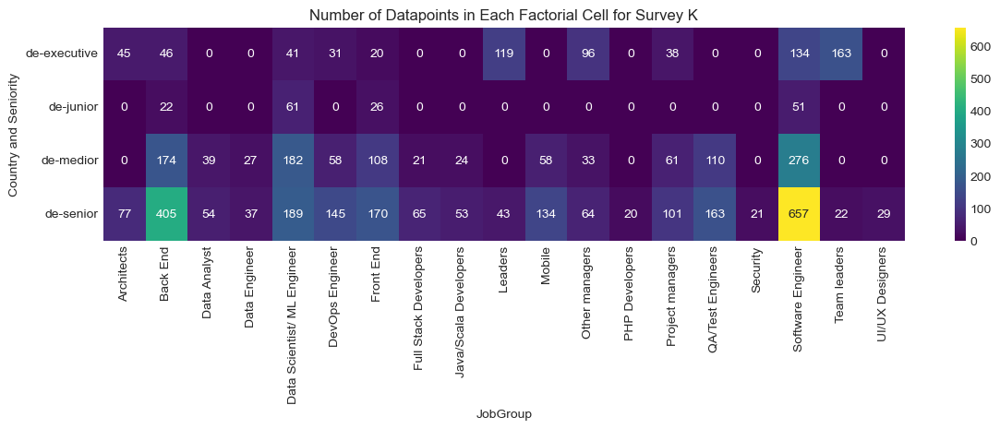

In [173]:
# Create a pivot table to count the number of observations in each factorial cell
pivot_table = df_it_w_l.pivot_table(index=['country', 'seniority_level'], columns='job_category', aggfunc='size', fill_value=0, observed=True)

# Plot the heatmap
plt.figure(figsize=(14, 3))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='viridis')
plt.title('Number of Datapoints in Each Factorial Cell for Survey K')
plt.xlabel('JobGroup')
plt.ylabel('Country and Seniority')
plt.show()

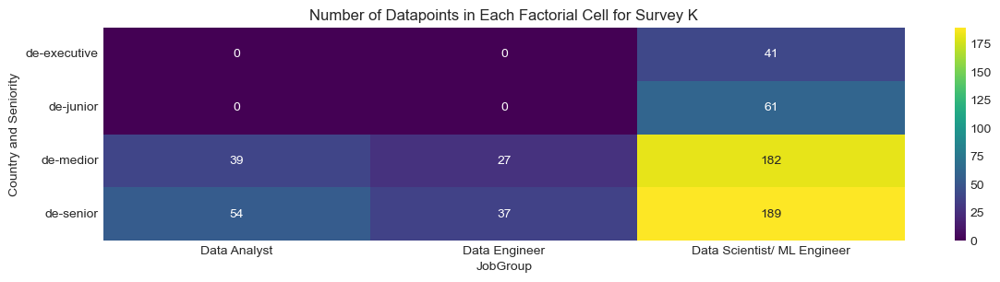

In [174]:
# Create a pivot table to count the number of observations in each factorial cell
pivot_table = df_it_data.pivot_table(index=['country', 'seniority_level'], columns='job_category', aggfunc='size', fill_value=0, observed=True)

# Plot the heatmap
plt.figure(figsize=(14, 3))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='viridis')
plt.title('Number of Datapoints in Each Factorial Cell for Survey K')
plt.xlabel('JobGroup')
plt.ylabel('Country and Seniority')
plt.show()

## Kaggle

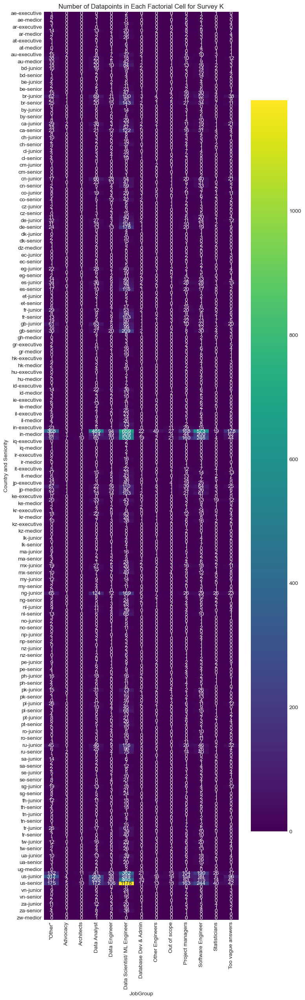

In [176]:
# Create a pivot table to count the number of observations in each factorial cell
pivot_table = df_k.pivot_table(index=['country', 'seniority_level'], columns='job_category', aggfunc='size', fill_value=0)

# Plot the heatmap
plt.figure(figsize=(8, 30))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='viridis')
plt.title('Number of Datapoints in Each Factorial Cell for Survey K')
plt.xlabel('JobGroup')
plt.ylabel('Country and Seniority')
plt.show()

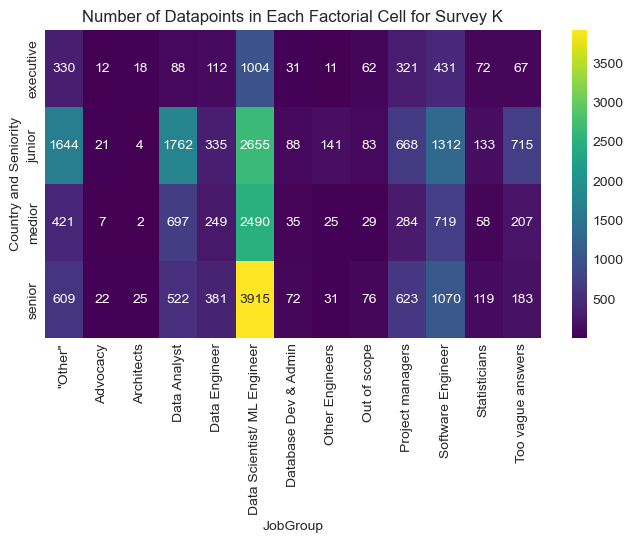

In [177]:
# Create a pivot table to count the number of observations in each factorial cell
pivot_table = df_k.pivot_table(index='seniority_level', columns='job_category', aggfunc='size', fill_value=0)

# Plot the heatmap
plt.figure(figsize=(8, 4))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='viridis')
plt.title('Number of Datapoints in Each Factorial Cell for Survey K')
plt.xlabel('JobGroup')
plt.ylabel('Country and Seniority')
plt.show()

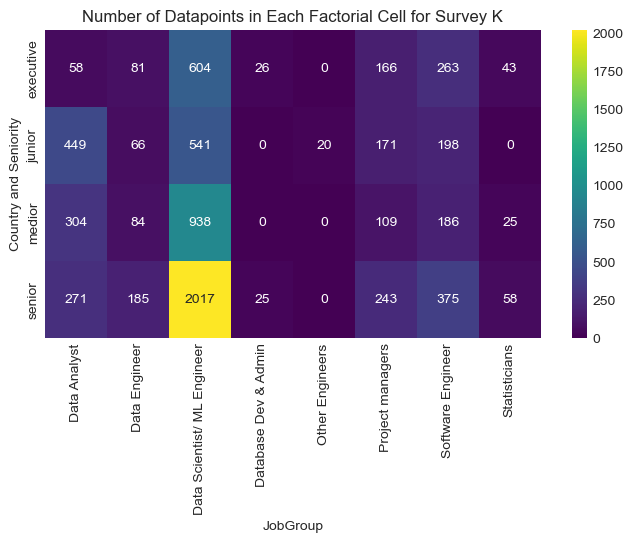

In [178]:
# Create a pivot table to count the number of observations in each factorial cell
pivot_table = df_k_w_l.pivot_table(index='seniority_level', columns='job_category', aggfunc='size', fill_value=0, observed=True)

# Plot the heatmap
plt.figure(figsize=(8, 4))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='viridis')
plt.title('Number of Datapoints in Each Factorial Cell for Survey K')
plt.xlabel('JobGroup')
plt.ylabel('Country and Seniority')
plt.show()

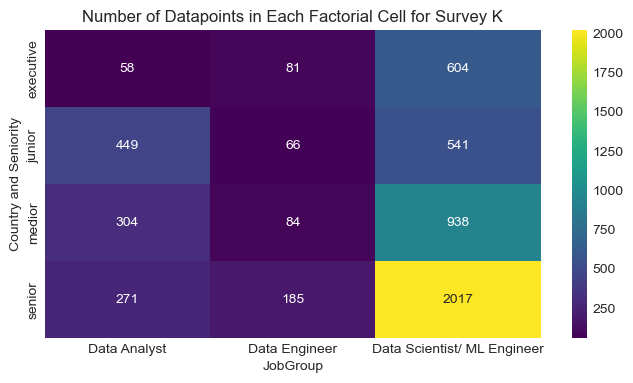

In [179]:
# Create a pivot table to count the number of observations in each factorial cell
pivot_table = df_k_data.pivot_table(index='seniority_level', columns='job_category', aggfunc='size', fill_value=0, observed=True)

# Plot the heatmap
plt.figure(figsize=(8, 4))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='viridis')
plt.title('Number of Datapoints in Each Factorial Cell for Survey K')
plt.xlabel('JobGroup')
plt.ylabel('Country and Seniority')
plt.show()

Conclusion: \
Only data-related job-titles are sufficiently represented in the factorial cells. \
And only if we eliminate the countries by normalizing with GPD-per-capita. \
Executive positions are out of scope, those are disjointed from the job-titles.

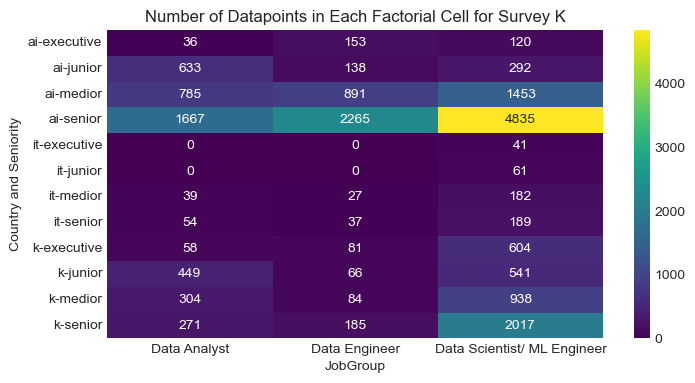

In [181]:
# Create a pivot table to count the number of observations in each factorial cell
pivot_table = df_data.pivot_table(index=['survey','seniority_level'], columns='job_category', aggfunc='size', fill_value=0)

# Plot the heatmap
plt.figure(figsize=(8, 4))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='viridis')
plt.title('Number of Datapoints in Each Factorial Cell for Survey K')
plt.xlabel('JobGroup')
plt.ylabel('Country and Seniority')
plt.show()

# Preparing dataframes

In [183]:
# # First we filter for western countries
# df_ai_w= df_ai.copy()
# df_it_w= df_it.copy()
# df_k_w = df_k.copy()
# 
# # Western countries
# df_ai_w = df_ai_w[df_ai_w['country'].isin(western_countries)].copy()
# df_it_w = df_it_w[df_it_w['country'].isin(western_countries)].copy()
# df_k_w = df_k_w[df_k_w['country'].isin(western_countries)].copy()

In [184]:
# # List of job categories to exclude
# exclude_categories = ['Consultant', '"Other"', 'Uncategorized', 'Advocacy', 'Out of scope', 'Too vague answers', 'Other managers']
# #Not excluding now: ['Architects', 'Leaders', 'Project managers', 'Team leaders']
# 
# # Filter out rows where 'job_category' is in the exclude list
# df_ai_w = df_ai_w[~df_ai_w['job_category'].isin(exclude_categories)]
# df_it_w = df_it_w[~df_it_w['job_category'].isin(exclude_categories)]
# df_k_w = df_k_w[~df_k_w['job_category'].isin(exclude_categories)]

## Filtering for Factorial Cell's length

Filtering out rows, which would result in Factorial Groups with less datapoint than the statistically required threshold

### For Kolmogorov-Smirnov

In [188]:
# # Specify the minimum number of counts required to keep the group
# min_count = 30
# 
# # Calculate the count of data points for each job category
# group_counts1 = df_ai_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
# group_counts2 = df_it_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
# group_counts3 = df_k_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
# 
# # Rename the count column for clarity
# group_counts1.rename(columns={'salary_norm': 'count'}, inplace=True)
# group_counts2.rename(columns={'salary_norm': 'count'}, inplace=True)
# group_counts3.rename(columns={'salary_norm': 'count'}, inplace=True)
# 
# # Filter groups that meet the criteria
# valid_groups1 = group_counts1[group_counts1['count'] >= min_count]
# valid_groups2 = group_counts2[group_counts2['count'] >= min_count]
# valid_groups3 = group_counts3[group_counts3['count'] >= min_count]
# 
# # Merge the valid groups back with the original dataframe to keep only the desired rows
# df_ai_w_ks = pd.merge(df_ai_w, valid_groups1[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')
# 
# df_it_w_ks = pd.merge(df_it_w, valid_groups2[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')
# 
# df_k_w_ks = pd.merge(df_k_w, valid_groups3[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')

#### Listing out the eligible factorial groups for K-S

In [190]:
# # Extract unique (job_category, seniority_level) pairs from each dataframe
# groups_ai_factorial = set(df_ai_w_l[['job_category', 'seniority_level']].drop_duplicates().itertuples(index=False, name=None))
# groups_k_factorial = set(df_k_w_l[['job_category', 'seniority_level']].drop_duplicates().itertuples(index=False, name=None))
# groups_it_factorial = set(df_it_w_l[['job_category', 'seniority_level']].drop_duplicates().itertuples(index=False, name=None))
# 
# groups_ai_factorial_list = sorted(list(groups_ai_factorial))
# groups_k_factorial_list = sorted(list(groups_k_factorial))
# groups_it_factorial_list = sorted(list(groups_it_factorial))

### For Levene (or ANOVA)

In [192]:
# # Specify the minimum number of counts required to keep the group
# min_count = 20
# 
# # Calculate the count of data points for each job category
# group_counts1 = df_ai_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
# group_counts2 = df_it_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
# group_counts3 = df_k_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
# 
# # Rename the count column for clarity
# group_counts1.rename(columns={'salary_norm': 'count'}, inplace=True)
# group_counts2.rename(columns={'salary_norm': 'count'}, inplace=True)
# group_counts3.rename(columns={'salary_norm': 'count'}, inplace=True)
# 
# # Filter groups that meet the criteria
# valid_groups1 = group_counts1[group_counts1['count'] >= min_count]
# valid_groups2 = group_counts2[group_counts2['count'] >= min_count]
# valid_groups3 = group_counts3[group_counts3['count'] >= min_count]
# 
# # Merge the valid groups back with the original dataframe to keep only the desired rows
# df_ai_w_l = pd.merge(df_ai_w, valid_groups1[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')
# 
# df_it_w_l = pd.merge(df_it_w, valid_groups2[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')
# 
# df_k_w_l = pd.merge(df_k_w, valid_groups3[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')

In [193]:
# # Specify the minimum number of counts required to keep the group
# min_count = 20
# 
# # Calculate the count of data points for each combination of seniority_level and job_category
# group_counts = df_combined.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
# 
# # Rename the count column for clarity
# group_counts.rename(columns={'salary_norm': 'count'}, inplace=True)
# 
# # Filter groups that meet the minimum count criteria
# valid_groups = group_counts[group_counts['count'] >= min_count]
# 
# # Merge the valid groups back with the original dataframe to keep only the rows from the valid combinations
# df_combined_filtered = pd.merge(df_combined, valid_groups[['seniority_level', 'job_category']], 
#                                 on=['seniority_level', 'job_category'], 
#                                 how='inner')

### Spoiler: For Kruskal-Wallis

In [195]:
# # Specify the minimum number of counts required to keep the group
# min_count = 10
# 
# # Calculate the count of data points for each job category
# group_counts1 = df_ai_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
# group_counts2 = df_it_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
# group_counts3 = df_k_w.groupby(['seniority_level', 'job_category'], observed=True)['salary_norm'].count().reset_index()
# 
# # Rename the count column for clarity
# group_counts1.rename(columns={'salary_norm': 'count'}, inplace=True)
# group_counts2.rename(columns={'salary_norm': 'count'}, inplace=True)
# group_counts3.rename(columns={'salary_norm': 'count'}, inplace=True)
# 
# # Filter groups that meet the criteria
# valid_groups1 = group_counts1[group_counts1['count'] >= min_count]
# valid_groups2 = group_counts2[group_counts2['count'] >= min_count]
# valid_groups3 = group_counts3[group_counts3['count'] >= min_count]
# 
# # Merge the valid groups back with the original dataframe to keep only the desired rows
# df_ai_w_kw = pd.merge(df_ai_w, valid_groups1[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')
# 
# df_it_w_kw = pd.merge(df_it_w, valid_groups2[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')
# 
# df_k_w_kw = pd.merge(df_k_w, valid_groups3[['seniority_level', 'job_category']], 
#                        on=['seniority_level', 'job_category'], 
#                        how='inner')

# Distribution function

In [197]:
import pandas as pd
import numpy as np
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt

In [198]:
def assess_fit(data, min_sample_size=5):
    if len(data) < min_sample_size:
        return False  # Insufficient data
    log_data = np.log(data)
    kstest_result = stats.kstest(log_data, 'norm')
    return kstest_result.pvalue > 0.05  # Assume a significance level of 0.05

def evaluate_survey(df, min_sample_size=5):
    fit_counts = 0
    total_groups = 0
    # Group by year, job_category, and seniority_level
    grouped = df.groupby(['job_category', 'seniority_level'], observed=True)
    for _, group in grouped:
        total_groups += 1
        if assess_fit(group['salary_norm'], min_sample_size):
            fit_counts += 1
    return fit_counts, total_groups

# Load your surveys (assume they are already loaded as df_it, df_k, df_ai)
# df_it = pd.read_csv('path_to_it_survey.csv')
# df_k = pd.read_csv('path_to_k_survey.csv')
# df_ai = pd.read_csv('path_to_ai_survey.csv')

surveys = {'df_it': df_it, 'df_k': df_k, 'df_ai': df_ai}
results = {}

for survey_name, df in surveys.items():
    fit_counts, total_groups = evaluate_survey(df)
    results[survey_name] = {
        'fit_counts': fit_counts,
        'total_groups': total_groups,
        'fit_percentage': (fit_counts / total_groups) * 100 if total_groups > 0 else 0
    }

# Print results
for survey_name, result in results.items():
    print(f"{survey_name}: {result['fit_counts']} out of {result['total_groups']} groups fit the log-normal distribution ({result['fit_percentage']:.2f}%)")


df_it: 12 out of 138 groups fit the log-normal distribution (8.70%)
df_k: 2 out of 52 groups fit the log-normal distribution (3.85%)
df_ai: 4 out of 54 groups fit the log-normal distribution (7.41%)


In [199]:
def assess_fit(data, min_sample_size=5):
    if len(data) < min_sample_size:
        return False  # Insufficient data
    kstest_result = stats.kstest(data, 'norm', args=(data.mean(), data.std()))
    return kstest_result.pvalue > 0.05  # Assume a significance level of 0.05

def evaluate_survey(df, min_sample_size=5):
    fit_counts = 0
    total_groups = 0
    # Group by year, job_category, and seniority_level
    grouped = df.groupby(['job_category', 'seniority_level'], observed=True)
    for _, group in grouped:
        total_groups += 1
        if assess_fit(group['salary'], min_sample_size):
            fit_counts += 1
    return fit_counts, total_groups

# Load your surveys (assume they are already loaded as df_it, df_k, df_ai)
# df_it = pd.read_csv('path_to_it_survey.csv')
# df_k = pd.read_csv('path_to_k_survey.csv')
# df_ai = pd.read_csv('path_to_ai_survey.csv')

surveys = {'df_it': df_it, 'df_k': df_k, 'df_ai': df_ai}
results = {}

for survey_name, df in surveys.items():
    fit_counts, total_groups = evaluate_survey(df)
    results[survey_name] = {
        'fit_counts': fit_counts,
        'total_groups': total_groups,
        'fit_percentage': (fit_counts / total_groups) * 100 if total_groups > 0 else 0
    }

# Print results
for survey_name, result in results.items():
    print(f"{survey_name}: {result['fit_counts']} out of {result['total_groups']} groups fit the normal distribution ({result['fit_percentage']:.2f}%)")

df_it: 80 out of 138 groups fit the normal distribution (57.97%)
df_k: 14 out of 52 groups fit the normal distribution (26.92%)
df_ai: 31 out of 54 groups fit the normal distribution (57.41%)


In [200]:
def assess_fit(data, min_sample_size=10):
    if len(data) < min_sample_size:
        return False  # Insufficient data
    kstest_result = stats.kstest(data, 'norm', args=(data.mean(), data.std()))
    return kstest_result.pvalue > 0.05  # Assume a significance level of 0.05

def evaluate_survey(df, min_sample_size=10):
    fit_results = {
        'fits': [],
        'non_fits': []
    }
    # Group by year, job_category, and seniority_level
    grouped = df.groupby(['job_category', 'seniority_level'], observed=True)
    for name, group in grouped:
        if assess_fit(group['salary_norm'], min_sample_size):
            fit_results['fits'].append(name)
        else:
            fit_results['non_fits'].append(name)
    return fit_results

# Load your surveys (assume they are already loaded as df_it, df_k, df_ai)
# df_it = pd.read_csv('path_to_it_survey.csv')
# df_k = pd.read_csv('path_to_k_survey.csv')
# df_ai = pd.read_csv('path_to_ai_survey.csv')

surveys = {'df_it': df_it, 'df_k': df_k, 'df_ai': df_ai}
results = {}

for survey_name, df in surveys.items():
    fit_results = evaluate_survey(df)
    results[survey_name] = fit_results

# Print detailed results
for survey_name, fit_results in results.items():
    fits = fit_results['fits']
    non_fits = fit_results['non_fits']
    total_groups = len(fits) + len(non_fits)
    fit_percentage = (len(fits) / total_groups) * 100 if total_groups > 0 else 0
    
    print(f"{survey_name}:")
    #print(f"Total groups: {total_groups}")
    print(f"Fit groups ({len(fits)}): {fits}")
    #print(f"Non-fit groups ({len(non_fits)}): {non_fits}")
    print(f"Fit percentage: {fit_percentage:.2f}%\n")

df_it:
Fit groups (54): [('"Other"', 'executive'), ('"Other"', 'junior'), ('"Other"', 'medior'), ('"Other"', 'senior'), ('Architects', 'executive'), ('Architects', 'senior'), ('Back End', 'junior'), ('C++ Developers', 'senior'), ('Consultant', 'senior'), ('Data Analyst', 'executive'), ('Data Analyst', 'junior'), ('Data Analyst', 'medior'), ('Data Analyst', 'senior'), ('Data Engineer', 'medior'), ('Data Engineer', 'senior'), ('Data Scientist/ ML Engineer', 'executive'), ('Data Scientist/ ML Engineer', 'junior'), ('Data Scientist/ ML Engineer', 'medior'), ('DevOps Engineer', 'executive'), ('DevOps Engineer', 'junior'), ('DevOps Engineer', 'medior'), ('DevOps Engineer', 'senior'), ('Embedded Engineers', 'senior'), ('Front End', 'executive'), ('Front End', 'junior'), ('Front End', 'medior'), ('Full Stack Developers', 'junior'), ('Full Stack Developers', 'medior'), ('Java/Scala Developers', 'medior'), ('Java/Scala Developers', 'senior'), ('Leaders', 'senior'), ('Mobile', 'executive'), ('Mob

In [201]:
def assess_fit(data, min_sample_size=5):
    if len(data) < min_sample_size:
        return False  # Insufficient data
    log_data = np.log(data)
    kstest_result = stats.kstest(log_data, 'norm')
    return kstest_result.pvalue > 0.05  # Assume a significance level of 0.05

def evaluate_survey(df, min_sample_size=5):
    fit_results = {
        'fits': [],
        'non_fits': []
    }
    # Group by year, job_category, and seniority_level
    grouped = df.groupby(['job_category', 'seniority_level'], observed=True)
    for name, group in grouped:
        if assess_fit(group['salary_norm'], min_sample_size):
            fit_results['fits'].append(name)
        else:
            fit_results['non_fits'].append(name)
    return fit_results

# Load your surveys (assume they are already loaded as df_it, df_k, df_ai)
# df_it = pd.read_csv('path_to_it_survey.csv')
# df_k = pd.read_csv('path_to_k_survey.csv')
# df_ai = pd.read_csv('path_to_ai_survey.csv')

surveys = {'df_it': df_it, 'df_k': df_k, 'df_ai': df_ai}
results = {}

for survey_name, df in surveys.items():
    fit_results = evaluate_survey(df)
    results[survey_name] = fit_results

# Print detailed results
for survey_name, fit_results in results.items():
    fits = fit_results['fits']
    non_fits = fit_results['non_fits']
    total_groups = len(fits) + len(non_fits)
    fit_percentage = (len(fits) / total_groups) * 100 if total_groups > 0 else 0
    
    print(f"{survey_name}:")
    #print(f"Total groups: {total_groups}")
    print(f"Fit groups ({len(fits)}): {fits}")
    #print(f"Non-fit groups ({len(non_fits)}): {non_fits}")
    print(f"Fit percentage: {fit_percentage:.2f}%\n")

df_it:
Fit groups (12): [('Consultant', 'junior'), ('Data Engineer', 'junior'), ('Full Stack Developers', 'junior'), ('Mobile', 'junior'), ('NET Developers', 'medior'), ('Out of scope', 'medior'), ('Project managers', 'junior'), ('QA/Test Engineers', 'junior'), ('Researcher', 'junior'), ('Software Engineer', 'other'), ('System admin', 'senior'), ('Too vague answers', 'junior')]
Fit percentage: 8.70%

df_k:
Fit groups (2): [('Advocacy', 'junior'), ('Advocacy', 'medior')]
Fit percentage: 3.85%

df_ai:
Fit groups (4): [('Consultant', 'junior'), ('Other managers', 'junior'), ('Too vague answers', 'junior'), ('Uncategorized', 'medior')]
Fit percentage: 7.41%



In [202]:
def assess_fit_normal(data, min_sample_size):
    if len(data) < min_sample_size:
        return False  # Insufficient data
    kstest_result = stats.kstest(data, 'norm', args=(data.mean(), data.std()))
    return kstest_result.pvalue > 0.05  # Assume a significance level of 0.05

def assess_fit_lognormal(data, min_sample_size):
    if len(data) < min_sample_size:
        return False  # Insufficient data
    log_data = np.log(data)
    kstest_result = stats.kstest(log_data, 'norm')
    return kstest_result.pvalue > 0.05  # Assume a significance level of 0.05

def evaluate_survey(df, min_sample_size=10):
    fit_results = {
        'fits': [],
        'non_fits': []
    }
    # Group by year, job_category, and seniority_level
    grouped = df.groupby(['seniority_level','year'], observed=True)
    for name, group in grouped:
        if assess_fit_normal(group['salary_norm'], min_sample_size):
            fit_results['fits'].append(name)
        else:
            fit_results['non_fits'].append(name)
    return fit_results

# Load your surveys (assume they are already loaded as df_it, df_k, df_ai)
# df_it = pd.read_csv('path_to_it_survey.csv')
# df_k = pd.read_csv('path_to_k_survey.csv')
# df_ai = pd.read_csv('path_to_ai_survey.csv')

surveys = {'df_it': df_it, 'df_k': df_k, 'df_ai': df_ai}
results = {}

for survey_name, df in surveys.items():
    fit_results = evaluate_survey(df)
    results[survey_name] = fit_results

# Print detailed results
for survey_name, fit_results in results.items():
    fits = fit_results['fits']
    non_fits = fit_results['non_fits']
    total_groups = len(fits) + len(non_fits)
    fit_percentage = (len(fits) / total_groups) * 100 if total_groups > 0 else 0
    
    print(f"{survey_name}:")
    print(f"Total groups: {total_groups}")
    print(f"Fit groups ({len(fits)}): {fits}")
    #print(f"Non-fit groups ({len(non_fits)}): {non_fits}")
    print(f"Fit percentage: {fit_percentage:.2f}%\n")

df_it:
Total groups: 27
Fit groups (9): [('executive', 2019), ('executive', 2022), ('junior', 2018), ('junior', 2019), ('junior', 2020), ('junior', 2021), ('junior', 2022), ('junior', 2023), ('other', 2021)]
Fit percentage: 33.33%

df_k:
Total groups: 16
Fit groups (0): []
Fit percentage: 0.00%

df_ai:
Total groups: 20
Fit groups (3): [('executive', 2024), ('junior', 2020), ('senior', 2020)]
Fit percentage: 15.00%



In [203]:
def assess_fit_normal(data, min_sample_size):
    if len(data) < min_sample_size:
        return None  # Insufficient data
    kstest_result = stats.kstest(data, 'norm', args=(data.mean(), data.std()))
    return kstest_result.pvalue > 0.05  # Assume a significance level of 0.05

def assess_fit_lognormal(data, min_sample_size):
    if len(data) < min_sample_size:
        return None  # Insufficient data
    log_data = np.log(data)
    kstest_result = stats.kstest(log_data, 'norm')
    return kstest_result.pvalue > 0.05  # Assume a significance level of 0.05

def evaluate_survey(df, min_sample_size=100, fit_function=assess_fit_normal):
    fit_results = {
        'fits': [],
        'non_fits': [],
        'eligible_groups': 0
    }
    # Group by year, job_category, and seniority_level
    grouped = df.groupby(['job_category', 'seniority_level'], observed=True)
    for name, group in grouped:
        fit = fit_function(group['salary_norm'], min_sample_size)
        if fit is not None:  # Only consider groups with sufficient data
            fit_results['eligible_groups'] += 1
            if fit:
                fit_results['fits'].append(name)
            else:
                fit_results['non_fits'].append(name)
    return fit_results

# Load your surveys (assume they are already loaded as df_it, df_k, df_ai)
# df_it = pd.read_csv('path_to_it_survey.csv')
# df_k = pd.read_csv('path_to_k_survey.csv')
# df_ai = pd.read_csv('path_to_ai_survey.csv')

surveys = {'df_it': df_it, 'df_k': df_k, 'df_ai': df_ai}
results = {}

for survey_name, df in surveys.items():
    fit_results = evaluate_survey(df)
    results[survey_name] = fit_results

# Print detailed results
for survey_name, fit_results in results.items():
    fits = fit_results['fits']
    non_fits = fit_results['non_fits']
    eligible_groups = fit_results['eligible_groups']
    fit_percentage = (len(fits) / eligible_groups) * 100 if eligible_groups > 0 else 0
    
    print(f"{survey_name}:")
    print(f"Eligible groups: {eligible_groups}")
    print(f"Fit groups ({len(fits)}): {fits}")
    #print(f"Non-fit groups ({len(non_fits)}): {non_fits}")
    print(f"Fit percentage: {fit_percentage:.2f}%\n")

df_it:
Eligible groups: 16
Fit groups (5): [('Data Scientist/ ML Engineer', 'medior'), ('DevOps Engineer', 'senior'), ('Front End', 'medior'), ('Project managers', 'senior'), ('QA/Test Engineers', 'medior')]
Fit percentage: 31.25%

df_k:
Eligible groups: 29
Fit groups (0): []
Fit percentage: 0.00%

df_ai:
Eligible groups: 17
Fit groups (3): [('Business Analyst', 'medior'), ('Data Engineer', 'executive'), ('Data Scientist/ ML Engineer', 'executive')]
Fit percentage: 17.65%



In [204]:
def assess_fit_normal(data, min_sample_size):
    if len(data) < min_sample_size:
        return None  # Insufficient data
    kstest_result = stats.kstest(data, 'norm', args=(data.mean(), data.std()))
    return kstest_result.pvalue > 0.05  # Assume a significance level of 0.05

def assess_fit_lognormal(data, min_sample_size):
    if len(data) < min_sample_size:
        return None  # Insufficient data
    log_data = np.log(data)
    kstest_result = stats.kstest(log_data, 'norm')
    return kstest_result.pvalue > 0.05  # Assume a significance level of 0.05

def evaluate_survey(df, min_sample_size=30, fit_function=assess_fit_normal):
    fit_results = {
        'fits': [],
        'non_fits': [],
        'eligible_groups': 0
    }
    # Group by year, job_category, and seniority_level
    grouped = df.groupby(['country', 'job_category', 'seniority_level'], observed=True)
    for name, group in grouped:
        sample_size = len(group['salary'])
        fit = fit_function(group['salary'], min_sample_size)
        if fit is not None:  # Only consider groups with sufficient data
            fit_results['eligible_groups'] += 1
            if fit:
                fit_results['fits'].append((name, sample_size))
            else:
                fit_results['non_fits'].append((name, sample_size))
    return fit_results

# Load your surveys (assume they are already loaded as df_it, df_k, df_ai)
# df_it = pd.read_csv('path_to_it_survey.csv')
# df_k = pd.read_csv('path_to_k_survey.csv')
# df_ai = pd.read_csv('path_to_ai_survey.csv')

surveys = {'df_it': df_it, 'df_k': df_k, 'df_ai': df_ai}
results = {}

for survey_name, df in surveys.items():
    fit_results = evaluate_survey(df)
    results[survey_name] = fit_results

# Print detailed results
for survey_name, fit_results in results.items():
    fits = fit_results['fits']
    non_fits = fit_results['non_fits']
    eligible_groups = fit_results['eligible_groups']
    fit_percentage = (len(fits) / eligible_groups) * 100 if eligible_groups > 0 else 0
    
    print(f"{survey_name}:")
    print(f"Eligible groups: {eligible_groups}")
    print(f"Fit groups ({len(fits)}):")
    for name, sample_size in fits:
        print(f"  {name} (sample size: {sample_size})")
    #print(f"Non-fit groups ({len(non_fits)}):")
    #for name, sample_size in non_fits:
    #    print(f"  {name} (sample size: {sample_size})")
    print(f"Fit percentage: {fit_percentage:.2f}%\n")

df_it:
Eligible groups: 38
Fit groups (24):
  ('de', '"Other"', 'medior') (sample size: 41)
  ('de', '"Other"', 'senior') (sample size: 57)
  ('de', 'Architects', 'executive') (sample size: 45)
  ('de', 'Architects', 'senior') (sample size: 77)
  ('de', 'Data Analyst', 'medior') (sample size: 39)
  ('de', 'Data Analyst', 'senior') (sample size: 54)
  ('de', 'Data Engineer', 'senior') (sample size: 37)
  ('de', 'Data Scientist/ ML Engineer', 'executive') (sample size: 41)
  ('de', 'Data Scientist/ ML Engineer', 'junior') (sample size: 61)
  ('de', 'Data Scientist/ ML Engineer', 'medior') (sample size: 182)
  ('de', 'DevOps Engineer', 'executive') (sample size: 31)
  ('de', 'DevOps Engineer', 'medior') (sample size: 58)
  ('de', 'DevOps Engineer', 'senior') (sample size: 145)
  ('de', 'Front End', 'medior') (sample size: 108)
  ('de', 'Java/Scala Developers', 'senior') (sample size: 53)
  ('de', 'Leaders', 'senior') (sample size: 43)
  ('de', 'Mobile', 'medior') (sample size: 58)
  ('de'

## Q-Q plot

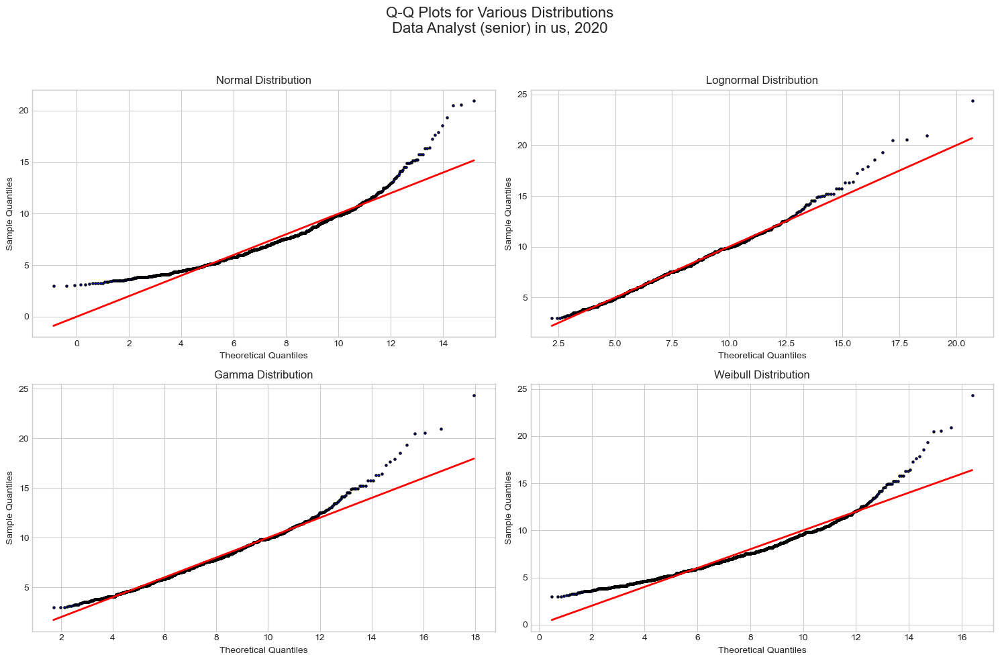

In [206]:
def plot_qq_plots(df, job_category, seniority_level, country, year, dot_size):
    # Filter the dataframe for the specific group
    group = df[(df['job_category'] == job_category) & 
               (df['seniority_level'] == seniority_level) #& 
               #(df['country'] == country) & 
               #(df['year'] == year)
              ]
    
    if group.empty:
        print("No data available for the specified group.")
        return
    
    data = group['salary_normmed_2024']
    
    # Fit distributions to the data
    mean, std = data.mean(), data.std()
    shape_log, loc_log, scale_log = stats.lognorm.fit(data, floc=0)
    shape_gamma, loc_gamma, scale_gamma = stats.gamma.fit(data, floc=0)
    shape_weibull, loc_weibull, scale_weibull = stats.weibull_min.fit(data, floc=0)
    
    # Create subplots
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle(f'Q-Q Plots for Various Distributions\n{job_category} ({seniority_level}) in {country}, {year}', fontsize=16)
    
    # Normal Q-Q plot
    theoretical_quantiles = np.linspace(0, 1, len(data))
    normal_quantiles = stats.norm.ppf(theoretical_quantiles, mean, std)
    axes[0, 0].scatter(normal_quantiles, np.sort(data), s=dot_size, color='blue', edgecolor='black')
    axes[0, 0].plot(normal_quantiles, normal_quantiles, 'r-', lw=2)  # Reference line
    axes[0, 0].set_title('Normal Distribution')
    axes[0, 0].set_xlabel('Theoretical Quantiles')
    axes[0, 0].set_ylabel('Sample Quantiles')
    
    # Lognormal Q-Q plot
    sorted_data = np.sort(data)
    norm_quantiles = stats.norm.ppf((np.arange(len(data)) + 0.5) / len(data))
    #lognormal_quantiles = np.exp(norm_quantiles * std + mean)  # Using original scale of quantiles
    lognormal_quantiles = np.exp(norm_quantiles * shape_log + np.log(scale_log))
    axes[0, 1].scatter(lognormal_quantiles, sorted_data, s=dot_size, color='blue', edgecolor='black')
    axes[0, 1].plot(lognormal_quantiles, lognormal_quantiles, 'r-', lw=2)  # Reference line
    axes[0, 1].set_title('Lognormal Distribution')
    axes[0, 1].set_xlabel('Theoretical Quantiles')
    axes[0, 1].set_ylabel('Sample Quantiles')
    
    # Gamma Q-Q plot
    sorted_data = np.sort(data)
    theoretical_quantiles_gamma = stats.gamma.ppf((np.arange(len(data)) + 0.5) / len(data), shape_gamma, loc_gamma, scale_gamma)
    axes[1, 0].scatter(theoretical_quantiles_gamma, sorted_data, s=dot_size, color='blue', edgecolor='black')
    axes[1, 0].plot(theoretical_quantiles_gamma, theoretical_quantiles_gamma, 'r-', lw=2)  # Reference line
    axes[1, 0].set_title('Gamma Distribution')
    axes[1, 0].set_xlabel('Theoretical Quantiles')
    axes[1, 0].set_ylabel('Sample Quantiles')
    
    # Weibull Q-Q plot
    sorted_data = np.sort(data)
    theoretical_quantiles_weibull = stats.weibull_min.ppf((np.arange(len(data)) + 0.5) / len(data), shape_weibull, loc_weibull, scale_weibull)
    axes[1, 1].scatter(theoretical_quantiles_weibull, sorted_data, s=dot_size, color='blue', edgecolor='black')
    axes[1, 1].plot(theoretical_quantiles_weibull, theoretical_quantiles_weibull, 'r-', lw=2)  # Reference line
    axes[1, 1].set_title('Weibull Distribution')
    axes[1, 1].set_xlabel('Theoretical Quantiles')
    axes[1, 1].set_ylabel('Sample Quantiles')
    
    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    # Show the plot
    plt.show()

# Example usage with one of the surveys (assuming df_ai is loaded)
# Adjust the parameters as needed
plot_qq_plots(df_ai, job_category='Data Analyst', seniority_level='senior', country='us', year='2020', dot_size=5)

## Fitting distribution-functions to specific factorial cells

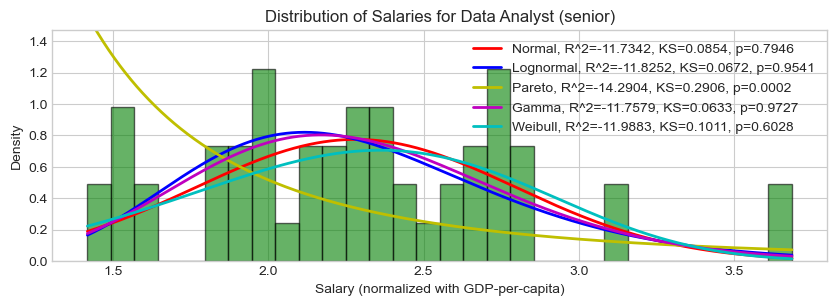

In [208]:
def calculate_r_squared(data, pdf, params):
    observed = data
    expected = pdf(data, *params)
    ss_res = np.sum((observed - expected) ** 2)
    ss_tot = np.sum((observed - np.mean(observed)) ** 2)
    return 1 - (ss_res / ss_tot)

def goodness_of_fit(data, dist_name, params):
    ks_statistic, ks_pvalue = stats.kstest(data, dist_name, args=params)
    return ks_statistic, ks_pvalue

def plot_distribution(df, job_category, seniority_level, country, year):
    # Filter the dataframe for the specific group
    group = df[
               (df['job_category'] == job_category) & 
               (df['seniority_level'] == seniority_level) #&
               #(df['country'] == country) #&
               #(df['year'] == year) &
              ]
    
    if group.empty:
        print("No data available for the specified group.")
        return
    
    data = group['salary_norm_2024']
    
    # Calculate the parameters for the normal, lognormal, Pareto, gamma, and Weibull distributions
    mean, std = data.mean(), data.std()
    shape_log, loc_log, scale_log = stats.lognorm.fit(data, floc=0)
    b, loc_pareto, scale_pareto = stats.pareto.fit(data, floc=0)
    shape_gamma, loc_gamma, scale_gamma = stats.gamma.fit(data, floc=0)
    shape_weibull, loc_weibull, scale_weibull = stats.weibull_min.fit(data, floc=0)
    
    # Calculate goodness-of-fit metrics
    normal_r2 = calculate_r_squared(data, stats.norm.pdf, (mean, std))
    lognormal_r2 = calculate_r_squared(data, stats.lognorm.pdf, (shape_log, loc_log, scale_log))
    pareto_r2 = calculate_r_squared(data, stats.pareto.pdf, (b, loc_pareto, scale_pareto))
    gamma_r2 = calculate_r_squared(data, stats.gamma.pdf, (shape_gamma, loc_gamma, scale_gamma))
    weibull_r2 = calculate_r_squared(data, stats.weibull_min.pdf, (shape_weibull, loc_weibull, scale_weibull))
    
    normal_ks = goodness_of_fit(data, 'norm', (mean, std))
    lognormal_ks = goodness_of_fit(data, 'lognorm', (shape_log, loc_log, scale_log))
    pareto_ks = goodness_of_fit(data, 'pareto', (b, loc_pareto, scale_pareto))
    gamma_ks = goodness_of_fit(data, 'gamma', (shape_gamma, loc_gamma, scale_gamma))
    weibull_ks = goodness_of_fit(data, 'weibull_min', (shape_weibull, loc_weibull, scale_weibull))
    
    # Generate points on the x axis for plotting the fitted curves
    x = np.linspace(data.min(), data.max(), 1000)
    
    # Plot the histogram
    plt.figure(figsize=(10, 3))
    plt.hist(data, bins=30, density=True, alpha=0.6, color='g', edgecolor='black')
    
    # Plot the fitted normal distribution curve
    plt.plot(x, stats.norm.pdf(x, mean, std), 'r-', lw=2, label=f'Normal, R^2={normal_r2:.4f}, KS={normal_ks[0]:.4f}, p={normal_ks[1]:.4f}')
    
    # Plot the fitted lognormal distribution curve
    plt.plot(x, stats.lognorm.pdf(x, shape_log, loc_log, scale_log), 'b-', lw=2, label=f'Lognormal, R^2={lognormal_r2:.4f}, KS={lognormal_ks[0]:.4f}, p={lognormal_ks[1]:.4f}')
    
    # Plot the fitted Pareto distribution curve
    plt.plot(x, stats.pareto.pdf(x, b, loc_pareto, scale_pareto), 'y-', lw=2, label=f'Pareto, R^2={pareto_r2:.4f}, KS={pareto_ks[0]:.4f}, p={pareto_ks[1]:.4f}')
    
    # Plot the fitted gamma distribution curve
    plt.plot(x, stats.gamma.pdf(x, shape_gamma, loc_gamma, scale_gamma), 'm-', lw=2, label=f'Gamma, R^2={gamma_r2:.4f}, KS={gamma_ks[0]:.4f}, p={gamma_ks[1]:.4f}')
    
    # Plot the fitted Weibull distribution curve
    plt.plot(x, stats.weibull_min.pdf(x, shape_weibull, loc_weibull, scale_weibull), 'c-', lw=2, label=f'Weibull, R^2={weibull_r2:.4f}, KS={weibull_ks[0]:.4f}, p={weibull_ks[1]:.4f}')
    
    # Add titles and labels
    plt.title(f'Distribution of Salaries for {job_category} ({seniority_level})')
    plt.xlabel('Salary (normalized with GDP-per-capita)')
    plt.ylabel('Density')
    plt.legend()
    
    # Adjust the y-limit to focus on the histogram, normal, and lognormal curves
    hist_max = np.histogram(data, bins=30, density=True)[0].max()
    plt.ylim(0, max(hist_max, max(stats.norm.pdf(x, mean, std)), max(stats.lognorm.pdf(x, shape_log, loc_log, scale_log))) * 1.2)
    
    # Show the plot
    plt.show()

# Example usage with one of the surveys (assuming df_it, df_k, df_ai are loaded)
# Adjust the parameters as needed
plot_distribution(df_it, job_category='Data Analyst', seniority_level='senior', country='', year='')

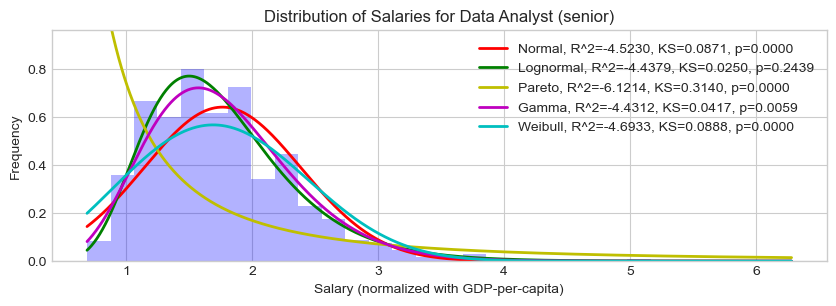

In [209]:
def calculate_r_squared(data, pdf, params):
    observed = data
    expected = pdf(data, *params)
    ss_res = np.sum((observed - expected) ** 2)
    ss_tot = np.sum((observed - np.mean(observed)) ** 2)
    return 1 - (ss_res / ss_tot)

def goodness_of_fit(data, dist_name, params):
    ks_statistic, ks_pvalue = stats.kstest(data, dist_name, args=params)
    return ks_statistic, ks_pvalue

def plot_distribution(df, job_category, seniority_level, country, year):
    # Filter the dataframe for the specific group
    group = df[
               (df['job_category'] == job_category) & 
               (df['seniority_level'] == seniority_level) #&
               #(df['country'] == country) #&
               #(df['year'] == year) &
              ]
    
    if group.empty:
        print("No data available for the specified group.")
        return
    
    data = group['salary_norm']
    
    # Calculate the parameters for the normal, lognormal, Pareto, gamma, and Weibull distributions
    mean, std = data.mean(), data.std()
    shape_log, loc_log, scale_log = stats.lognorm.fit(data, floc=0)
    b, loc_pareto, scale_pareto = stats.pareto.fit(data, floc=0)
    shape_gamma, loc_gamma, scale_gamma = stats.gamma.fit(data, floc=0)
    shape_weibull, loc_weibull, scale_weibull = stats.weibull_min.fit(data, floc=0)
    
    # Calculate goodness-of-fit metrics
    normal_r2 = calculate_r_squared(data, stats.norm.pdf, (mean, std))
    lognormal_r2 = calculate_r_squared(data, stats.lognorm.pdf, (shape_log, loc_log, scale_log))
    pareto_r2 = calculate_r_squared(data, stats.pareto.pdf, (b, loc_pareto, scale_pareto))
    gamma_r2 = calculate_r_squared(data, stats.gamma.pdf, (shape_gamma, loc_gamma, scale_gamma))
    weibull_r2 = calculate_r_squared(data, stats.weibull_min.pdf, (shape_weibull, loc_weibull, scale_weibull))
    
    normal_ks = goodness_of_fit(data, 'norm', (mean, std))
    lognormal_ks = goodness_of_fit(data, 'lognorm', (shape_log, loc_log, scale_log))
    pareto_ks = goodness_of_fit(data, 'pareto', (b, loc_pareto, scale_pareto))
    gamma_ks = goodness_of_fit(data, 'gamma', (shape_gamma, loc_gamma, scale_gamma))
    weibull_ks = goodness_of_fit(data, 'weibull_min', (shape_weibull, loc_weibull, scale_weibull))
    
    # Generate points on the x axis for plotting the fitted curves
    x = np.linspace(data.min(), data.max(), 1000)
    
    # Plot the histogram
    plt.figure(figsize=(10, 3))
    plt.hist(data, bins=30, density=True, alpha=0.3, color='blue')
    
    # Plot the fitted normal distribution curve
    plt.plot(x, stats.norm.pdf(x, mean, std), 'r-', lw=2, label=f'Normal, R^2={normal_r2:.4f}, KS={normal_ks[0]:.4f}, p={normal_ks[1]:.4f}')
    
    # Plot the fitted lognormal distribution curve
    plt.plot(x, stats.lognorm.pdf(x, shape_log, loc_log, scale_log), 'green', lw=2, label=f'Lognormal, R^2={lognormal_r2:.4f}, KS={lognormal_ks[0]:.4f}, p={lognormal_ks[1]:.4f}')
    
    # Plot the fitted Pareto distribution curve
    plt.plot(x, stats.pareto.pdf(x, b, loc_pareto, scale_pareto), 'y-', lw=2, label=f'Pareto, R^2={pareto_r2:.4f}, KS={pareto_ks[0]:.4f}, p={pareto_ks[1]:.4f}')
    
    # Plot the fitted gamma distribution curve
    plt.plot(x, stats.gamma.pdf(x, shape_gamma, loc_gamma, scale_gamma), 'm-', lw=2, label=f'Gamma, R^2={gamma_r2:.4f}, KS={gamma_ks[0]:.4f}, p={gamma_ks[1]:.4f}')
    
    # Plot the fitted Weibull distribution curve
    plt.plot(x, stats.weibull_min.pdf(x, shape_weibull, loc_weibull, scale_weibull), 'c-', lw=2, label=f'Weibull, R^2={weibull_r2:.4f}, KS={weibull_ks[0]:.4f}, p={weibull_ks[1]:.4f}')
    
    # Add titles and labels
    plt.title(f'Distribution of Salaries for {job_category} ({seniority_level})')
    plt.xlabel('Salary (normalized with GDP-per-capita)')
    plt.ylabel('Frequency')
    plt.legend()
    
    # Adjust the y-limit to focus on the histogram, normal, and lognormal curves
    hist_max = np.histogram(data, bins=30, density=True)[0].max()
    plt.ylim(0, max(hist_max, max(stats.norm.pdf(x, mean, std)), max(stats.lognorm.pdf(x, shape_log, loc_log, scale_log))) * 1.2)
    
    # Show the plot
    plt.show()

# Example usage with one of the surveys (assuming df_it, df_k, df_ai are loaded)
# Adjust the parameters as needed
plot_distribution(df_ai_w, job_category='Data Analyst', seniority_level='senior', country='', year='')

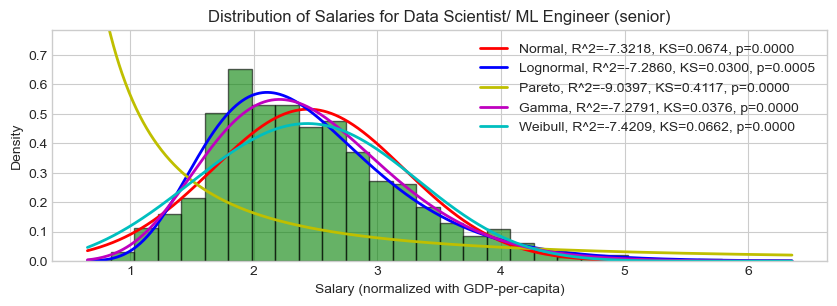

In [210]:
def calculate_r_squared(data, pdf, params):
    observed = data
    expected = pdf(data, *params)
    ss_res = np.sum((observed - expected) ** 2)
    ss_tot = np.sum((observed - np.mean(observed)) ** 2)
    return 1 - (ss_res / ss_tot)

def goodness_of_fit(data, dist_name, params):
    ks_statistic, ks_pvalue = stats.kstest(data, dist_name, args=params)
    return ks_statistic, ks_pvalue

def plot_distribution(df, job_category, seniority_level, country, year):
    # Filter the dataframe for the specific group
    group = df[
               (df['job_category'] == job_category) & 
               (df['seniority_level'] == seniority_level) &
               (df['country'] == country) #&
               #(df['year'] == year) &
              ]
    
    if group.empty:
        print("No data available for the specified group.")
        return
    
    data = group['salary_norm']
    
    # Calculate the parameters for the normal, lognormal, Pareto, gamma, and Weibull distributions
    mean, std = data.mean(), data.std()
    shape_log, loc_log, scale_log = stats.lognorm.fit(data, floc=0)
    b, loc_pareto, scale_pareto = stats.pareto.fit(data, floc=0)
    shape_gamma, loc_gamma, scale_gamma = stats.gamma.fit(data, floc=0)
    shape_weibull, loc_weibull, scale_weibull = stats.weibull_min.fit(data, floc=0)
    
    # Calculate goodness-of-fit metrics
    normal_r2 = calculate_r_squared(data, stats.norm.pdf, (mean, std))
    lognormal_r2 = calculate_r_squared(data, stats.lognorm.pdf, (shape_log, loc_log, scale_log))
    pareto_r2 = calculate_r_squared(data, stats.pareto.pdf, (b, loc_pareto, scale_pareto))
    gamma_r2 = calculate_r_squared(data, stats.gamma.pdf, (shape_gamma, loc_gamma, scale_gamma))
    weibull_r2 = calculate_r_squared(data, stats.weibull_min.pdf, (shape_weibull, loc_weibull, scale_weibull))
    
    normal_ks = goodness_of_fit(data, 'norm', (mean, std))
    lognormal_ks = goodness_of_fit(data, 'lognorm', (shape_log, loc_log, scale_log))
    pareto_ks = goodness_of_fit(data, 'pareto', (b, loc_pareto, scale_pareto))
    gamma_ks = goodness_of_fit(data, 'gamma', (shape_gamma, loc_gamma, scale_gamma))
    weibull_ks = goodness_of_fit(data, 'weibull_min', (shape_weibull, loc_weibull, scale_weibull))
    
    # Generate points on the x axis for plotting the fitted curves
    x = np.linspace(data.min(), data.max(), 1000)
    
    # Plot the histogram
    plt.figure(figsize=(10, 3))
    plt.hist(data, bins=30, density=True, alpha=0.6, color='g', edgecolor='black')
    
    # Plot the fitted normal distribution curve
    plt.plot(x, stats.norm.pdf(x, mean, std), 'r-', lw=2, label=f'Normal, R^2={normal_r2:.4f}, KS={normal_ks[0]:.4f}, p={normal_ks[1]:.4f}')
    
    # Plot the fitted lognormal distribution curve
    plt.plot(x, stats.lognorm.pdf(x, shape_log, loc_log, scale_log), 'b-', lw=2, label=f'Lognormal, R^2={lognormal_r2:.4f}, KS={lognormal_ks[0]:.4f}, p={lognormal_ks[1]:.4f}')
    
    # Plot the fitted Pareto distribution curve
    plt.plot(x, stats.pareto.pdf(x, b, loc_pareto, scale_pareto), 'y-', lw=2, label=f'Pareto, R^2={pareto_r2:.4f}, KS={pareto_ks[0]:.4f}, p={pareto_ks[1]:.4f}')
    
    # Plot the fitted gamma distribution curve
    plt.plot(x, stats.gamma.pdf(x, shape_gamma, loc_gamma, scale_gamma), 'm-', lw=2, label=f'Gamma, R^2={gamma_r2:.4f}, KS={gamma_ks[0]:.4f}, p={gamma_ks[1]:.4f}')
    
    # Plot the fitted Weibull distribution curve
    plt.plot(x, stats.weibull_min.pdf(x, shape_weibull, loc_weibull, scale_weibull), 'c-', lw=2, label=f'Weibull, R^2={weibull_r2:.4f}, KS={weibull_ks[0]:.4f}, p={weibull_ks[1]:.4f}')
    
    # Add titles and labels
    plt.title(f'Distribution of Salaries for {job_category} ({seniority_level})')
    plt.xlabel('Salary (normalized with GDP-per-capita)')
    plt.ylabel('Density')
    plt.legend()
    
    # Adjust the y-limit to focus on the histogram, normal, and lognormal curves
    hist_max = np.histogram(data, bins=30, density=True)[0].max()
    plt.ylim(0, max(hist_max, max(stats.norm.pdf(x, mean, std)), max(stats.lognorm.pdf(x, shape_log, loc_log, scale_log))) * 1.2)
    
    # Show the plot
    plt.show()

# Example usage with one of the surveys (assuming df_it, df_k, df_ai are loaded)
# Adjust the parameters as needed
plot_distribution(df_ai, job_category='Data Scientist/ ML Engineer', seniority_level='senior', country='us', year='')

#### Trying to confirm that lognorm is not the best overall fit?

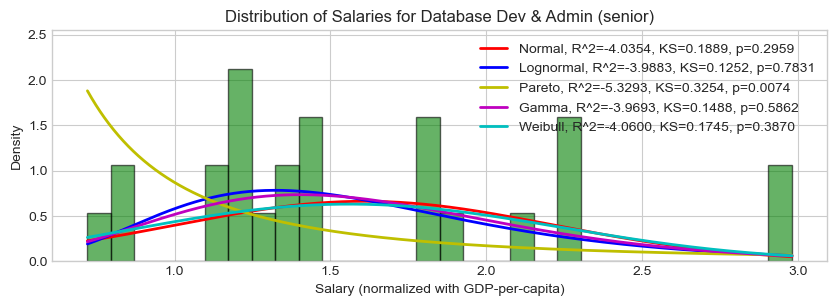

In [212]:
def calculate_r_squared(data, pdf, params):
    observed = data
    expected = pdf(data, *params)
    ss_res = np.sum((observed - expected) ** 2)
    ss_tot = np.sum((observed - np.mean(observed)) ** 2)
    return 1 - (ss_res / ss_tot)

def goodness_of_fit(data, dist_name, params):
    ks_statistic, ks_pvalue = stats.kstest(data, dist_name, args=params)
    return ks_statistic, ks_pvalue

def plot_distribution(df, job_category, seniority_level, country, year):
    # Filter the dataframe for the specific group
    group = df[
               (df['job_category'] == job_category) & 
               (df['seniority_level'] == seniority_level) #&
               #(df['country'] == country) #&
               #(df['year'] == year) &
              ]
    
    if group.empty:
        print("No data available for the specified group.")
        return
    
    data = group['salary_norm']
    
    # Calculate the parameters for the normal, lognormal, Pareto, gamma, and Weibull distributions
    mean, std = data.mean(), data.std()
    shape_log, loc_log, scale_log = stats.lognorm.fit(data, floc=0)
    b, loc_pareto, scale_pareto = stats.pareto.fit(data, floc=0)
    shape_gamma, loc_gamma, scale_gamma = stats.gamma.fit(data, floc=0)
    shape_weibull, loc_weibull, scale_weibull = stats.weibull_min.fit(data, floc=0)
    
    # Calculate goodness-of-fit metrics
    normal_r2 = calculate_r_squared(data, stats.norm.pdf, (mean, std))
    lognormal_r2 = calculate_r_squared(data, stats.lognorm.pdf, (shape_log, loc_log, scale_log))
    pareto_r2 = calculate_r_squared(data, stats.pareto.pdf, (b, loc_pareto, scale_pareto))
    gamma_r2 = calculate_r_squared(data, stats.gamma.pdf, (shape_gamma, loc_gamma, scale_gamma))
    weibull_r2 = calculate_r_squared(data, stats.weibull_min.pdf, (shape_weibull, loc_weibull, scale_weibull))
    
    normal_ks = goodness_of_fit(data, 'norm', (mean, std))
    lognormal_ks = goodness_of_fit(data, 'lognorm', (shape_log, loc_log, scale_log))
    pareto_ks = goodness_of_fit(data, 'pareto', (b, loc_pareto, scale_pareto))
    gamma_ks = goodness_of_fit(data, 'gamma', (shape_gamma, loc_gamma, scale_gamma))
    weibull_ks = goodness_of_fit(data, 'weibull_min', (shape_weibull, loc_weibull, scale_weibull))
    
    # Generate points on the x axis for plotting the fitted curves
    x = np.linspace(data.min(), data.max(), 1000)
    
    # Plot the histogram
    plt.figure(figsize=(10, 3))
    plt.hist(data, bins=30, density=True, alpha=0.6, color='g', edgecolor='black')
    
    # Plot the fitted normal distribution curve
    plt.plot(x, stats.norm.pdf(x, mean, std), 'r-', lw=2, label=f'Normal, R^2={normal_r2:.4f}, KS={normal_ks[0]:.4f}, p={normal_ks[1]:.4f}')
    
    # Plot the fitted lognormal distribution curve
    plt.plot(x, stats.lognorm.pdf(x, shape_log, loc_log, scale_log), 'b-', lw=2, label=f'Lognormal, R^2={lognormal_r2:.4f}, KS={lognormal_ks[0]:.4f}, p={lognormal_ks[1]:.4f}')
    
    # Plot the fitted Pareto distribution curve
    plt.plot(x, stats.pareto.pdf(x, b, loc_pareto, scale_pareto), 'y-', lw=2, label=f'Pareto, R^2={pareto_r2:.4f}, KS={pareto_ks[0]:.4f}, p={pareto_ks[1]:.4f}')
    
    # Plot the fitted gamma distribution curve
    plt.plot(x, stats.gamma.pdf(x, shape_gamma, loc_gamma, scale_gamma), 'm-', lw=2, label=f'Gamma, R^2={gamma_r2:.4f}, KS={gamma_ks[0]:.4f}, p={gamma_ks[1]:.4f}')
    
    # Plot the fitted Weibull distribution curve
    plt.plot(x, stats.weibull_min.pdf(x, shape_weibull, loc_weibull, scale_weibull), 'c-', lw=2, label=f'Weibull, R^2={weibull_r2:.4f}, KS={weibull_ks[0]:.4f}, p={weibull_ks[1]:.4f}')
    
    # Add titles and labels
    plt.title(f'Distribution of Salaries for {job_category} ({seniority_level})')
    plt.xlabel('Salary (normalized with GDP-per-capita)')
    plt.ylabel('Density')
    plt.legend()
    
    # Adjust the y-limit to focus on the histogram, normal, and lognormal curves
    hist_max = np.histogram(data, bins=30, density=True)[0].max()
    plt.ylim(0, max(hist_max, max(stats.norm.pdf(x, mean, std)), max(stats.lognorm.pdf(x, shape_log, loc_log, scale_log))) * 1.2)
    
    # Show the plot
    plt.show()

# Example usage with one of the surveys (assuming df_it, df_k, df_ai are loaded)
# Adjust the parameters as needed
plot_distribution(df_k_w_l, job_category='Database Dev & Admin', seniority_level='senior', country='', year='')

## Fitting the distribution-functions to all factorial cells

##### Try: 08-04: 19:56

In [215]:
def assess_fit_normal(data):
    kstest_result = stats.kstest(data, 'norm', args=(data.mean(), data.std()))
    return kstest_result.pvalue > 0.05  # Assume a significance level of 0.05

def assess_fit_lognormal_before1048(data):
    log_data = np.log(data)
    kstest_result = stats.kstest(log_data, 'norm')
    return kstest_result.pvalue > 0.05  # Assume a significance level of 0.05

def assess_fit_lognormal(data):
    # Lognormal requires positive data
    if np.any(data <= 0):
        return False
    # Fit lognormal parameters
    shape, loc, scale = stats.lognorm.fit(data, floc=0)
    # Perform K-S test using these parameters
    kstest_result = stats.kstest(data, 'lognorm', args=(shape, loc, scale))
    return kstest_result.pvalue > 0.05  # Assume a significance level of 0.05

def assess_fit_gamma(data):
    # Estimate gamma parameters
    alpha, loc, beta = stats.gamma.fit(data)
    kstest_result = stats.kstest(data, 'gamma', args=(alpha, loc, beta))
    return kstest_result.pvalue > 0.05

def assess_fit_weibull(data):
    # Estimate Weibull parameters
    c, loc, scale = stats.weibull_min.fit(data)
    kstest_result = stats.kstest(data, 'weibull_min', args=(c, loc, scale))
    return kstest_result.pvalue > 0.05

##### Storing it: 08-04: 22:40 - Success

In [217]:
def evaluate_survey(df, fit_function):
    fit_results = {
        'fits': [],
        'non_fits': []
    }
    grouped = df.groupby(['job_category', 'seniority_level'], observed=True)
    for name, group in grouped:
        sample_size = len(group['salary_norm'])
        fit = fit_function(group['salary_norm'])
        if fit:
            fit_results['fits'].append((name, sample_size))
        else:
            fit_results['non_fits'].append((name, sample_size))
    return fit_results

surveys = {'df_it': df_it_w_l, 'df_k': df_k_w_l, 'df_ai': df_ai_w_l}
distributions = {
    'normal': assess_fit_normal,
    'lognormal': assess_fit_lognormal,
    'gamma': assess_fit_gamma,
    'weibull': assess_fit_weibull
}

results_list = []

for survey_name, df in surveys.items():
    for dist_name, fit_function in distributions.items():
        fit_results = evaluate_survey(df, fit_function)
        fits = fit_results['fits']
        non_fits = fit_results['non_fits']
        total_groups = len(fits) + len(non_fits)
        fit_percentage = (len(fits) / total_groups) * 100 if total_groups > 0 else 0
        
        results_list.append({
            'Survey': survey_name,
            'Distribution': dist_name,
            'Total group count': total_groups,
            'Fit group count': len(fits),
            'Fit Percentage': fit_percentage
        })

# Create a DataFrame from the results
results_df = pd.DataFrame(results_list)

# Sort the DataFrame by Fit Percentage in descending order
results_df = results_df.sort_values('Fit Percentage', ascending=False)

# Reorder columns to put 'Total group count' and 'Fit group count' above 'Fit Percentage'
column_order = ['Survey', 'Distribution', 'Total group count', 'Fit group count', 'Fit Percentage']
results_df = results_df[column_order]
results_df

,Survey,Distribution,Total group count,Fit group count,Fit Percentage
1,df_it,lognormal,46,43,93.48
2,df_it,gamma,46,43,93.48
3,df_it,weibull,46,40,86.96
9,df_ai,lognormal,24,20,83.33
10,df_ai,gamma,24,20,83.33
11,df_ai,weibull,24,17,70.83
0,df_it,normal,46,32,69.57
8,df_ai,normal,24,11,45.83
5,df_k,lognormal,26,11,42.31
6,df_k,gamma,26,9,34.62


In [218]:
def evaluate_survey(df, fit_function):
    fit_results = {
        'fits': [],
        'non_fits': []
    }
    all_groups = []
    grouped = df.groupby(['job_category', 'seniority_level'], observed=True)
    for name, group in grouped:
        sample_size = len(group['salary_norm'])
        fit = fit_function(group['salary_norm'])
        if fit:
            fit_results['fits'].append((name, sample_size))
            all_groups.append((name, sample_size, 'Fit'))
        else:
            fit_results['non_fits'].append((name, sample_size))
            all_groups.append((name, sample_size, 'Non-Fit'))
    return fit_results, all_groups

surveys = {'df_it': df_it_w_l, 'df_k': df_k_w_l, 'df_ai': df_ai_w_l}
distributions = {
    'normal': assess_fit_normal,
    'lognormal': assess_fit_lognormal,
    'gamma': assess_fit_gamma,
    'weibull': assess_fit_weibull
}

results_list = []
all_groups_list = []

for survey_name, df in surveys.items():
    for dist_name, fit_function in distributions.items():
        fit_results, groups = evaluate_survey(df, fit_function)
        fits = fit_results['fits']
        non_fits = fit_results['non_fits']
        total_groups = len(fits) + len(non_fits)
        fit_percentage = (len(fits) / total_groups) * 100 if total_groups > 0 else 0
        
        results_list.append({
            'Survey': survey_name,
            'Distribution': dist_name,
            'Total group count': total_groups,
            'Fit group count': len(fits),
            'Fit Percentage': fit_percentage
        })
        
        for group in groups:
            all_groups_list.append({
                'Survey': survey_name,
                'Distribution': dist_name,
                'Job Category': group[0][0],
                'Seniority Level': group[0][1],
                'Sample Size': group[1],
                'Fit Status': group[2]
            })

# Create DataFrames from the results
results_df = pd.DataFrame(results_list)
all_groups_df = pd.DataFrame(all_groups_list)

# Sort the results DataFrame by Fit Percentage in descending order
results_df = results_df.sort_values('Fit Percentage', ascending=False)

# Reorder columns
column_order = ['Survey', 'Distribution', 'Total group count', 'Fit group count', 'Fit Percentage']
results_df = results_df[column_order]

# Display the results
#results_df

# Optionally, you can save these DataFrames to CSV files
# results_df.to_csv('distribution_fit_results.csv', index=False)
# all_groups_df.to_csv('all_factorial_groups.csv', index=False)

In [219]:
results_df.sort_values('Survey')

,Survey,Distribution,Total group count,Fit group count,Fit Percentage
9,df_ai,lognormal,24,20,83.33
10,df_ai,gamma,24,20,83.33
11,df_ai,weibull,24,17,70.83
8,df_ai,normal,24,11,45.83
1,df_it,lognormal,46,43,93.48
2,df_it,gamma,46,43,93.48
3,df_it,weibull,46,40,86.96
0,df_it,normal,46,32,69.57
5,df_k,lognormal,26,11,42.31
6,df_k,gamma,26,9,34.62


In [220]:
# Show all groups that fit the normal distribution for the IT survey
all_groups_df[(all_groups_df['Survey'] == 'df_ai') & 
                    (all_groups_df['Distribution'] == 'lognormal') #& 
                    #(all_groups_df['Fit Status'] == 'Fit')
             ]

,Survey,Distribution,Job Category,Seniority Level,Sample Size,Fit Status
312,df_ai,lognormal,Architects,medior,34,Fit
313,df_ai,lognormal,Architects,senior,443,Fit
314,df_ai,lognormal,Business Analyst,executive,24,Fit
315,df_ai,lognormal,Business Analyst,junior,59,Fit
316,df_ai,lognormal,Business Analyst,medior,136,Fit
317,df_ai,lognormal,Business Analyst,senior,344,Non-Fit
318,df_ai,lognormal,Data Analyst,executive,36,Fit
319,df_ai,lognormal,Data Analyst,junior,633,Fit
320,df_ai,lognormal,Data Analyst,medior,785,Fit
321,df_ai,lognormal,Data Analyst,senior,1667,Fit


Lognormal is a good fit, maybe even the best fit. Kolmogorov-Smirnov however is not proper to test normality, since it should be used to compare datasets with a preexisting concept of a distribution, and not to compare the data with a distribution generated from the data.

# Normality

In [223]:
from statsmodels.stats.diagnostic import lilliefors
from scipy.stats import skew, kurtosis, normaltest

In [224]:
job_category='Data Scientist/ ML Engineer'
seniority_level='junior'
#country='it'

len(
     df_ai[
    (df_ai['job_category'] == job_category) & 
    (df_ai['seniority_level'] == seniority_level) #&
    #(df_ai['country'] == country) #&
    #(df_ai['year'] == year)
    ]
)

334

In [225]:
def lilliefors_normality_test(df):
    # Initialize an empty list to store results
    results = []

    # Group the DataFrame by 'job_category' and 'seniority_level'
    grouped = df.groupby(['job_category', 'seniority_level'], observed=True)

    # Iterate over each group
    for (job_category, seniority_level), group in grouped:
        # Extract the 'salary' data, dropping NaN values
        salary_data = group['salary_norm_2024_log'].dropna()

        # Only perform the test if there are enough data points
        if len(salary_data) >= 5:
            # Perform the Lilliefors test
            stat, p_value = lilliefors(salary_data, dist='norm')
        else:
            p_value = None  # Not enough data to perform the test

        # Determine significance levels
        sig_p10 = '*' if p_value is not None and p_value < 0.10 else ''
        sig_p05 = '*' if p_value is not None and p_value < 0.05 else ''
        sig_p01 = '*' if p_value is not None and p_value < 0.01 else ''

        # Create a cell ID
        cell_id = f"{job_category}_{seniority_level}"

        # Append the results to the list
        results.append({
            'cell_id': cell_id,
            'job_category': job_category,
            'seniority_level': seniority_level,
            'p_value': p_value,
            'significance_p<0.10': sig_p10,
            'significance_p<0.05': sig_p05,
            'significance_p<0.01': sig_p01
        })

    # Convert the results list into a DataFrame
    result_df = pd.DataFrame(results)

    return result_df

# Example usage:
# Assuming you have a DataFrame 'df_survey' for a particular survey
result_df = lilliefors_normality_test(df_k_w_l)
result_df

,cell_id,job_category,seniority_level,p_value,significance_p<0.10,significance_p<0.05,significance_p<0.01
0,Data Analyst_executive,Data Analyst,executive,0.00,*,*,*
1,Data Analyst_junior,Data Analyst,junior,0.00,*,*,*
2,Data Analyst_medior,Data Analyst,medior,0.00,*,*,*
3,Data Analyst_senior,Data Analyst,senior,0.00,*,*,*
4,Data Engineer_executive,Data Engineer,executive,0.00,*,*,*
5,Data Engineer_junior,Data Engineer,junior,0.12,,,
6,Data Engineer_medior,Data Engineer,medior,0.01,*,*,
7,Data Engineer_senior,Data Engineer,senior,0.00,*,*,*
8,Data Scientist/ ML Engineer_executive,Data Scientist/ ML Engineer,executive,0.00,*,*,*
9,Data Scientist/ ML Engineer_junior,Data Scientist/ ML Engineer,junior,0.00,*,*,*


In [226]:
def lilliefors_normality_test(df):
    # Initialize an empty list to store results
    results = []

    # Group the DataFrame by 'job_category' and 'seniority_level'
    grouped = df.groupby(['job_category', 'seniority_level'], observed=True)

    # Iterate over each group
    for (job_category, seniority_level), group in grouped:
        # Extract the 'salary' data, dropping NaN values
        salary_data = group['salary_norm_2024_log'].dropna()

        # Calculate the population (number of data points in the group)
        population = len(salary_data)

        # Only perform the test if there are enough data points
        if population >= 5:
            # Perform the Lilliefors test
            stat, p_value = lilliefors(salary_data, dist='norm')
        else:
            p_value = None  # Not enough data to perform the test

        # Determine significance levels
        sig_p10 = '*' if p_value is not None and p_value < 0.10 else ''
        sig_p05 = '*' if p_value is not None and p_value < 0.05 else ''
        sig_p01 = '*' if p_value is not None and p_value < 0.01 else ''

        # Create a cell ID
        cell_id = f"{job_category}_{seniority_level}"

        # Append the results to the list
        results.append({
            'cell_id': cell_id,
            'job_category': job_category,
            'seniority_level': seniority_level,
            'population': population,
            'p_value': p_value,
            'significance_p<0.10': sig_p10,
            'significance_p<0.05': sig_p05,
            'significance_p<0.01': sig_p01
        })

    # Convert the results list into a DataFrame
    result_df = pd.DataFrame(results)

    return result_df

# Example usage:
# Assuming you have a DataFrame 'df_survey' for a particular survey
result_df = lilliefors_normality_test(df_ai_w_l)
result_df

,cell_id,job_category,seniority_level,population,p_value,significance_p<0.10,significance_p<0.05,significance_p<0.01
0,Architects_medior,Architects,medior,34,0.21,,,
1,Architects_senior,Architects,senior,443,0.34,,,
2,Business Analyst_executive,Business Analyst,executive,24,0.23,,,
3,Business Analyst_junior,Business Analyst,junior,59,0.06,*,,
4,Business Analyst_medior,Business Analyst,medior,136,0.09,*,,
5,Business Analyst_senior,Business Analyst,senior,344,0.00,*,*,*
6,Data Analyst_executive,Data Analyst,executive,36,0.73,,,
7,Data Analyst_junior,Data Analyst,junior,633,0.08,*,,
8,Data Analyst_medior,Data Analyst,medior,785,0.00,*,*,*
9,Data Analyst_senior,Data Analyst,senior,1667,0.01,*,*,*


In [227]:
def lilliefors_normality_test(df):
    # Initialize an empty list to store results
    results = []

    # Group the DataFrame by 'job_category' and 'seniority_level'
    grouped = df.groupby(['job_category', 'seniority_level'], observed=True)

    # Iterate over each group
    for (job_category, seniority_level), group in grouped:
        # Extract the 'salary' data, dropping NaN values
        salary_data = group['salary_norm_2024_log'].dropna()

        # Calculate the population (number of data points in the group)
        population = len(salary_data)

        # Only perform the test if there are enough data points
        if population >= 5:
            # Perform the Lilliefors test
            stat, p_value = lilliefors(salary_data, dist='norm')
            # Calculate Skewness and Kurtosis
            skewness = skew(salary_data)
            kurt = kurtosis(salary_data, fisher=True)  # Excess kurtosis (normal distribution has kurtosis 0)
        else:
            p_value = None  # Not enough data to perform the test
            skewness = None
            kurt = None

        # Determine significance levels
        sig_p10 = '*' if p_value is not None and p_value < 0.10 else ''
        sig_p05 = '*' if p_value is not None and p_value < 0.05 else ''
        sig_p01 = '*' if p_value is not None and p_value < 0.01 else ''

        # Create a cell ID
        cell_id = f"{job_category}_{seniority_level}"

        # Append the results to the list
        results.append({
            'cell_id': cell_id,
            'job_category': job_category,
            'seniority_level': seniority_level,
            'population': population,
            'p_value': p_value,
            'skewness': skewness,
            'kurtosis': kurt,
            'significance_p<0.10': sig_p10,
            'significance_p<0.05': sig_p05,
            'significance_p<0.01': sig_p01
        })

    # Convert the results list into a DataFrame
    result_df = pd.DataFrame(results)

    return result_df

# Example usage:
# Assuming you have a DataFrame 'df_survey' for a particular survey
result_df = lilliefors_normality_test(df_ai_w_l)
result_df

,cell_id,job_category,seniority_level,population,p_value,skewness,kurtosis,significance_p<0.10,significance_p<0.05,significance_p<0.01
0,Architects_medior,Architects,medior,34,0.21,-0.05,-0.57,,,
1,Architects_senior,Architects,senior,443,0.34,-0.01,0.05,,,
2,Business Analyst_executive,Business Analyst,executive,24,0.23,-0.05,-0.72,,,
3,Business Analyst_junior,Business Analyst,junior,59,0.06,0.40,0.16,*,,
4,Business Analyst_medior,Business Analyst,medior,136,0.09,-0.03,-1.05,*,,
5,Business Analyst_senior,Business Analyst,senior,344,0.00,-0.08,-1.05,*,*,*
6,Data Analyst_executive,Data Analyst,executive,36,0.73,-0.28,-0.77,,,
7,Data Analyst_junior,Data Analyst,junior,633,0.08,0.33,-0.04,*,,
8,Data Analyst_medior,Data Analyst,medior,785,0.00,0.20,-0.26,*,*,*
9,Data Analyst_senior,Data Analyst,senior,1667,0.01,0.22,0.17,*,*,*


In [228]:
def normality_tests(df):
    # Initialize an empty list to store results
    results = []

    # Group the DataFrame by 'job_category' and 'seniority_level'
    grouped = df.groupby(['job_category', 'seniority_level'], observed=True)

    # Iterate over each group
    for (job_category, seniority_level), group in grouped:
        # Extract the 'salary' data, dropping NaN values
        salary_data = group['salary_norm_2024_log'].dropna()

        # Calculate the population (number of data points in the group)
        population = len(salary_data)

        # Only perform the tests if there are enough data points
        if population >= 5:
            # Perform the Lilliefors test
            stat_l, p_value_l = lilliefors(salary_data, dist='norm')
            # Perform D'Agostino's K-squared test
            stat_k, p_value_k = normaltest(salary_data)
            # Calculate Skewness and Kurtosis
            skewness = skew(salary_data)
            kurt = kurtosis(salary_data, fisher=True)  # Excess kurtosis (normal distribution has kurtosis 0)
        else:
            p_value_l = None
            p_value_k = None
            skewness = None
            kurt = None

        # Determine significance levels for Lilliefors test
        L_sig_p10 = '*' if p_value_l is not None and p_value_l < 0.10 else ''
        L_sig_p05 = '*' if p_value_l is not None and p_value_l < 0.05 else ''
        L_sig_p01 = '*' if p_value_l is not None and p_value_l < 0.01 else ''

        # Determine significance levels for D'Agostino's K-squared test
        K_sig_p10 = '*' if p_value_k is not None and p_value_k < 0.10 else ''
        K_sig_p05 = '*' if p_value_k is not None and p_value_k < 0.05 else ''
        K_sig_p01 = '*' if p_value_k is not None and p_value_k < 0.01 else ''

        # Append the results to the list
        results.append({
            'job_category': job_category,
            'seniority_level': seniority_level,
            'population': population,
            'L_p': p_value_l,
            'L_sig_p<0.10': L_sig_p10,
            'L_sig_p<0.05': L_sig_p05,
            'L_sig_p<0.01': L_sig_p01,
            'skewness': skewness,
            'kurtosis': kurt,
            'K_p': p_value_k,
            'K_sig_p<0.10': K_sig_p10,
            'K_sig_p<0.05': K_sig_p05,
            'K_sig_p<0.01': K_sig_p01
        })

    # Convert the results list into a DataFrame
    result_df = pd.DataFrame(results)

    # Rearranging the columns as specified
    result_df = result_df[
        ['job_category', 'seniority_level', 'population',
         'L_p', 'L_sig_p<0.10', 'L_sig_p<0.05', 'L_sig_p<0.01',
         'skewness', 'kurtosis',
         'K_p', 'K_sig_p<0.10', 'K_sig_p<0.05', 'K_sig_p<0.01']
    ]

    return result_df

# Example usage:
# Assuming you have a DataFrame 'df_survey' for a particular survey
result_df = normality_tests(df_k_w_l)
result_df

,job_category,seniority_level,population,L_p,L_sig_p<0.10,L_sig_p<0.05,L_sig_p<0.01,skewness,kurtosis,K_p,K_sig_p<0.10,K_sig_p<0.05,K_sig_p<0.01
0,Data Analyst,executive,58,0.00,*,*,*,1.34,2.39,0.00,*,*,*
1,Data Analyst,junior,449,0.00,*,*,*,0.58,6.43,0.00,*,*,*
2,Data Analyst,medior,304,0.00,*,*,*,0.90,2.08,0.00,*,*,*
3,Data Analyst,senior,271,0.00,*,*,*,1.33,4.66,0.00,*,*,*
4,Data Engineer,executive,81,0.00,*,*,*,0.81,0.56,0.01,*,*,*
5,Data Engineer,junior,66,0.12,,,,-0.48,0.71,0.09,*,,
6,Data Engineer,medior,84,0.01,*,*,,0.78,0.64,0.01,*,*,*
7,Data Engineer,senior,185,0.00,*,*,*,0.75,1.66,0.00,*,*,*
8,Data Scientist/ ML Engineer,executive,604,0.00,*,*,*,1.14,2.12,0.00,*,*,*
9,Data Scientist/ ML Engineer,junior,541,0.00,*,*,*,-0.02,2.48,0.00,*,*,*


In [229]:
def normality_tests(df):
    # Initialize an empty list to store results
    results = []

    # Group the DataFrame by 'job_category' and 'seniority_level'
    grouped = df.groupby(['job_category', 'seniority_level'], observed=True)

    # Iterate over each group
    for (job_category, seniority_level), group in grouped:
        # Extract the 'salary' data, dropping NaN values
        salary_data = group['salary_norm_2024_log'].dropna()

        # Calculate the population (number of data points in the group)
        population = len(salary_data)

        # Only perform the tests if there are enough data points
        if population >= 5:
            # Perform the Lilliefors test
            stat_l, p_value_l = lilliefors(salary_data, dist='norm')
            # Perform D'Agostino's K-squared test
            stat_k, p_value_k = normaltest(salary_data)
            # Calculate Skewness and Kurtosis
            skewness = skew(salary_data)
            kurt = kurtosis(salary_data, fisher=True)  # Excess kurtosis (normal distribution has kurtosis 0)
        else:
            p_value_l = None
            p_value_k = None
            skewness = None
            kurt = None

        # Determine significance levels for Lilliefors test
        L_sig_p10 = '*' if p_value_l is not None and p_value_l < 0.10 else ''
        L_sig_p05 = '*' if p_value_l is not None and p_value_l < 0.05 else ''
        L_sig_p01 = '*' if p_value_l is not None and p_value_l < 0.01 else ''

        # Determine significance levels for D'Agostino's K-squared test
        K_sig_p10 = '*' if p_value_k is not None and p_value_k < 0.10 else ''
        K_sig_p05 = '*' if p_value_k is not None and p_value_k < 0.05 else ''
        K_sig_p01 = '*' if p_value_k is not None and p_value_k < 0.01 else ''

        # Append the results to the list
        results.append({
            'job_category': job_category,
            'seniority_level': seniority_level,
            'population': population,
            'L_p': p_value_l,
            'L_sig_p<0.10': L_sig_p10,
            'L_sig_p<0.05': L_sig_p05,
            'L_sig_p<0.01': L_sig_p01,
            'skewness': skewness,
            'kurtosis': kurt,
            'K_p': p_value_k,
            'K_sig_p<0.10': K_sig_p10,
            'K_sig_p<0.05': K_sig_p05,
            'K_sig_p<0.01': K_sig_p01
        })

    # Convert the results list into a DataFrame
    result_df = pd.DataFrame(results)

    # Rearranging the columns as specified
    result_df = result_df[
        ['job_category', 'seniority_level', 'population',
         'L_p', 'L_sig_p<0.10', 'L_sig_p<0.05', 'L_sig_p<0.01',
         'skewness', 'kurtosis',
         'K_p', 'K_sig_p<0.10', 'K_sig_p<0.05', 'K_sig_p<0.01']
    ]

    return result_df

# Example usage:
# Assuming you have a DataFrame 'df_survey' for a particular survey
result_df = normality_tests(df_it_w_l)
result_df

,job_category,seniority_level,population,L_p,L_sig_p<0.10,L_sig_p<0.05,L_sig_p<0.01,skewness,kurtosis,K_p,K_sig_p<0.10,K_sig_p<0.05,K_sig_p<0.01
0,Architects,executive,45,0.31,,,,0.31,-0.66,0.41,,,
1,Architects,senior,77,0.85,,,,-0.38,-0.39,0.31,,,
2,Back End,executive,46,0.02,*,*,,0.64,0.11,0.14,,,
3,Back End,junior,22,0.92,,,,-0.60,-0.16,0.38,,,
4,Back End,medior,174,0.17,,,,0.05,0.54,0.32,,,
5,Back End,senior,405,0.00,*,*,*,0.69,1.25,0.00,*,*,*
6,Data Analyst,medior,39,0.04,*,*,,0.45,1.76,0.04,*,*,
7,Data Analyst,senior,54,0.83,,,,-0.09,-0.37,0.91,,,
8,Data Engineer,medior,27,0.21,,,,0.00,0.36,0.63,,,
9,Data Engineer,senior,37,0.17,,,,0.72,1.01,0.04,*,*,


In [230]:
def assess_practical_normality(result_df, skewness_thr_small=0.5, kurtosis_thr_small=1, 
                               skewness_thr_medium=1, kurtosis_thr_medium=2, 
                               skewness_thr_large=1.5, kurtosis_thr_large=3):
    """
    This function assesses practical normality based on skewness, kurtosis, and population size.
    It adds a new column 'practical_normality' to the input result_df.
    
    Parameters:
    result_df (pd.DataFrame): DataFrame containing the normality test results.
    skewness_thr_small, kurtosis_thr_small: Thresholds for small samples (n < 50)
    skewness_thr_medium, kurtosis_thr_medium: Thresholds for medium samples (50 <= n <= 300)
    skewness_thr_large, kurtosis_thr_large: Thresholds for large samples (n > 300)
    
    Returns:
    pd.DataFrame: Modified DataFrame with a new column 'practical_normality' filled with 'yes' or 'no'.
    """
    
    # Initialize the new column for practical normality assessment
    result_df['practical_normality'] = 'no'  # Default to 'no', we'll set it to 'yes' when conditions are met

    # Iterate through each row in the DataFrame
    for index, row in result_df.iterrows():
        population = row['population']
        skewness = row['skewness']
        kurt = row['kurtosis']

        # Small sample size: n < 50
        if population < 50:
            if abs(skewness) <= skewness_thr_small and abs(kurt) <= kurtosis_thr_small:
                result_df.at[index, 'practical_normality'] = 'yes'

        # Medium sample size: 50 <= n <= 300
        elif 50 <= population <= 300:
            if abs(skewness) <= skewness_thr_medium and abs(kurt) <= kurtosis_thr_medium:
                result_df.at[index, 'practical_normality'] = 'yes'

        # Large sample size: n > 300
        else:
            if abs(skewness) <= skewness_thr_large and abs(kurt) <= kurtosis_thr_large:
                result_df.at[index, 'practical_normality'] = 'yes'
    
    return result_df

# Example usage
# Assuming 'result_df' is your DataFrame from the normality test
result_df = assess_practical_normality(result_df)
result_df[['job_category', 'seniority_level', 'population', 'skewness', 'kurtosis', 'practical_normality']]

,job_category,seniority_level,population,skewness,kurtosis,practical_normality
0,Architects,executive,45,0.31,-0.66,yes
1,Architects,senior,77,-0.38,-0.39,yes
2,Back End,executive,46,0.64,0.11,no
3,Back End,junior,22,-0.60,-0.16,no
4,Back End,medior,174,0.05,0.54,yes
5,Back End,senior,405,0.69,1.25,yes
6,Data Analyst,medior,39,0.45,1.76,no
7,Data Analyst,senior,54,-0.09,-0.37,yes
8,Data Engineer,medior,27,0.00,0.36,yes
9,Data Engineer,senior,37,0.72,1.01,no


In [231]:
# Total population across all factorial cells
total_population = result_df['population'].sum()
# Population of cells that are considered practically normal
practical_normal_population = result_df[result_df['practical_normality'] == 'yes']['population'].sum()
# Calculate the proportion of practically normal cells weighted by population
practical_significant_proportion = (practical_normal_population / total_population) * 100
print(f"Practical significant normal proportion of the dataframe: {practical_significant_proportion:.2f}%")

Practical significant normal proportion of the dataframe: 82.96%


# Independence

Yearly repetition could make it a paired setup, if the same individuals answered the survey each year.\
The same individuals may participate in multiple surveys and/or across multiple years, leading to correlated observations.
I assume independence, but it's likely a mix of the two.

Impact on Analysis:
Underestimation of Standard Errors: Ignoring the correlation between repeated measures can lead to underestimating standard errors, increasing the risk of Type I errors (false positives).

# Levene: Homogeneity of variances (between surveys) (Levene)

## Pooled Approach

In [236]:
# Combine dataframes
df_conc = pd.concat([df_ai, df_it, df_k])

# Define a function to perform Levene's test for each factorial group
def analyze_factorial_groups(df):
    # Get unique factorial groups
    factorial_groups = df.groupby(['job_category', 'seniority_level'], observed=True).size().reset_index(name='count')
    
    results = []
    
    for _, group in factorial_groups.iterrows():
        job_category = group['job_category']
        seniority_level = group['seniority_level']
        
        # Filter data for the current factorial group
        subset_df = df[
            (df['job_category'] == job_category) &
            (df['seniority_level'] == seniority_level)
        ]
        
        # Check if there are at least 2 surveys with data in this group
        if subset_df['survey'].nunique() < 2:
            continue
        
        # Prepare data for Levene's test
        survey_groups = [subset_df[subset_df['survey'] == survey]['salary_norm_2024'] for survey in subset_df['survey'].unique()]
        
        # Levene's test for homogeneity of variances
        stat, p_value_levene = stats.levene(*survey_groups)
        
        # Determine significance for various levels
        significance_0_10 = '*' if p_value_levene < 0.10 else ''
        significance_0_05 = '*' if p_value_levene < 0.05 else ''
        significance_0_01 = '*' if p_value_levene < 0.01 else ''
        
        # Collect results
        results.append({
            'job_category': job_category,
            'seniority_level': seniority_level,
            'Levene_p_value': p_value_levene,
            'Significance_p<0.10': significance_0_10,
            'Significance_p<0.05': significance_0_05,
            'Significance_p<0.01': significance_0_01
        })
    
    return pd.DataFrame(results)

# Run the analysis for each factorial group
results_df = analyze_factorial_groups(df_conc)

# Output results
print('Levene\'s Test results:')
print('Null Hypothesis: The variances across different surveys are equal (homoscedasticity). In other words, it assumes that the variability in salaries is similar across surveys within each factorial group.')
print('Significance at different p-levels indicates whether the null hypothesis can be rejected. If the p-value is below a significance level, it suggests that the variances differ significantly between surveys, which may impact the validity of combining the surveys for further analysis.')
results_df

# Optionally, save results to a CSV file
#results_df.to_csv('levene_results.csv', index=False)

C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:3345: RuntimeWarning:

invalid value encountered in scalar divide



Levene's Test results:
Null Hypothesis: The variances across different surveys are equal (homoscedasticity). In other words, it assumes that the variability in salaries is similar across surveys within each factorial group.
Significance at different p-levels indicates whether the null hypothesis can be rejected. If the p-value is below a significance level, it suggests that the variances differ significantly between surveys, which may impact the validity of combining the surveys for further analysis.


,job_category,seniority_level,Levene_p_value,Significance_p<0.10,Significance_p<0.05,Significance_p<0.01
0,"""Other""",executive,0.16,,,
1,"""Other""",junior,0.19,,,
2,"""Other""",medior,0.02,*,*,
3,"""Other""",senior,0.00,*,*,*
4,Architects,executive,0.03,*,*,
5,Architects,junior,0.54,,,
6,Architects,medior,0.25,,,
7,Architects,senior,0.00,*,*,*
8,Business Analyst,medior,0.33,,,
9,Consultant,executive,NaN,,,


Note: The warning "invalid value encountered in scalar divide" during VIF calculation
likely results from perfect multicollinearity or a lack of variance within certain categorical 
variables (e.g., constant values, sparse levels, or redundant categories). At this stage, 
we consider this warning to be informative and indicative of multicollinearity in the selected 
combination of variables. 

## Pairwise

In [239]:
# Define a function to perform Levene's test for each factorial group
def analyze_factorial_groups_pairwise(df1, df2, df1_name, df2_name):
    # Combine the two dataframes
    df_conc = pd.concat([df1, df2])
    
    # Get unique factorial groups
    factorial_groups = df_conc.groupby(['job_category', 'seniority_level'], observed=True).size().reset_index(name='count')
    
    results = []
    homoscedastic_groups = 0
    
    for _, group in factorial_groups.iterrows():
        job_category = group['job_category']
        seniority_level = group['seniority_level']
        
        # Filter data for the current factorial group
        subset_df1 = df1[
            (df1['job_category'] == job_category) &
            (df1['seniority_level'] == seniority_level)
        ]
        
        subset_df2 = df2[
            (df2['job_category'] == job_category) &
            (df2['seniority_level'] == seniority_level)
        ]
        
        # Check if both surveys have data in this group
        if subset_df1.empty or subset_df2.empty:
            continue
        
        # Prepare data for Levene's test
        survey_groups = [subset_df1['salary_norm_2024'], subset_df2['salary_norm_2024']]
        
        # Levene's test for homogeneity of variances
        stat, p_value_levene = stats.levene(*survey_groups)
        
        # Check if variances are homoscedastic (p-value >= 0.05)
        is_homoscedastic = p_value_levene >= 0.05
        if is_homoscedastic:
            homoscedastic_groups += 1
        
        # Collect results
        results.append({
            'job_category': job_category,
            'seniority_level': seniority_level,
            'Levene_p_value': p_value_levene,
            'Is_Homoscedastic': is_homoscedastic
        })
    
    # Calculate percentage of homoscedastic groups
    total_groups = len(results)
    homoscedastic_percentage = (homoscedastic_groups / total_groups) * 100 if total_groups > 0 else np.nan
    
    return pd.DataFrame(results), homoscedastic_percentage

# Run the analysis for each pair of dataframes
results_k_ai, percentage_k_ai = analyze_factorial_groups_pairwise(df_k, df_ai, 'df_k', 'df_ai')
results_k_it, percentage_k_it = analyze_factorial_groups_pairwise(df_k, df_it, 'df_k', 'df_it')
results_ai_it, percentage_ai_it = analyze_factorial_groups_pairwise(df_ai, df_it, 'df_ai', 'df_it')

# Print the percentage of homoscedastic groups for each pair
print(f'Percentage of homoscedastic groups (df_k vs. df_ai): {percentage_k_ai:.2f}%')
print(f'Percentage of homoscedastic groups (df_k vs. df_it): {percentage_k_it:.2f}%')
print(f'Percentage of homoscedastic groups (df_ai vs. df_it): {percentage_ai_it:.2f}%')

# Optionally, save results to CSV files
# results_k_ai.to_csv('levene_results_k_ai.csv', index=False)
# results_k_it.to_csv('levene_results_k_it.csv', index=False)
# results_ai_it.to_csv('levene_results_ai_it.csv', index=False)

C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:3345: RuntimeWarning:

invalid value encountered in scalar divide



Percentage of homoscedastic groups (df_k vs. df_ai): 48.15%
Percentage of homoscedastic groups (df_k vs. df_it): 52.63%
Percentage of homoscedastic groups (df_ai vs. df_it): 73.91%


Note: The RuntimeWarning ("invalid value encountered in scalar divide") informs us of instances where
factorial groups lacked sufficient data for reliable variance comparison, likely due to sparse
data within certain combinations. 

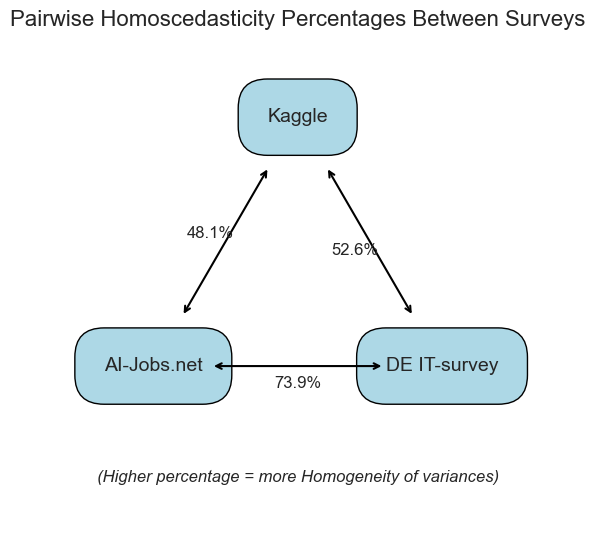

In [241]:
# Survey labels
labels = ['Kaggle', 'AI-Jobs.net', 'DE IT-survey']

# Coordinates for the triangle vertices (equilateral triangle)
triangle_coords = np.array([
    [0, 1],   # df_k
    [-0.87, -0.5],  # df_ai
    [0.87, -0.5]   # df_it
])

# Create a plot
plt.figure(figsize=(8, 8))
ax = plt.gca()

# Plot the nodes (surveys)
for i, coord in enumerate(triangle_coords):
    ax.text(coord[0], coord[1], labels[i], fontsize=14, ha='center', va='center', bbox=dict(facecolor='lightblue', edgecolor='black', boxstyle='round,pad=1.5'))

# Define the pairs and corresponding percentages
pairs = [(0, 1, percentage_k_ai), (0, 2, percentage_k_it), (1, 2, percentage_ai_it)]

# Draw shortened arrows between the surveys with the percentage labels
for start, end, percentage in pairs:
    # Calculate the shortened start and end points
    start_x, start_y = triangle_coords[start]
    end_x, end_y = triangle_coords[end]
    
    # Calculate direction vector and shorten the arrow by 15%
    direction_x = end_x - start_x
    direction_y = end_y - start_y
    arrow_length = 0.20  # Shortening factor
    
    start_shortened_x = start_x + arrow_length * direction_x
    start_shortened_y = start_y + arrow_length * direction_y
    end_shortened_x = end_x - arrow_length * direction_x
    end_shortened_y = end_y - arrow_length * direction_y
    
    # Create the arrow with heads on both ends
    ax.annotate(
        '', xy=(end_shortened_x, end_shortened_y), xytext=(start_shortened_x, start_shortened_y),
        arrowprops=dict(arrowstyle='<->', color='black', lw=1.5)
    )
    
    # Calculate the midpoint for placing the percentage text
    mid_x = (start_shortened_x + end_shortened_x) / 2
    mid_y = (start_shortened_y + end_shortened_y) / 2
    
    # Offset the text to avoid obstruction by the arrow
    offset_x = (end_shortened_y - start_shortened_y) * 0.1
    offset_y = (start_shortened_x - end_shortened_x) * 0.1
    
    ax.text(mid_x + offset_x, mid_y + offset_y, f'{percentage:.1f}%', fontsize=12, ha='center', va='center')

# Adjust plot limits and aspect ratio
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
ax.set_aspect('equal')
ax.axis('off')

# Title
plt.title('Pairwise Homoscedasticity Percentages Between Surveys', fontsize=16)
plt.text(0.5, 0.1, '(Higher percentage = more Homogeneity of variances)', fontsize=12, fontstyle='italic', ha='center', transform=ax.transAxes)

plt.gcf().tight_layout(pad=10)

# Display the plot
plt.show()

### Pairwise with Bonferroni-correction

In [243]:
# Define a function to perform Levene's test for each factorial group with Bonferroni correction
def analyze_factorial_groups_pairwise(df1, df2, df1_name, df2_name):
    # Combine the two dataframes
    df_conc = pd.concat([df1, df2])
    
    # Get unique factorial groups
    factorial_groups = df_conc.groupby(['job_category', 'seniority_level'], observed=True).size().reset_index(name='count')
    
    results = []
    homoscedastic_groups = 0
    total_tests = len(factorial_groups)  # Total number of comparisons
    
    # Bonferroni corrected alpha level
    alpha = 0.05
    corrected_alpha = alpha / total_tests if total_tests > 0 else np.nan
    
    for _, group in factorial_groups.iterrows():
        job_category = group['job_category']
        seniority_level = group['seniority_level']
        
        # Filter data for the current factorial group
        subset_df1 = df1[
            (df1['job_category'] == job_category) &
            (df1['seniority_level'] == seniority_level)
        ]
        
        subset_df2 = df2[
            (df2['job_category'] == job_category) &
            (df2['seniority_level'] == seniority_level)
        ]
        
        # Check if both surveys have data in this group
        if subset_df1.empty or subset_df2.empty:
            continue
        
        # Prepare data for Levene's test
        survey_groups = [subset_df1['salary_norm_2024'], subset_df2['salary_norm_2024']]
        
        # Levene's test for homogeneity of variances
        stat, p_value_levene = stats.levene(*survey_groups)
        
        # Apply Bonferroni correction
        is_homoscedastic = p_value_levene >= corrected_alpha
        if is_homoscedastic:
            homoscedastic_groups += 1
        
        # Collect results
        results.append({
            'job_category': job_category,
            'seniority_level': seniority_level,
            'Levene_p_value': p_value_levene,
            'Corrected_Alpha': corrected_alpha,
            'Is_Homoscedastic': is_homoscedastic
        })
    
    # Calculate percentage of homoscedastic groups
    total_groups = len(results)
    homoscedastic_percentage = (homoscedastic_groups / total_groups) * 100 if total_groups > 0 else np.nan
    
    return pd.DataFrame(results), homoscedastic_percentage

# Run the analysis for each pair of dataframes
results_k_ai, percentage_k_ai = analyze_factorial_groups_pairwise(df_k, df_ai, 'df_k', 'df_ai')
results_k_it, percentage_k_it = analyze_factorial_groups_pairwise(df_k, df_it, 'df_k', 'df_it')
results_ai_it, percentage_ai_it = analyze_factorial_groups_pairwise(df_ai, df_it, 'df_ai', 'df_it')

# Print the percentage of homoscedastic groups for each pair
print(f'Percentage of homoscedastic groups (df_k vs. df_ai): {percentage_k_ai:.2f}%')
print(f'Percentage of homoscedastic groups (df_k vs. df_it): {percentage_k_it:.2f}%')
print(f'Percentage of homoscedastic groups (df_ai vs. df_it): {percentage_ai_it:.2f}%')

C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:3345: RuntimeWarning:

invalid value encountered in scalar divide



Percentage of homoscedastic groups (df_k vs. df_ai): 70.37%
Percentage of homoscedastic groups (df_k vs. df_it): 84.21%
Percentage of homoscedastic groups (df_ai vs. df_it): 91.30%


Note: the RuntimeWarning ("invalid value encountered in scalar divide") informs us of instances where
factorial groups lacked sufficient data for reliable variance comparison, likely due to sparse
data within certain combinations.

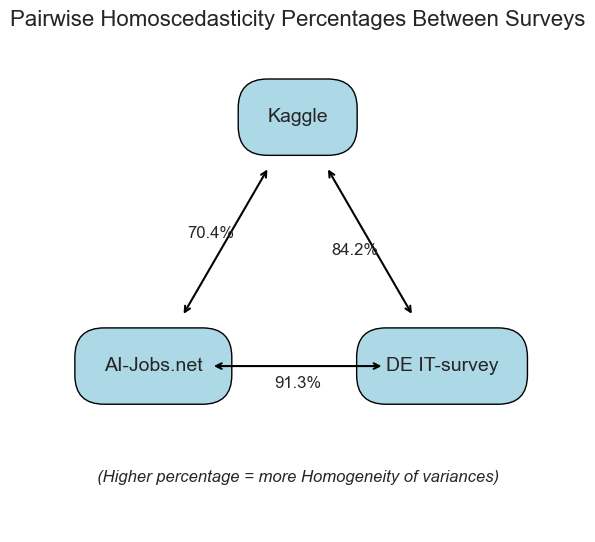

In [245]:
# Survey labels
labels = ['Kaggle', 'AI-Jobs.net', 'DE IT-survey']

# Coordinates for the triangle vertices (equilateral triangle)
triangle_coords = np.array([
    [0, 1],   # df_k
    [-0.87, -0.5],  # df_ai
    [0.87, -0.5]   # df_it
])

# Create a plot
plt.figure(figsize=(8, 8))
ax = plt.gca()

# Plot the nodes (surveys)
for i, coord in enumerate(triangle_coords):
    ax.text(coord[0], coord[1], labels[i], fontsize=14, ha='center', va='center', bbox=dict(facecolor='lightblue', edgecolor='black', boxstyle='round,pad=1.5'))

# Define the pairs and corresponding percentages
pairs = [(0, 1, percentage_k_ai), (0, 2, percentage_k_it), (1, 2, percentage_ai_it)]

# Draw shortened arrows between the surveys with the percentage labels
for start, end, percentage in pairs:
    # Calculate the shortened start and end points
    start_x, start_y = triangle_coords[start]
    end_x, end_y = triangle_coords[end]
    
    # Calculate direction vector and shorten the arrow by 15%
    direction_x = end_x - start_x
    direction_y = end_y - start_y
    arrow_length = 0.20  # Shortening factor
    
    start_shortened_x = start_x + arrow_length * direction_x
    start_shortened_y = start_y + arrow_length * direction_y
    end_shortened_x = end_x - arrow_length * direction_x
    end_shortened_y = end_y - arrow_length * direction_y
    
    # Create the arrow with heads on both ends
    ax.annotate(
        '', xy=(end_shortened_x, end_shortened_y), xytext=(start_shortened_x, start_shortened_y),
        arrowprops=dict(arrowstyle='<->', color='black', lw=1.5)
    )
    
    # Calculate the midpoint for placing the percentage text
    mid_x = (start_shortened_x + end_shortened_x) / 2
    mid_y = (start_shortened_y + end_shortened_y) / 2
    
    # Offset the text to avoid obstruction by the arrow
    offset_x = (end_shortened_y - start_shortened_y) * 0.1
    offset_y = (start_shortened_x - end_shortened_x) * 0.1
    
    ax.text(mid_x + offset_x, mid_y + offset_y, f'{percentage:.1f}%', fontsize=12, ha='center', va='center')

# Adjust plot limits and aspect ratio
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
ax.set_aspect('equal')
ax.axis('off')

# Title
plt.title('Pairwise Homoscedasticity Percentages Between Surveys', fontsize=16)
plt.text(0.5, 0.1, '(Higher percentage = more Homogeneity of variances)', fontsize=12, fontstyle='italic', ha='center', transform=ax.transAxes)

plt.gcf().tight_layout(pad=10)

# Display the plot
plt.show()

### Brown-Forscythe without correction

### Brown-Forscythe with Bonferroni-correction

In [248]:
# Define a function to perform the Brown-Forsythe test for each factorial group with Bonferroni correction
def analyze_factorial_groups_pairwise(df1, df2, df1_name, df2_name):
    # Combine the two dataframes
    df_conc = pd.concat([df1, df2])
    
    # Get unique factorial groups
    factorial_groups = df_conc.groupby(['job_category', 'seniority_level'],observed=True).size().reset_index(name='count')
    
    results = []
    homoscedastic_groups = 0
    total_tests = len(factorial_groups)  # Total number of comparisons
    
    # Bonferroni corrected alpha level
    alpha = 0.05
    corrected_alpha = alpha / total_tests if total_tests > 0 else np.nan
    
    for _, group in factorial_groups.iterrows():
        job_category = group['job_category']
        seniority_level = group['seniority_level']
        
        # Filter data for the current factorial group
        subset_df1 = df1[
            (df1['job_category'] == job_category) &
            (df1['seniority_level'] == seniority_level)
        ]
        
        subset_df2 = df2[
            (df2['job_category'] == job_category) &
            (df2['seniority_level'] == seniority_level)
        ]
        
        # Check if both surveys have data in this group
        if subset_df1.empty or subset_df2.empty:
            continue
        
        # Prepare data for Brown-Forsythe test (which is a variant of Levene's test using medians)
        survey_groups = [subset_df1['salary_norm_2024'], subset_df2['salary_norm_2024']]
        
        # Brown-Forsythe test for homogeneity of variances (using the median)
        stat, p_value_bf = stats.levene(*survey_groups, center='median')
        
        # Apply Bonferroni correction
        is_homoscedastic = p_value_bf >= corrected_alpha
        if is_homoscedastic:
            homoscedastic_groups += 1
        
        # Collect results
        results.append({
            'job_category': job_category,
            'seniority_level': seniority_level,
            'Brown_Forsythe_p_value': p_value_bf,
            'Corrected_Alpha': corrected_alpha,
            'Is_Homoscedastic': is_homoscedastic
        })
    
    # Calculate percentage of homoscedastic groups
    total_groups = len(results)
    homoscedastic_percentage = (homoscedastic_groups / total_groups) * 100 if total_groups > 0 else np.nan
    
    return pd.DataFrame(results), homoscedastic_percentage

# Run the analysis for each pair of dataframes
results_k_ai, percentage_k_ai = analyze_factorial_groups_pairwise(df_k, df_ai, 'df_k', 'df_ai')
results_k_it, percentage_k_it = analyze_factorial_groups_pairwise(df_k, df_it, 'df_k', 'df_it')
results_ai_it, percentage_ai_it = analyze_factorial_groups_pairwise(df_ai, df_it, 'df_ai', 'df_it')

# Print the percentage of homoscedastic groups for each pair
print(f'Percentage of homoscedastic groups (df_k vs. df_ai): {percentage_k_ai:.2f}%')
print(f'Percentage of homoscedastic groups (df_k vs. df_it): {percentage_k_it:.2f}%')
print(f'Percentage of homoscedastic groups (df_ai vs. df_it): {percentage_ai_it:.2f}%')

C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:3345: RuntimeWarning:

invalid value encountered in scalar divide



Percentage of homoscedastic groups (df_k vs. df_ai): 70.37%
Percentage of homoscedastic groups (df_k vs. df_it): 84.21%
Percentage of homoscedastic groups (df_ai vs. df_it): 91.30%


Note: the RuntimeWarning ("invalid value encountered in scalar divide") informs us of instances where
factorial groups lacked sufficient data for reliable variance comparison, likely due to sparse
data within certain combinations. 

### Practical significance

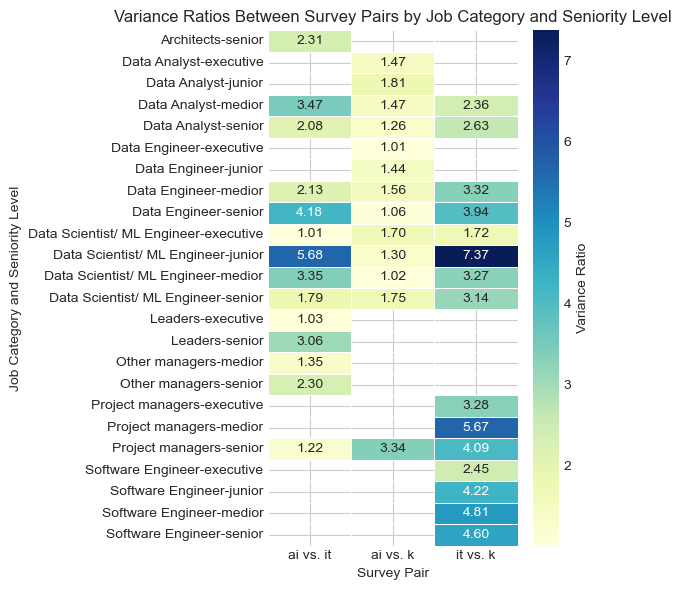

In [251]:
df_name = df_combined

# Initialize a list to store the variance ratios
variance_ratios_list = []

# Get unique combinations of 'job_category' and 'seniority_level'
factorial_cells = df_combined.groupby(['job_category', 'seniority_level'], observed=True).size().reset_index().iloc[:, :2]
surveys = df_combined['survey'].unique()

# Calculate variance ratios for each factorial cell
for _, row in factorial_cells.iterrows():
    job_category = row['job_category']
    seniority_level = row['seniority_level']
    cell_data = df_combined[(df_combined['job_category'] == job_category) & (df_combined['seniority_level'] == seniority_level)]
    cell_surveys = cell_data['survey'].unique()

    if len(cell_surveys) < 2:
        continue  # Skip if fewer than two surveys

    variances = cell_data.groupby('survey', observed=True)['salary_norm_2024_log'].var()
    for i in range(len(surveys)):
        for j in range(i+1, len(surveys)):
            survey_i, survey_j = surveys[i], surveys[j]
            if survey_i in cell_surveys and survey_j in cell_surveys:
                var_i, var_j = variances[survey_i], variances[survey_j]
                variance_ratio = var_i / var_j if var_i > var_j else var_j / var_i
                variance_ratios_list.append({
                    'job_category': job_category,
                    'seniority_level': seniority_level,
                    'survey_pair': f"{survey_i} vs. {survey_j}",
                    'variance_ratio': variance_ratio
                })

# Convert results to DataFrame and pivot for heatmap
variance_ratios_df = pd.DataFrame(variance_ratios_list)
variance_ratios_pivot = variance_ratios_df.pivot_table(
    index=['job_category', 'seniority_level'],
    columns='survey_pair',
    values='variance_ratio'
)

# Plot the heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(variance_ratios_pivot, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=0.5, cbar_kws={'label': 'Variance Ratio'})
plt.title('Variance Ratios Between Survey Pairs by Job Category and Seniority Level')
plt.xlabel('Survey Pair')
plt.ylabel('Job Category and Seniority Level')
plt.xticks(rotation=0, ha='center')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [252]:
# Optionally, analyze the variance ratios
# For example, count how many variance ratios exceed a threshold
threshold = 2  # You can change this value to 3 if preferred
high_variance_ratios = variance_ratios_df[variance_ratios_df['variance_ratio'] >= threshold]

print(f"\nNumber of comparisons with variance ratio ≥ {threshold}: {len(high_variance_ratios)}")
print(f"Total number of comparisons: {len(variance_ratios_df)}")
print(f"Percentage of high variance ratios: {len(high_variance_ratios) / len(variance_ratios_df) * 100:.2f}%")


Number of comparisons with variance ratio ≥ 2: 24
Total number of comparisons: 42
Percentage of high variance ratios: 57.14%


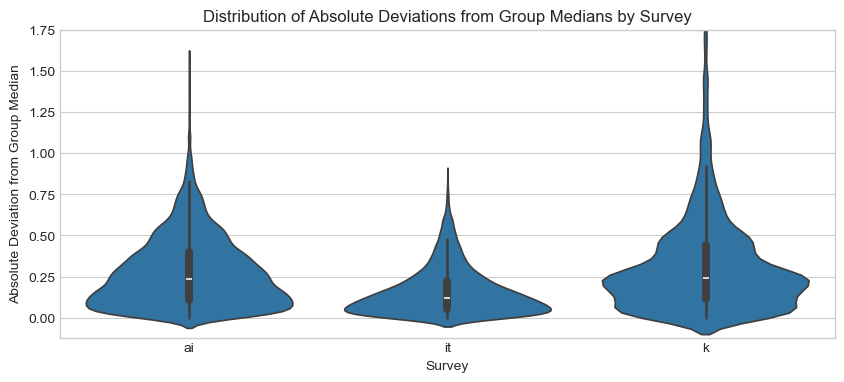

In [253]:
df_name = df_combined

# Step 1: Compute the group medians
df_name['group_median'] = df_name.groupby(['survey', 'job_category', 'seniority_level'], observed=True)['salary_norm_2024_log'].transform('median')

# Step 2: Calculate the absolute deviations from the group medians
df_name['abs_dev'] = np.abs(df_name['salary_norm_2024_log'] - df_name['group_median'])

# Violin plot by survey
plt.figure(figsize=(10, 4))
sns.violinplot(x='survey', y='abs_dev', data=df_name, inner="box", density_norm='width')
plt.title('Distribution of Absolute Deviations from Group Medians by Survey')
plt.xlabel('Survey')
plt.ylabel('Absolute Deviation from Group Median')
plt.ylim(-0.12, 1.75)
plt.show()

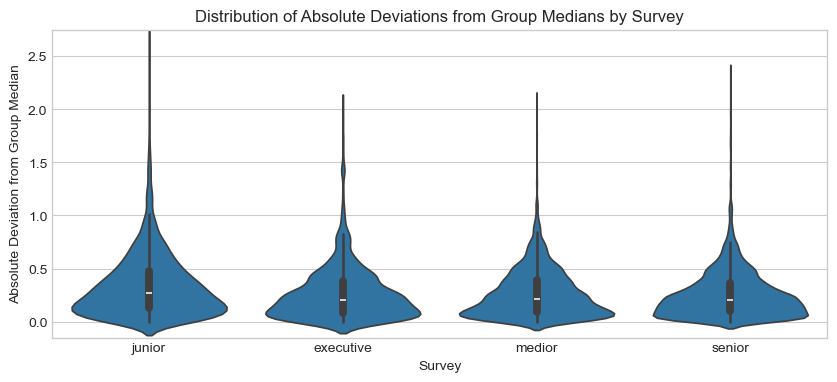

In [254]:
df_name = df_combined

# Step 1: Compute the group medians
df_name['group_median'] = df_name.groupby(['survey', 'job_category', 'seniority_level'], observed=True)['salary_norm_2024_log'].transform('median')

# Step 2: Calculate the absolute deviations from the group medians
df_name['abs_dev'] = np.abs(df_name['salary_norm_2024_log'] - df_name['group_median'])

# Violin plot by survey
plt.figure(figsize=(10, 4))
sns.violinplot(x='seniority_level', y='abs_dev', data=df_name, inner="box", density_norm='width')
plt.title('Distribution of Absolute Deviations from Group Medians by Survey')
plt.xlabel('Survey')
plt.ylabel('Absolute Deviation from Group Median')
plt.ylim(-0.15, 2.75)
plt.show()

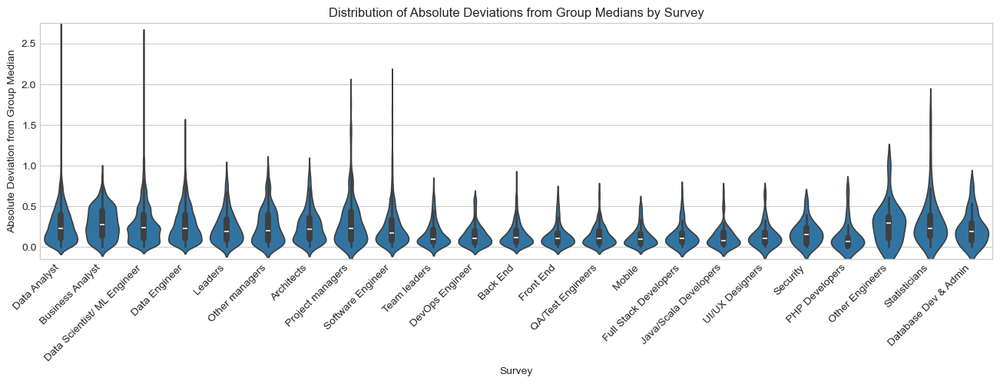

In [255]:
df_name = df_combined

# Step 1: Compute the group medians
df_name['group_median'] = df_name.groupby(['survey', 'job_category', 'seniority_level'], observed=True)['salary_norm_2024_log'].transform('median')

# Step 2: Calculate the absolute deviations from the group medians
df_name['abs_dev'] = np.abs(df_name['salary_norm_2024_log'] - df_name['group_median'])

# Violin plot by survey
plt.figure(figsize=(16, 4))
sns.violinplot(x='job_category', y='abs_dev', data=df_name, inner="box", density_norm='width')
plt.title('Distribution of Absolute Deviations from Group Medians by Survey')
plt.xlabel('Survey')
plt.ylabel('Absolute Deviation from Group Median')
plt.xticks(rotation=45, ha='right')
plt.ylim(-0.15, 2.75)
plt.show()

# Sensitivity Analysis

In [257]:
from statsmodels.stats.power import FTestAnovaPower
from scipy.stats.mstats import hmean

In [258]:
# df_combined = pd.concat([df_ai_w_l, df_it_w_l, df_k_w_l])
# df_k_data = df_k_w_l[df_k_w_l['job_category'].isin(data_fields)]
# df_it_data = df_it_w_l[df_it_w_l['job_category'].isin(data_fields)]
# df_ai_data = df_ai_w_l[df_ai_w_l['job_category'].isin(data_fields)]
# df_data_combined = pd.concat([df_k_data, df_it_data, df_ai_data])

In [259]:
# Set significance level and desired power
alpha = 0.05
power = 0.80

# List of categorical variables
categorical_vars = ['survey', 'seniority_level', 'job_category', 'year', 'country']

# Initialize the power analysis object
power_analysis = FTestAnovaPower()

# Perform sensitivity analysis for each categorical variable
for var in categorical_vars:
    # Number of groups for the variable
    k_groups = df_data_combined[var].nunique()
    
    # Group sizes
    group_sizes = df_data_combined[var].value_counts().values
    
    # Compute harmonic mean of group sizes to adjust for unequal group sizes
    n_per_group = hmean(group_sizes)
    
    # Adjusted total sample size
    nobs = n_per_group * k_groups
    
    # Calculate the smallest detectable effect size (Cohen's f)
    effect_size = power_analysis.solve_power(effect_size=None, nobs=nobs, alpha=alpha, power=power, k_groups=k_groups)
    
    # Transform Cohen's f to eta squared
    eta_squared = effect_size**2 / (effect_size**2 + 1)
    
    print(f"Variable: {var}")
    print(f"  Number of groups (levels): {k_groups}")
    print(f"  Harmonic mean of group sizes: {n_per_group:.2f}")
    print(f"  Adjusted total sample size (nobs): {nobs:.0f}")
    print(f"  Smallest detectable effect size (Cohen's f): {effect_size:.4f}")
    print(f"  Eta squared (partial): {eta_squared:.4f}\n")

Variable: survey
  Number of groups (levels): 3
  Harmonic mean of group sizes: 1629.28
  Adjusted total sample size (nobs): 4888
  Smallest detectable effect size (Cohen's f): 0.0444
  Eta squared (partial): 0.0020

Variable: seniority_level
  Number of groups (levels): 4
  Harmonic mean of group sizes: 2390.82
  Adjusted total sample size (nobs): 9563
  Smallest detectable effect size (Cohen's f): 0.0338
  Eta squared (partial): 0.0011

Variable: job_category
  Number of groups (levels): 3
  Harmonic mean of group sizes: 5207.16
  Adjusted total sample size (nobs): 15621
  Smallest detectable effect size (Cohen's f): 0.0248
  Eta squared (partial): 0.0006

Variable: year
  Number of groups (levels): 7
  Harmonic mean of group sizes: 265.74
  Adjusted total sample size (nobs): 1860
  Smallest detectable effect size (Cohen's f): 0.0857
  Eta squared (partial): 0.0073

Variable: country
  Number of groups (levels): 13
  Harmonic mean of group sizes: 34.36
  Adjusted total sample size (n

In [260]:
# Set significance level and desired power
alpha = 0.05
power = 0.80

# List of categorical variables
categorical_vars = ['survey', 'seniority_level', 'job_category', 'year', 'country']

# Initialize the power analysis object
power_analysis = FTestAnovaPower()

# Perform sensitivity analysis for each categorical variable
for var in categorical_vars:
    # Number of groups for the variable
    k_groups = df_combined[var].nunique()
    
    # Group sizes
    group_sizes = df_combined[var].value_counts().values
    
    # Compute harmonic mean of group sizes to adjust for unequal group sizes
    n_per_group = hmean(group_sizes)
    
    # Adjusted total sample size
    nobs = n_per_group * k_groups
    
    # Calculate the smallest detectable effect size (Cohen's f)
    effect_size = power_analysis.solve_power(effect_size=None, nobs=nobs, alpha=alpha, power=power, k_groups=k_groups)
    
    # Transform Cohen's f to eta squared
    eta_squared = effect_size**2 / (effect_size**2 + 1)
    
    print(f"Variable: {var}")
    print(f"  Number of groups (levels): {k_groups}")
    print(f"  Harmonic mean of group sizes: {n_per_group:.2f}")
    print(f"  Adjusted total sample size (nobs): {nobs:.0f}")
    print(f"  Smallest detectable effect size (Cohen's f): {effect_size:.4f}")
    print(f"  Eta squared (partial): {eta_squared:.4f}\n")

# Sensitivity analysis for the interaction term between 'job_category' and 'seniority_level'
# Create the interaction term
df_combined['interaction'] = df_combined['job_category'].astype(str) + ':' + df_combined['seniority_level'].astype(str)

# Number of groups for the interaction term
k_groups_interaction = df_combined['interaction'].nunique()

# Group sizes for the interaction term
group_sizes_interaction = df_combined['interaction'].value_counts().values

# Compute harmonic mean of group sizes for the interaction term
n_per_group_interaction = hmean(group_sizes_interaction)

# Adjusted total sample size for the interaction term
nobs_interaction = n_per_group_interaction * k_groups_interaction

# Calculate the smallest detectable effect size (Cohen's f) for the interaction term
effect_size_interaction = power_analysis.solve_power(
    effect_size=None,
    nobs=nobs_interaction,
    alpha=alpha,
    power=power,
    k_groups=k_groups_interaction
)

# Transform Cohen's f to eta squared
eta_squared_interaction = effect_size_interaction**2 / (effect_size_interaction**2 + 1)

print("Interaction Term: 'job_category' x 'seniority_level'")
print(f"  Number of groups (levels): {k_groups_interaction}")
print(f"  Harmonic mean of group sizes: {n_per_group_interaction:.2f}")
print(f"  Adjusted total sample size (nobs): {nobs_interaction:.0f}")
print(f"  Smallest detectable effect size (Cohen's f): {effect_size_interaction:.4f}")
print(f"  Eta squared (partial): {eta_squared_interaction:.4f}\n")

Variable: survey
  Number of groups (levels): 3
  Harmonic mean of group sizes: 7112.35
  Adjusted total sample size (nobs): 21337
  Smallest detectable effect size (Cohen's f): 0.0213
  Eta squared (partial): 0.0005

Variable: seniority_level
  Number of groups (levels): 4
  Harmonic mean of group sizes: 3984.68
  Adjusted total sample size (nobs): 15939
  Smallest detectable effect size (Cohen's f): 0.0262
  Eta squared (partial): 0.0007

Variable: job_category
  Number of groups (levels): 23
  Harmonic mean of group sizes: 86.01
  Adjusted total sample size (nobs): 1978
  Smallest detectable effect size (Cohen's f): 0.1053
  Eta squared (partial): 0.0110

Variable: year
  Number of groups (levels): 7
  Harmonic mean of group sizes: 2012.04
  Adjusted total sample size (nobs): 14084
  Smallest detectable effect size (Cohen's f): 0.0311
  Eta squared (partial): 0.0010

Variable: country
  Number of groups (levels): 13
  Harmonic mean of group sizes: 43.30
  Adjusted total sample size 

# VIF

P-Values:	Inflated Type I errors, false significance	Increased Type II errors, unstable significance\
Partial Eta-Squared:	Inflated for some factors, misleading effect sizes	Underestimated for true effects, arbitrary variance splitting \
Post-Hoc Power:	Overestimated power, false confidence in significance	Reduced power for true effects, misleading conclusions

In [263]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

## Without interaction

In [265]:
# Define the dataframe to be used
df_name = df_combined

# List of your categorical variables
categorical_vars = ['survey', 'seniority_level', 'job_category', 'year', 'country']

# Define the formula for the model
formula = 'salary_norm_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Get design matrices for VIF calculation
y, X = dmatrices(formula, data=df_name, return_type='dataframe')

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Feature"] = X.columns

vif.sort_values(by='VIF', ascending=False).head(50)

,VIF,Feature
0,764.31,Intercept
45,136.84,C(country)[T.us]
37,101.63,C(country)[T.de]
41,31.01,C(country)[T.gb]
36,20.46,C(country)[T.ca]
32,18.78,C(year)[T.2023]
33,14.14,C(year)[T.2024]
10,11.83,C(job_category)[T.Data Scientist/ ML Engineer]
40,11.70,C(country)[T.fr]
34,10.21,C(country)[T.au]


### Country

In [267]:
# Define the dataframe to be used
df_name = df_data_combined

# List of your categorical variables
categorical_vars = ['survey', 'seniority_level', 'job_category', 'year', 'country']

# Define the formula for the model, adding the interaction term
formula = 'salary_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Get design matrices for VIF calculation
y, X = dmatrices(formula, data=df_name, return_type='dataframe')

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Feature"] = X.columns

vif.sort_values(by='VIF', ascending=False).head(50)

,VIF,Feature
0,1137.80,Intercept
12,121.51,C(year)[T.2023]
25,100.80,C(country)[T.us]
13,92.69,C(year)[T.2024]
11,55.01,C(year)[T.2022]
8,48.37,C(year)[T.2019]
10,40.26,C(year)[T.2021]
17,35.37,C(country)[T.de]
9,35.04,C(year)[T.2020]
21,34.49,C(country)[T.gb]


## With Interaction

In [269]:
# Define the dataframe to be used
df_name = df_data_combined

# List of your categorical variables
categorical_vars = ['survey', 'seniority_level', 'job_category', 'year', 'country']

# Define the formula for the model, adding the interaction term
interaction_term = 'C(seniority_level):C(job_category)'
formula = 'salary_norm_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars]) + ' + ' + interaction_term

# Get design matrices for VIF calculation
y, X = dmatrices(formula, data=df_name, return_type='dataframe')

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Feature"] = X.columns

vif.sort_values(by='VIF', ascending=False).head(50)

,VIF,Feature
0,1318.40,Intercept
12,121.57,C(year)[T.2023]
25,100.90,C(country)[T.us]
13,92.74,C(year)[T.2024]
7,56.97,C(job_category)[T.Data Scientist/ ML Engineer]
31,56.73,C(seniority_level)[T.senior]:C(job_category)[T...
11,55.04,C(year)[T.2022]
5,52.97,C(seniority_level)[T.senior]
8,48.40,C(year)[T.2019]
6,46.92,C(job_category)[T.Data Engineer]


## IT

In [271]:
# Define the dataframe to be used
df_name = df_it_w_l

# List of your categorical variables
categorical_vars = ['seniority_level', 'job_category', 'year', 'language_category', 'city','company_size']

# Define the formula for the model
formula = 'salary_norm_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Get design matrices for VIF calculation
y, X = dmatrices(formula, data=df_name, return_type='dataframe')

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Feature"] = X.columns

vif.sort_values(by='VIF', ascending=False).head(50)

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1783: RuntimeWarning:

invalid value encountered in scalar divide



,VIF,Feature
0,953.52,Intercept
39,223.98,C(city)[T.berlin]
122,162.16,C(city)[T.munich]
77,28.66,C(city)[T.hamburg]
72,26.55,C(city)[T.frankfurt]
146,17.55,C(city)[T.stuttgart]
30,16.72,C(city)[T.amsterdam]
130,14.66,C(city)[T.other]
52,13.31,C(city)[T.cologne]
92,9.16,C(city)[T.karlsruhe]


Note: The warning "invalid value encountered in scalar divide" during VIF calculation
likely results from perfect multicollinearity or a lack of variance within certain categorical 
variables (e.g., constant values, sparse levels, or redundant categories). At this stage, 
we consider this warning to be informative and indicative of multicollinearity in the selected 
combination of variables.

## AI-jobs

In [274]:
# Define the dataframe to be used
df_name = df_ai_w_l

# List of your categorical variables
categorical_vars = ['seniority_level', 'job_category', 'year', 'country','company_size']

# Define the formula for the model
formula = 'salary_norm_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Get design matrices for VIF calculation
y, X = dmatrices(formula, data=df_name, return_type='dataframe')

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Feature"] = X.columns

vif.sort_values(by='VIF', ascending=False).head(50)

,VIF,Feature
0,1695.43,Intercept
26,111.02,C(country)[T.us]
13,91.78,C(year)[T.2023]
14,84.13,C(year)[T.2024]
22,58.48,C(country)[T.gb]
17,38.50,C(country)[T.ca]
12,33.19,C(year)[T.2022]
3,9.06,C(seniority_level)[T.senior]
18,8.82,C(country)[T.de]
7,8.37,C(job_category)[T.Data Scientist/ ML Engineer]


## Kaggle

In [276]:
# Define the dataframe to be used
df_name = df_k_w_l

# List of your categorical variables
categorical_vars = ['seniority_level', 'job_category', 'year', 'country','company_size','education_level']

# Define the formula for the model
formula = 'salary_norm_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Get design matrices for VIF calculation
y, X = dmatrices(formula, data=df_name, return_type='dataframe')

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Feature"] = X.columns

vif.sort_values(by='VIF', ascending=False).head(50)

,VIF,Feature
0,257.70,Intercept
24,55.91,C(country)[T.us]
20,21.14,C(country)[T.gb]
17,17.60,C(country)[T.de]
16,14.21,C(country)[T.ca]
19,12.94,C(country)[T.fr]
14,11.47,C(country)[T.au]
21,7.95,C(country)[T.nl]
23,3.52,C(country)[T.se]
15,3.37,C(country)[T.be]


# ANOVA

In [278]:
import statsmodels.api as sm
from statsmodels.api import OLS, add_constant
import statsmodels.stats.api as sms
from statsmodels.stats.api import het_breuschpagan
from scipy.stats import shapiro
from scipy.stats import levene
from scipy.stats import cramervonmises, kurtosis, skew

## Pooled approach

In [280]:
# 1-Way ANOVA

# Define a function to perform ANOVA for each factorial group
def anova_for_factorial_groups(df):
    # Get unique factorial groups
    factorial_groups = df.groupby(['job_category', 'seniority_level'],observed=True).size().reset_index(name='count')
    
    results = []
    
    for _, group in factorial_groups.iterrows():
        job_category = group['job_category']
        seniority_level = group['seniority_level']
        
        # Filter data for the current factorial group
        subset_df = df[
            (df['job_category'] == job_category) &
            (df['seniority_level'] == seniority_level)
        ]
        
        # Check if there are at least 2 surveys with data in this group
        if subset_df['survey'].nunique() < 2:
            continue
        
        # Prepare data for ANOVA
        anova_data = [subset_df[subset_df['survey'] == survey]['salary_norm_2024_log'] for survey in subset_df['survey'].unique()]
        
        # Perform ANOVA
        f_stat, p_value = stats.f_oneway(*anova_data)
        
        # Determine significance for various levels
        significance_0_10 = '*' if p_value < 0.10 else ''
        significance_0_05 = '*' if p_value < 0.05 else ''
        significance_0_01 = '*' if p_value < 0.01 else ''
        
        # Collect results
        results.append({
            'job_category': job_category,
            'seniority_level': seniority_level,
            'F_statistic': f_stat,
            'p_value': p_value,
            'Significance@ p<0.10': significance_0_10,
            'Significance@ p<0.05': significance_0_05,
            'Significance@ p<0.01': significance_0_01,
        })
    
    return pd.DataFrame(results)

# Run ANOVA for each factorial group
anova_results = anova_for_factorial_groups(df_combined)

# Output results
print('ANOVA results:')
print('Null Hypothesis was that there is no significant difference between the distributions of the different surveys. In other words, it assumes that combining the surveys is reasonable because the distributions are the same.')
print('Sginificance@ different p-levels means that we can reject the Null Hypothsis. This indicates that there is significant evidence suggesting that the salary distributions differ between surveys, and thus combining the surveys may not be reasonable.')
anova_results

# Optionally, save results to a CSV file
#anova_results.to_csv('anova_results.csv', index=False)

ANOVA results:
Null Hypothesis was that there is no significant difference between the distributions of the different surveys. In other words, it assumes that combining the surveys is reasonable because the distributions are the same.
Sginificance@ different p-levels means that we can reject the Null Hypothsis. This indicates that there is significant evidence suggesting that the salary distributions differ between surveys, and thus combining the surveys may not be reasonable.


,job_category,seniority_level,F_statistic,p_value,Significance@ p<0.10,Significance@ p<0.05,Significance@ p<0.01
0,Architects,senior,13.89,0.00,*,*,*
1,Data Analyst,executive,0.69,0.41,,,
2,Data Analyst,junior,1.20,0.27,,,
3,Data Analyst,medior,6.15,0.00,*,*,*
4,Data Analyst,senior,14.18,0.00,*,*,*
5,Data Engineer,executive,1.67,0.20,,,
6,Data Engineer,junior,2.60,0.11,,,
7,Data Engineer,medior,1.68,0.19,,,
8,Data Engineer,senior,0.62,0.54,,,
9,Data Scientist/ ML Engineer,executive,2.88,0.06,*,,


## Pairwise approach

In [282]:
# Define a function to perform ANOVA for each factorial group with Bonferroni correction
def analyze_factorial_groups_pairwise_anova(df1, df2, df1_name, df2_name):
    # Combine the two dataframes
    #df_combined = pd.concat([df1, df2])
    df_combined = pd.concat([df.dropna(axis=1, how='all') for df in [df1, df2]])
    
    # Get unique factorial groups
    factorial_groups = df_combined.groupby(['job_category', 'seniority_level'], observed=True).size().reset_index(name='count')
    
    results = []
    significant_groups = 0
    total_tests = len(factorial_groups)  # Total number of comparisons
    
    # Bonferroni corrected alpha level
    alpha = 0.05
    corrected_alpha = alpha / total_tests if total_tests > 0 else np.nan
    
    for _, group in factorial_groups.iterrows():
        job_category = group['job_category']
        seniority_level = group['seniority_level']
        
        # Filter data for the current factorial group
        subset_df1 = df1[
            (df1['job_category'] == job_category) &
            (df1['seniority_level'] == seniority_level)
        ]
        
        subset_df2 = df2[
            (df2['job_category'] == job_category) &
            (df2['seniority_level'] == seniority_level)
        ]
        
        # Check if both surveys have data in this group
        if subset_df1.empty or subset_df2.empty:
            continue
        
        # Prepare data for ANOVA
        survey_groups = [subset_df1['salary_norm_2024_log'], subset_df2['salary_norm_2024_log']]
        
        # ANOVA test for difference in means
        stat, p_value_anova = stats.f_oneway(*survey_groups)
        
        # Apply Bonferroni correction
        is_significant = p_value_anova < corrected_alpha
        if is_significant:
            significant_groups += 1
        
        # Collect results
        results.append({
            'job_category': job_category,
            'seniority_level': seniority_level,
            'ANOVA_p_value': p_value_anova,
            'Corrected_Alpha': corrected_alpha,
            'Is_Significant': is_significant
        })
    
    # Calculate percentage of significant groups
    total_groups = len(results)
    significant_percentage = (significant_groups / total_groups) * 100 if total_groups > 0 else np.nan
    
    return pd.DataFrame(results), significant_percentage

# Run the analysis for each pair of dataframes
results_k_ai_anova, percentage_k_ai_anova = analyze_factorial_groups_pairwise_anova(df_k_w_l, df_ai_w_l, 'df_k', 'df_ai')
results_k_it_anova, percentage_k_it_anova = analyze_factorial_groups_pairwise_anova(df_k_w_l, df_it_w_l, 'df_k', 'df_it')
results_ai_it_anova, percentage_ai_it_anova = analyze_factorial_groups_pairwise_anova(df_ai_w_l, df_it_w_l, 'df_ai', 'df_it')

# Print the percentage of significant groups for each pair
print(f'Percentage of significant groups (df_k vs. df_ai): {percentage_k_ai_anova:.2f}%')
print(f'Percentage of significant groups (df_k vs. df_it): {percentage_k_it_anova:.2f}%')
print(f'Percentage of significant groups (df_ai vs. df_it): {percentage_ai_it_anova:.2f}%')

Percentage of significant groups (df_k vs. df_ai): 23.08%
Percentage of significant groups (df_k vs. df_it): 26.67%
Percentage of significant groups (df_ai vs. df_it): 28.57%


### Welch's ANOVA

In [284]:
# Define a function to perform Welch's ANOVA for each factorial group with Bonferroni correction
def analyze_factorial_groups_pairwise_welch_anova(df1, df2, df1_name, df2_name):
    # Combine the two dataframes
    #df_combined = pd.concat([df1, df2])
    df_combined = pd.concat([df.dropna(axis=1, how='all') for df in [df1, df2]])
    
    # Get unique factorial groups
    factorial_groups = df_combined.groupby(['job_category', 'seniority_level'], observed=True).size().reset_index(name='count')
    
    results = []
    significant_groups = 0
    total_tests = len(factorial_groups)  # Total number of comparisons
    
    # Bonferroni corrected alpha level
    alpha = 0.05
    corrected_alpha = alpha / total_tests if total_tests > 0 else np.nan
    
    for _, group in factorial_groups.iterrows():
        job_category = group['job_category']
        seniority_level = group['seniority_level']
        
        # Filter data for the current factorial group
        subset_df1 = df1[
            (df1['job_category'] == job_category) &
            (df1['seniority_level'] == seniority_level)
        ]
        
        subset_df2 = df2[
            (df2['job_category'] == job_category) &
            (df2['seniority_level'] == seniority_level)
        ]
        
        # Check if both surveys have data in this group
        if subset_df1.empty or subset_df2.empty:
            continue
        
        # Prepare data for Welch's ANOVA
        survey_groups = [subset_df1['salary_norm_2024_log'], subset_df2['salary_norm_2024_log']]
        
        # Welch's ANOVA test for difference in means
        stat, p_value_welch_anova = stats.ttest_ind(subset_df1['salary_norm_2024_log'], subset_df2['salary_norm_2024_log'], equal_var=False)
        
        # Apply Bonferroni correction
        is_significant = p_value_welch_anova < corrected_alpha
        if is_significant:
            significant_groups += 1
        
        # Collect results
        results.append({
            'job_category': job_category,
            'seniority_level': seniority_level,
            'Welch_ANOVA_p_value': p_value_welch_anova,
            'Corrected_Alpha': corrected_alpha,
            'Is_Significant': is_significant
        })
    
    # Calculate percentage of significant groups
    total_groups = len(results)
    significant_percentage = (significant_groups / total_groups) * 100 if total_groups > 0 else np.nan
    
    return pd.DataFrame(results), significant_percentage

# Run the analysis for each pair of dataframes
results_k_ai_welch, percentage_k_ai_welch = analyze_factorial_groups_pairwise_welch_anova(df_k_w_l, df_ai_w_l, 'df_k', 'df_ai')
results_k_it_welch, percentage_k_it_welch = analyze_factorial_groups_pairwise_welch_anova(df_k_w_l, df_it_w_l, 'df_k', 'df_it')
results_ai_it_welch, percentage_ai_it_welch = analyze_factorial_groups_pairwise_welch_anova(df_ai_w_l, df_it_w_l, 'df_ai', 'df_it')

# Print the percentage of significant groups for each pair
print(f'Percentage of significant groups (df_k vs. df_ai): {percentage_k_ai_welch:.2f}%')
print(f'Percentage of significant groups (df_k vs. df_it): {percentage_k_it_welch:.2f}%')
print(f'Percentage of significant groups (df_ai vs. df_it): {percentage_ai_it_welch:.2f}%')

Percentage of significant groups (df_k vs. df_ai): 23.08%
Percentage of significant groups (df_k vs. df_it): 33.33%
Percentage of significant groups (df_ai vs. df_it): 35.71%


### Kruskal-Wallis

In [286]:
# Define a function to perform Kruskal-Wallis test for each factorial group with Bonferroni correction
def analyze_factorial_groups_pairwise_kruskal_wallis(df1, df2, df1_name, df2_name):
    # Combine the two dataframes
    #df_combined = pd.concat([df1, df2])
    df_combined = pd.concat([df.dropna(axis=1, how='all') for df in [df1, df2]])
    
    # Get unique factorial groups
    factorial_groups = df_combined.groupby(['job_category', 'seniority_level'], observed=True).size().reset_index(name='count')
    
    results = []
    significant_groups = 0
    total_tests = len(factorial_groups)  # Total number of comparisons
    
    # Bonferroni corrected alpha level
    alpha = 0.05
    corrected_alpha = alpha / total_tests if total_tests > 0 else np.nan
    
    for _, group in factorial_groups.iterrows():
        job_category = group['job_category']
        seniority_level = group['seniority_level']
        
        # Filter data for the current factorial group
        subset_df1 = df1[
            (df1['job_category'] == job_category) &
            (df1['seniority_level'] == seniority_level)
        ]
        
        subset_df2 = df2[
            (df2['job_category'] == job_category) &
            (df2['seniority_level'] == seniority_level)
        ]
        
        # Check if both surveys have data in this group
        if subset_df1.empty or subset_df2.empty:
            continue
        
        # Prepare data for Kruskal-Wallis test
        survey_groups = [subset_df1['salary_norm_2024_log'], subset_df2['salary_norm_2024_log']]
        
        # Kruskal-Wallis test for difference in distributions
        stat, p_value_kruskal_wallis = stats.kruskal(*survey_groups)
        
        # Apply Bonferroni correction
        is_significant = p_value_kruskal_wallis < corrected_alpha
        if is_significant:
            significant_groups += 1
        
        # Collect results
        results.append({
            'job_category': job_category,
            'seniority_level': seniority_level,
            'Kruskal_Wallis_p_value': p_value_kruskal_wallis,
            'Corrected_Alpha': corrected_alpha,
            'Is_Significant': is_significant
        })
    
    # Calculate percentage of significant groups
    total_groups = len(results)
    significant_percentage = (significant_groups / total_groups) * 100 if total_groups > 0 else np.nan
    
    return pd.DataFrame(results), significant_percentage

# Run the analysis for each pair of dataframes
results_k_ai_kruskal, percentage_k_ai_kruskal = analyze_factorial_groups_pairwise_kruskal_wallis(df_k_w_l, df_ai_w_l, 'df_k', 'df_ai')
results_k_it_kruskal, percentage_k_it_kruskal = analyze_factorial_groups_pairwise_kruskal_wallis(df_k_w_l, df_it_w_l, 'df_k', 'df_it')
results_ai_it_kruskal, percentage_ai_it_kruskal = analyze_factorial_groups_pairwise_kruskal_wallis(df_ai_w_l, df_it_w_l, 'df_ai', 'df_it')

# Print the percentage of significant groups for each pair
print(f'Percentage of significant groups (df_k vs. df_ai): {percentage_k_ai_kruskal:.2f}%')
print(f'Percentage of significant groups (df_k vs. df_it): {percentage_k_it_kruskal:.2f}%')
print(f'Percentage of significant groups (df_ai vs. df_it): {percentage_ai_it_kruskal:.2f}%')

Percentage of significant groups (df_k vs. df_ai): 23.08%
Percentage of significant groups (df_k vs. df_it): 46.67%
Percentage of significant groups (df_ai vs. df_it): 35.71%


## Multi-way approach

In [288]:
pd.set_option('display.float_format', lambda x: '%.4f' % x)

In [289]:
#df_combined = pd.concat([df_ai_w_l, df_k_w_l, df_it_w_l], ignore_index=True)

In [290]:
df_name = df_data

# List of your categorical variables
categorical_vars = ['survey', 'seniority_level', 'job_category', 'year', 'country']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_name[var] = df_name[var].astype('category')

# Define the formula for the model
formula = 'salary_norm_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Fit the model
model = ols(formula, data=df_name).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Display the results
anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq']]

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq
C(survey),3.9257,2.0000,14.6256,0.0000,0.0045,0.0015
C(seniority_level),556.9928,3.0000,1383.4363,0.0000,0.6383,0.1757
C(job_category),258.3640,2.0000,962.5713,0.0000,0.2961,0.0900
C(year),5.7562,6.0000,7.1485,0.0000,0.0066,0.0022
C(country),38.9874,12.0000,24.2088,0.0000,0.0447,0.0147


In [291]:
# Function to calculate Cohen's f from partial eta-squared
def cohen_f_from_partial_eta_squared(eta_squared):
    if eta_squared >= 1 or eta_squared < 0:
        raise ValueError(f"Invalid eta-squared value: {eta_squared}. It must be between 0 and 1.")
    return np.sqrt(eta_squared / (1 - eta_squared))

# Function to extract variable name from 'C(variable_name)'
def extract_variable_name(var):
    if var.startswith('C(') and var.endswith(')'):
        return var[2:-1]
    else:
        return var


# Initialize a dictionary to store power values
power_results = {}

# Total sample size
nobs = df_combined.shape[0]

# Set alpha level (commonly 0.05)
alpha = 0.01

for var in variables:
    # Get the actual variable name without 'C()'
    var_name = extract_variable_name(var)
    # Get partial eta squared
    partial_eta_sq_var = anova_results.loc[var, 'Partial_eta_sq']
    # Compute Cohen's f
    effect_size = cohen_f_from_partial_eta_squared(partial_eta_sq_var)
    # Number of groups (levels) in the variable
    k_groups = df_combined[var_name].nunique()
    # Calculate the effective sample size for this variable
    # Sum of observations across levels of the factor
    nobs_var = df_combined.groupby(var_name, observed=True).size().sum()
    # Alternatively, use the harmonic mean of group sizes
    group_sizes = df_combined.groupby(var_name, observed=True).size().values
    nobs_var = len(group_sizes) * (len(group_sizes) / np.sum(1 / group_sizes))
    # Compute power
    power_analysis = FTestAnovaPower()
    power = power_analysis.power(effect_size=effect_size, nobs=nobs_var, alpha=alpha, k_groups=k_groups)
    # Store the power value
    power_results[var] = power

# Add power values to the anova_results DataFrame
anova_results['Power'] = pd.Series(power_results)

# Display the updated ANOVA results with power
display(anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq', 'Power']])

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Power
C(survey),3.9257,2.0000,14.6256,0.0000,0.0045,0.0015,0.9970
C(seniority_level),556.9928,3.0000,1383.4363,0.0000,0.6383,0.1757,1.0000
C(job_category),258.3640,2.0000,962.5713,0.0000,0.2961,0.0900,1.0000
C(year),5.7562,6.0000,7.1485,0.0000,0.0066,0.0022,0.9769
C(country),38.9874,12.0000,24.2088,0.0000,0.0447,0.0147,0.1991


In [292]:
# Define the dataframe to be used
df_name = df_combined  # You can update df_combined to any other dataframe as needed

# List of your categorical variables
categorical_vars = ['survey', 'seniority_level', 'job_category', 'year', 'country']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_name[var] = df_name[var].astype('category')

# Define the formula for the model
formula = 'salary_norm_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Fit the model
model = ols(formula, data=df_name).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Function to calculate Cohen's f from partial eta-squared
def cohen_f_from_partial_eta_squared(eta_squared):
    if eta_squared >= 1 or eta_squared < 0:
        raise ValueError(f"Invalid eta-squared value: {eta_squared}. It must be between 0 and 1.")
    return np.sqrt(eta_squared / (1 - eta_squared))

# Initialize a dictionary to store power values
power_results = {}

# Total sample size
nobs = df_name.shape[0]

# Set alpha level (commonly 0.05)
alpha = 0.05

for var, actual_var in zip(variables, categorical_vars):
    # Get partial eta squared
    partial_eta_sq_var = anova_results.loc[var, 'Partial_eta_sq']
    # Compute Cohen's f
    effect_size = cohen_f_from_partial_eta_squared(partial_eta_sq_var)
    # Number of groups (levels) in the actual variable
    k_groups = df_name[actual_var].nunique()
    # Calculate the effective sample size for this variable
    # Sum of observations across levels of the factor
    nobs_var = df_name.groupby(actual_var, observed=True).size().sum()
    # Alternatively, use the harmonic mean of group sizes
    group_sizes = df_name.groupby(actual_var, observed=True).size().values
    nobs_var = len(group_sizes) * (len(group_sizes) / np.sum(1 / group_sizes))
    # Compute power
    power_analysis = FTestAnovaPower()
    power = power_analysis.power(effect_size=effect_size, nobs=nobs_var, alpha=alpha, k_groups=k_groups)
    # Store the power value
    power_results[var] = power

# Add power values to the anova_results DataFrame
anova_results['Power'] = pd.Series(power_results)

# Display the updated ANOVA results with power
display(anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq', 'Power']])

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Power
C(survey),6.1994,2.0000,24.4048,0.0000,0.0055,0.0018,1.0000
C(seniority_level),709.5094,3.0000,1862.0672,0.0000,0.6304,0.1720,1.0000
C(job_category),330.9564,22.0000,118.4422,0.0000,0.2941,0.0883,1.0000
C(year),9.7369,6.0000,12.7769,0.0000,0.0087,0.0028,0.9995
C(country),43.7215,12.0000,28.6861,0.0000,0.0388,0.0126,0.3524


In [293]:
# List of your categorical variables
categorical_vars = ['survey', 'seniority_level', 'job_category', 'year', 'country']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_combined[var] = df_combined[var].astype('category')

# Define the formula for the model
formula = 'salary_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Fit the model
model = ols(formula, data=df_combined).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Display the results
anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq']]

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq
C(survey),6.1994,2.0000,24.4048,0.0000,0.0010,0.0018
C(seniority_level),709.5094,3.0000,1862.0672,0.0000,0.1120,0.1720
C(job_category),330.9564,22.0000,118.4422,0.0000,0.0522,0.0883
C(year),26.8971,6.0000,35.2949,0.0000,0.0042,0.0078
C(country),596.2847,12.0000,391.2288,0.0000,0.0941,0.1486


### With other normalizations

In [295]:
df_combined.head(1)

,seniority_level,level_1,year,employment_status,job_title,salary_in_currency,salary_currency,salary,country,remote_ratio,company_location,company_size,ratio,survey,company_size_category,country_code,median_income_2020_usd,mean_income_2020_usd,gdp_ppp_usd,glassdoor_software_engineer_usd,salary_normmed,salary_normmean,salary_normgdp,salary_normse,salary_norm,salary_2024,salary_norm_2024,salary_normmed_2024,salary_normmean_2024,salary_normgdp_2024,salary_normse_2024,job_category,salary_log,salary_2024_log,salary_norm_log,salary_norm_2024_log,salary_normmed_2024_log,salary_normmean_2024_log,salary_normgdp_2024_log,salary_normse_2024_log,z_score,modif_z_score,modif_z_score_signed,age,city,language_at_work,company_type,experience,skills,skills_2,years_of_experience_in_germany,skills_3,company_industry,city_category,language_category,industry_category,education_level,job_title_2,salary_range,lower_salary,upper_salary,industry,are_you_student,group_median,abs_dev,interaction
0,junior,5.0000,2024,ft,data analyst,102927.0000,usd,102927.0000,au,0.0000,au,m,1.0000,ai,m,au,17076,21329,69115,81659.0000,6.0276,4.8257,1.4892,1.2604,1.5811,102927.0000,1.5811,6.0276,4.8257,1.4892,1.2604,Data Analyst,11.5418,11.5418,0.4581,0.4581,1.7963,1.5740,0.3982,0.2315,0.3630,0.5390,0.5390,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.1143,0.3438,Data Analyst:junior


In [296]:
# List of your categorical variables
categorical_vars = ['survey', 'seniority_level', 'job_category', 'year', 'country']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_combined[var] = df_combined[var].astype('category')

# Define the formula for the model
formula = 'salary_normse_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Fit the model
model = ols(formula, data=df_combined).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Display the results
anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq']]

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq
C(survey),6.1994,2.0000,24.4048,0.0000,0.0039,0.0018
C(seniority_level),709.5094,3.0000,1862.0672,0.0000,0.4428,0.1720
C(job_category),330.9564,22.0000,118.4422,0.0000,0.2066,0.0883
C(year),9.7369,6.0000,12.7769,0.0000,0.0061,0.0028
C(country),535.6240,12.0000,351.4287,0.0000,0.3343,0.1355


### Try: 20:23 with interaction

In [298]:
# Define the dataframe to be used
df_name = df_combined

# List of your categorical variables
categorical_vars = ['survey', 'seniority_level', 'job_category', 'year', 'country']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_name[var] = df_name[var].astype('category')

# Define the formula for the model, adding the interaction term
interaction_term = 'C(seniority_level):C(job_category)'
formula = 'salary_norm_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars]) + ' + ' + interaction_term

# Fit the model
model = ols(formula, data=df_name).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Function to calculate Cohen's f from partial eta-squared
def cohen_f_from_partial_eta_squared(eta_squared):
    if eta_squared >= 1 or eta_squared < 0:
        raise ValueError(f"Invalid eta-squared value: {eta_squared}. It must be between 0 and 1.")
    return np.sqrt(eta_squared / (1 - eta_squared))

# Initialize a dictionary to store power values
power_results = {}

# Total sample size
nobs = df_name.shape[0]

# Set alpha level (commonly 0.05)
alpha = 0.05

for var, actual_var in zip(variables, categorical_vars + [interaction_term]):
    # Get partial eta squared
    partial_eta_sq_var = anova_results.loc[var, 'Partial_eta_sq']
    # Compute Cohen's f
    effect_size = cohen_f_from_partial_eta_squared(partial_eta_sq_var)
    # Number of groups (levels) in the actual variable
    if var == interaction_term:
        k_groups = df_name.groupby(['job_category', 'seniority_level'], observed=True).ngroups
        group_sizes = df_name.groupby(['job_category', 'seniority_level'], observed=True).size().values
    else:
        k_groups = df_name[actual_var].nunique()
        group_sizes = df_name.groupby(actual_var, observed=True).size().values
    # Calculate the effective sample size for this variable
    nobs_var = len(group_sizes) * (len(group_sizes) / np.sum(1 / group_sizes))
    # Compute power
    power_analysis = FTestAnovaPower()
    power = power_analysis.power(effect_size=effect_size, nobs=nobs_var, alpha=alpha, k_groups=k_groups)
    # Store the power value
    power_results[var] = power

# Add power values to the anova_results DataFrame
anova_results['Power'] = pd.Series(power_results)

# Display the updated ANOVA results with power
display(anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq', 'Power']]);

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 66, but rank is 46



,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Power
C(survey),6.1429,2.0000,24.2905,0.0000,0.0069,0.0018,0.9999
C(seniority_level),99.5606,3.0000,262.4568,0.0000,0.1114,0.0285,1.0000
C(job_category),30.8830,22.0000,11.1017,0.0000,0.0345,0.0090,0.6889
C(year),9.9185,6.0000,13.0733,0.0000,0.0111,0.0029,0.9996
C(country),42.7563,12.0000,28.1780,0.0000,0.0478,0.0124,0.3463
C(seniority_level):C(job_category),686.0893,66.0000,82.2107,0.0000,0.7673,0.1680,1.0000


Note: "covariance of constraints does not have full rank. The number of constraints is ..."
This warning suggests that there is multicollinearity or redundancy among the independent variables in the model,
leading to a rank deficiency in the covariance matrix. As a result, some independent variables may not have 
distinct or interpretable effects on the dependent variable, which can impact the reliability of the ANOVA results.

In [300]:
# Get design matrices for VIF calculation
y, X = dmatrices(formula, data=df_name, return_type='dataframe')

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Feature"] = X.columns

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning:

divide by zero encountered in scalar divide

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1783: RuntimeWarning:

invalid value encountered in scalar divide



Note: The warning "invalid value encountered in scalar divide" during VIF calculation
likely results from perfect multicollinearity or a lack of variance within certain categorical 
variables (e.g., constant values, sparse levels, or redundant categories). At this stage, 
we consider this warning to be informative and indicative of multicollinearity in the selected 
combination of variables. This will be revisited with alternative combinations later in the project.

In [302]:
vif.sort_values(by='VIF', ascending=False).head(50)

,VIF,Feature
46,inf,C(seniority_level)[T.junior]:C(job_category)[T...
22,inf,C(job_category)[T.QA/Test Engineers]
27,inf,C(job_category)[T.UI/UX Designers]
49,inf,C(seniority_level)[T.junior]:C(job_category)[T...
52,inf,C(seniority_level)[T.junior]:C(job_category)[T...
55,inf,C(seniority_level)[T.junior]:C(job_category)[T...
58,inf,C(seniority_level)[T.junior]:C(job_category)[T...
67,inf,C(seniority_level)[T.junior]:C(job_category)[T...
71,inf,C(seniority_level)[T.medior]:C(job_category)[T...
72,inf,C(seniority_level)[T.senior]:C(job_category)[T...


In [303]:
pd.crosstab(df_name['seniority_level'], df_name['job_category'])

job_category,Architects,Back End,Business Analyst,Data Analyst,Data Engineer,Data Scientist/ ML Engineer,Database Dev & Admin,DevOps Engineer,Front End,Full Stack Developers,Java/Scala Developers,Leaders,Mobile,Other Engineers,Other managers,PHP Developers,Project managers,QA/Test Engineers,Security,Software Engineer,Statisticians,Team leaders,UI/UX Designers
seniority_level,,,,,,,,,,,,,,,,,,,,,,,
executive,45,46,24,94,234,765,26,31,20,0,0,224,0,0,96,0,204,0,0,397,43,163,0
junior,0,22,59,1082,204,894,0,0,26,0,0,0,0,20,0,0,171,0,0,249,0,0,0
medior,34,174,136,1128,1002,2573,0,58,108,21,24,26,58,0,223,0,170,110,0,462,25,0,0
senior,520,405,344,1992,2487,7041,25,145,170,65,53,126,134,0,259,20,364,163,21,1032,58,22,29


In [304]:
df_name.groupby(['seniority_level', 'job_category'], observed=True).size()

seniority_level  job_category               
executive        Architects                       45
                 Back End                         46
                 Business Analyst                 24
                 Data Analyst                     94
                 Data Engineer                   234
                 Data Scientist/ ML Engineer     765
                 Database Dev & Admin             26
                 DevOps Engineer                  31
                 Front End                        20
                 Leaders                         224
                 Other managers                   96
                 Project managers                204
                 Software Engineer               397
                 Statisticians                    43
                 Team leaders                    163
junior           Back End                         22
                 Business Analyst                 59
                 Data Analyst                   1082
 

In [305]:
df_name.groupby('job_category', observed=True).size()

job_category
Architects                       599
Back End                         647
Business Analyst                 563
Data Analyst                    4296
Data Engineer                   3927
Data Scientist/ ML Engineer    11273
Database Dev & Admin              51
DevOps Engineer                  234
Front End                        324
Full Stack Developers             86
Java/Scala Developers             77
Leaders                          376
Mobile                           192
Other Engineers                   20
Other managers                   578
PHP Developers                    20
Project managers                 909
QA/Test Engineers                273
Security                          21
Software Engineer               2140
Statisticians                    126
Team leaders                     185
UI/UX Designers                   29
dtype: int64

In [306]:
# Given total standard deviation from the dependent variable in USD
total_std_dev = df_name['salary_2024'].std()

# Calculate the standard deviation explained by each variable
anova_results['Std_Dev_Explained'] = anova_results['Partial_eta_sq'] * total_std_dev

print(f"Total standard deviation of salaries: {total_std_dev:.0f} USD")
print(f"Total explained standard deviation of salaries: {anova_results['Std_Dev_Explained'].sum():.0f} USD")

# Display the updated ANOVA results
display(anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq', 'Std_Dev_Explained', 'Power']])

Total standard deviation of salaries: 79833 USD
Total explained standard deviation of salaries: 17777 USD


,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Std_Dev_Explained,Power
C(survey),6.1429,2.0000,24.2905,0.0000,0.0069,0.0018,144.1153,0.9999
C(seniority_level),99.5606,3.0000,262.4568,0.0000,0.1114,0.0285,2273.3166,1.0000
C(job_category),30.8830,22.0000,11.1017,0.0000,0.0345,0.0090,719.2970,0.6889
C(year),9.9185,6.0000,13.0733,0.0000,0.0111,0.0029,232.4334,0.9996
C(country),42.7563,12.0000,28.1780,0.0000,0.0478,0.0124,992.3991,0.3463
C(seniority_level):C(job_category),686.0893,66.0000,82.2107,0.0000,0.7673,0.1680,13415.3097,1.0000


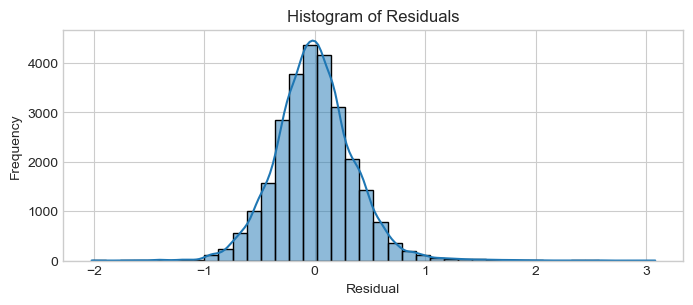

In [307]:
# Extract residuals from the fitted model
residuals = model.resid

# Plot histogram of residuals
plt.figure(figsize=(8, 3))
sns.histplot(residuals, kde=True, bins=40)
plt.title('Histogram of Residuals')
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.show()

<Figure size 800x300 with 0 Axes>

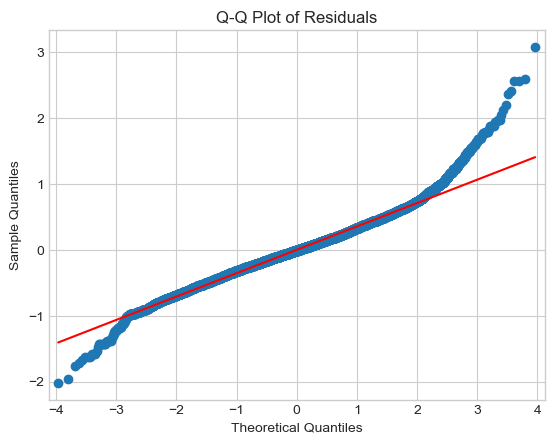

In [308]:
# Import necessary libraries
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Extract residuals from the fitted model
residuals = model.resid

# Create a Q-Q plot
plt.figure(figsize=(8, 3))
fig = sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

In [309]:
# Extract residuals from the fitted model
residuals = model.resid

# Perform the Shapiro-Wilk test
shapiro_stat, shapiro_p_value = stats.shapiro(residuals)

# Create a DataFrame to display the results
normality_results = pd.DataFrame({
    'Test Statistic': [shapiro_stat],
    'p-value': [shapiro_p_value]
})


# Determine significance for various levels and add as new columns
normality_results['Significance@ p<0.10'] = ['*' if shapiro_p_value < 0.10 else '']
normality_results['Significance@ p<0.05'] = ['*' if shapiro_p_value < 0.05 else '']
normality_results['Significance@ p<0.01'] = ['*' if shapiro_p_value < 0.01 else '']

# Display the results
display(normality_results)

C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 26946.



,Test Statistic,p-value,Significance@ p<0.10,Significance@ p<0.05,Significance@ p<0.01
0,0.9810,0.0000,*,*,*


Note: "scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate..."
This warning indicates that the Shapiro-Wilk test for normality may not yield an accurate p-value due to a large sample size.
The Shapiro-Wilk test is generally recommended for smaller samples, and with larger samples, even minor deviations from normality can appear significant.

In [311]:
# Take a random sample of 5000 residuals
sample_residuals = residuals.sample(300, random_state=42)

# Run Shapiro-Wilk test on the subsample
shapiro_stat, shapiro_p_value = stats.shapiro(sample_residuals)

# Display sample test results
normality_results = pd.DataFrame({
    'Test Statistic': [shapiro_stat],
    'p-value': [shapiro_p_value],
    'Significance@ p<0.10': ['*' if shapiro_p_value < 0.10 else ''],
    'Significance@ p<0.05': ['*' if shapiro_p_value < 0.05 else ''],
    'Significance@ p<0.01': ['*' if shapiro_p_value < 0.01 else '']
})
display(normality_results)

,Test Statistic,p-value,Significance@ p<0.10,Significance@ p<0.05,Significance@ p<0.01
0,0.9071,0.0000,*,*,*


In [312]:
# Perform the Anderson-Darling test for normality
anderson_result = stats.anderson(residuals, dist='norm')

# Extract significance level results
ad_statistic = anderson_result.statistic
critical_values = anderson_result.critical_values
significance_levels = anderson_result.significance_level

# Display results
normality_results = pd.DataFrame({
    'Test Statistic (A-D)': [ad_statistic],
    'Significance Levels': [f'{significance_levels}'],
    'Critical Values': [f'{critical_values}'],
})
normality_results

,Test Statistic (A-D),Significance Levels,Critical Values
0,59.1370,[15. 10. 5. 2.5 1. ],[0.576 0.656 0.787 0.918 1.092]


In [313]:
# Perform the Cramér-von Mises test
cvm_result = cramervonmises(residuals, 'norm')

# Create a DataFrame with results
normality_results = pd.DataFrame({
    'Test Statistic (CVM)': [cvm_result.statistic],
    'p-value': [cvm_result.pvalue],
    'Significance@ p<0.10': ['*' if cvm_result.pvalue < 0.10 else ''],
    'Significance@ p<0.05': ['*' if cvm_result.pvalue < 0.05 else ''],
    'Significance@ p<0.01': ['*' if cvm_result.pvalue < 0.01 else '']
})

# Display the results
normality_results

,Test Statistic (CVM),p-value,Significance@ p<0.10,Significance@ p<0.05,Significance@ p<0.01
0,737.3825,0.0000,*,*,*


In [314]:
# Extract residuals from the fitted model
residuals = model.resid

# Perform the Cramér-von Mises test for normality
cvm_result = cramervonmises(residuals, 'norm')

# Calculate additional statistics
population_size = len(residuals)
kurtosis_value = kurtosis(residuals) # Excess kurtosis! Normal distribution should have 0.
skewness_value = skew(residuals)

# Create a DataFrame with results
normality_results = pd.DataFrame({
    'Test Statistic (CVM)': [cvm_result.statistic],
    'p-value': [cvm_result.pvalue],
    'Population Size': [population_size],
    'Kurtosis': [kurtosis_value],
    'Skewness': [skewness_value],
    'Significance@ p<0.10': ['*' if cvm_result.pvalue < 0.10 else ''],
    'Significance@ p<0.05': ['*' if cvm_result.pvalue < 0.05 else ''],
    'Significance@ p<0.01': ['*' if cvm_result.pvalue < 0.01 else '']
})

# Display the results
normality_results

,Test Statistic (CVM),p-value,Population Size,Kurtosis,Skewness,Significance@ p<0.10,Significance@ p<0.05,Significance@ p<0.01
0,737.3825,0.0000,26946,2.3576,0.3949,*,*,*


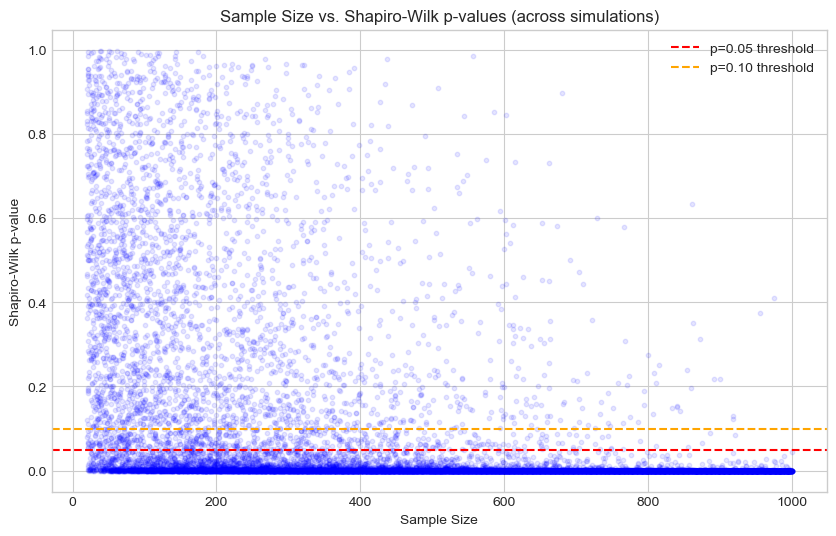

In [315]:
# Parameters for the simulation
min_sample_size = 20     # Minimum sample size
max_sample_size = 1000   # Maximum sample size
step_size = 1            # Step size for increasing sample size
num_simulations = 20     # Number of simulations per sample size
dot_size = 10            # Size of the dots in the plot

# Define the range of sample sizes
sample_sizes = np.arange(min_sample_size, max_sample_size + 1, step_size)

# Initialize a list to store the results
results = []

# Loop through each sample size
for size in sample_sizes:
    p_values = []  # List to store p-values for each simulation at this sample size
    
    # Perform multiple simulations for each sample size
    for _ in range(num_simulations):
        # Take a random subsample of the given size from residuals
        subsample = residuals.sample(size, random_state=np.random.randint(0, 10000))
        
        # Perform Shapiro-Wilk test and store the p-value
        _, p_value = shapiro(subsample)
        p_values.append(p_value)

        # Append individual result to the list
        results.append({'Sample Size': size, 'Shapiro-Wilk p-value': p_value})

# Convert results to a DataFrame for easy plotting
results_df = pd.DataFrame(results)

# Plot the Sample Size vs. Average P-Value curve
plt.figure(figsize=(10, 6))
plt.scatter(results_df['Sample Size'], results_df['Shapiro-Wilk p-value'], alpha=0.1, s=dot_size, c="blue")
plt.axhline(0.05, color='red', linestyle='--', label='p=0.05 threshold')
plt.axhline(0.10, color='orange', linestyle='--', label='p=0.10 threshold')
plt.xlabel('Sample Size')
plt.ylabel('Shapiro-Wilk p-value')
plt.title('Sample Size vs. Shapiro-Wilk p-values (across simulations)')
plt.legend()
plt.show()

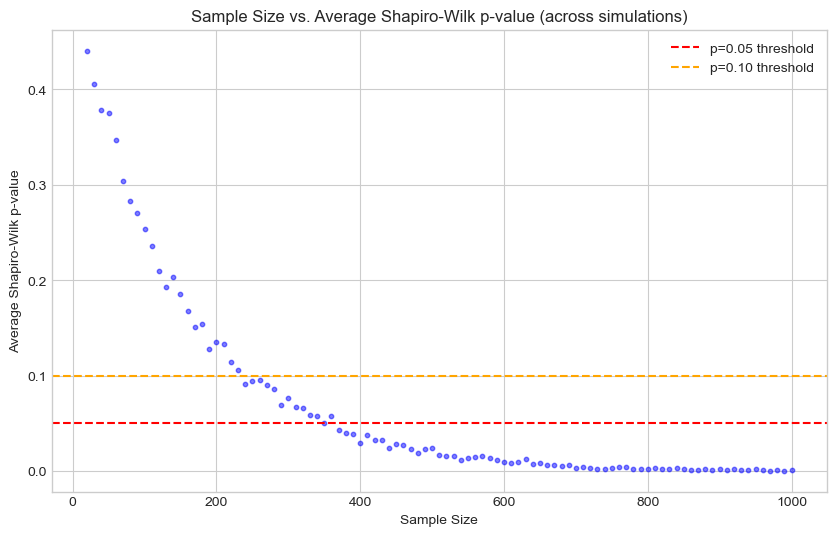

In [316]:
# Parameters for the simulation
min_sample_size = 20     # Minimum sample size
max_sample_size = 1000   # Maximum sample size
step_size = 10           # Step size for increasing sample size
num_simulations = 1000     # Number of simulations per sample size
dot_size = 10            # Size of the dots in the plot

# Define the range of sample sizes
sample_sizes = np.arange(min_sample_size, max_sample_size + 1, step_size)

# Initialize a list to store the results
results = []

# Loop through each sample size
for size in sample_sizes:
    p_values = []  # List to store p-values for each simulation at this sample size

    # Perform multiple simulations for each sample size
    for _ in range(num_simulations):
        # Take a random subsample of the given size from residuals
        subsample = residuals.sample(size, random_state=np.random.randint(0, 10000))
        
        # Perform Shapiro-Wilk test and store the p-value
        _, p_value = shapiro(subsample)
        p_values.append(p_value)
    
    # Calculate the average p-value across simulations
    avg_p_value = np.mean(p_values)
    
    # Append results to the list
    results.append({'Sample Size': size, 'Average Shapiro-Wilk p-value': avg_p_value})

# Convert results to a DataFrame for easy plotting
results_df = pd.DataFrame(results)

# Plot the Sample Size vs. Average P-Value curve
plt.figure(figsize=(10, 6))
plt.scatter(results_df['Sample Size'], results_df['Average Shapiro-Wilk p-value'], alpha=0.5, s=dot_size, c="blue")
plt.axhline(0.05, color='red', linestyle='--', label='p=0.05 threshold')
plt.axhline(0.10, color='orange', linestyle='--', label='p=0.10 threshold')
plt.xlabel('Sample Size')
plt.ylabel('Average Shapiro-Wilk p-value')
plt.title('Sample Size vs. Average Shapiro-Wilk p-value (across simulations)')
plt.legend()
plt.show()

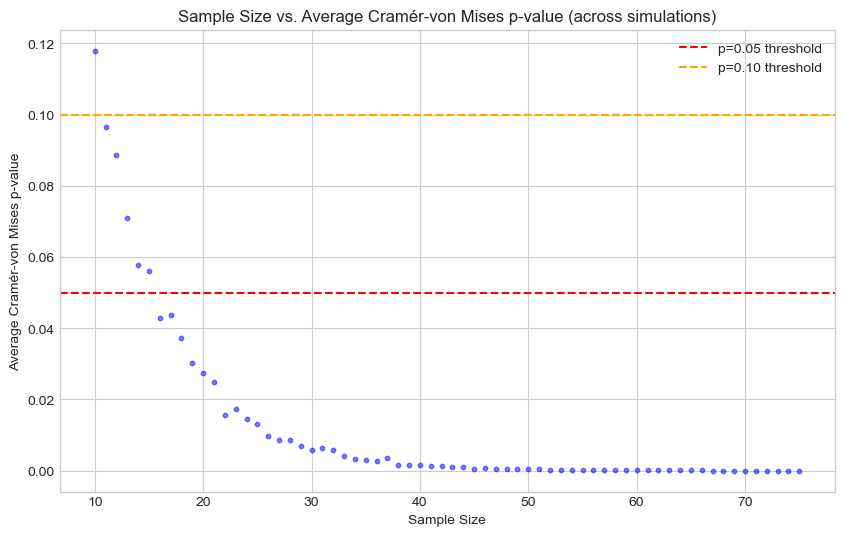

In [317]:
# Parameters for the simulation
min_sample_size = 10     # Minimum sample size
max_sample_size = 75   # Maximum sample size
step_size = 1           # Step size for increasing sample size
num_simulations = 100     # Number of simulations per sample size
dot_size = 10            # Size of the dots in the plot

# Define the range of sample sizes
sample_sizes = np.arange(min_sample_size, max_sample_size + 1, step_size)

# Initialize a list to store the results
results = []

# Loop through each sample size
for size in sample_sizes:
    p_values = []  # List to store p-values for each simulation at this sample size

    # Perform multiple simulations for each sample size
    for _ in range(num_simulations):
        # Take a random subsample of the given size from residuals
        subsample = residuals.sample(size, random_state=np.random.randint(0, 10000))
        
        # Perform Cramér-von Mises test and store the p-value
        cvm_result = cramervonmises(subsample, 'norm')
        p_values.append(cvm_result.pvalue)
    
    # Calculate the average p-value across simulations
    avg_p_value = np.mean(p_values)
    
    # Append results to the list
    results.append({
        'Sample Size': size,
        'Average Cramér-von Mises p-value': avg_p_value,
        'Kurtosis': kurtosis(subsample),
        'Skewness': skew(subsample)
    })

# Convert results to a DataFrame for easy plotting
results_df = pd.DataFrame(results)

# Plot the Sample Size vs. Average P-Value curve
plt.figure(figsize=(10, 6))
plt.scatter(results_df['Sample Size'], results_df['Average Cramér-von Mises p-value'], alpha=0.5, s=dot_size, c="blue")
plt.axhline(0.05, color='red', linestyle='--', label='p=0.05 threshold')
plt.axhline(0.10, color='orange', linestyle='--', label='p=0.10 threshold')
plt.xlabel('Sample Size')
plt.ylabel('Average Cramér-von Mises p-value')
plt.title('Sample Size vs. Average Cramér-von Mises p-value (across simulations)')
plt.legend()
plt.show()

ANOVA’s Robustness to Mild Deviations: ANOVA is generally robust to minor deviations from normality, especially with larger sample sizes. With residuals that only start to show significant deviations at around 400 samples, it’s likely that these deviations won’t substantially affect your F-test results or interpretations, particularly given that you have 25,000 observations in total.

I would consider the residuals to be close enough to normal for ANOVA purposes. The deviations are statistically significant with larger samples, but their practical impact is minimal given the robustness of ANOVA to mild normality violations.

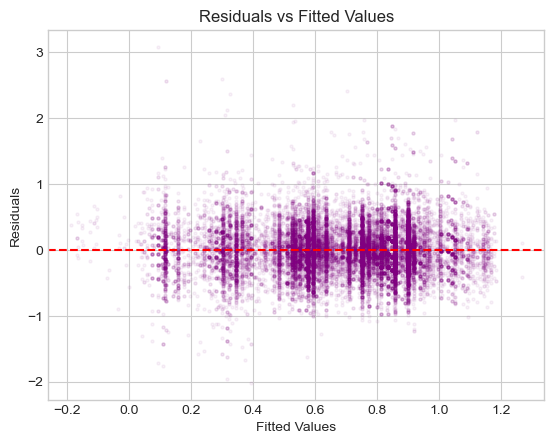

In [320]:
# Plot residuals to check for homoscedasticity
def plot_residuals(model):
    residuals = model.resid
    fitted_values = model.fittedvalues
    
    # Scatter plot of residuals vs fitted values
    plt.scatter(fitted_values, residuals, alpha=0.05, s=5, color='purple')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Fitted Values')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Fitted Values')
    plt.show()

# Example usage:
plot_residuals(model)

In [321]:
# Assuming 'model' is your fitted ANOVA or regression model
residuals = model.resid
exog = model.model.exog  # Independent variables used in the model

bp_test = sms.het_breuschpagan(residuals, exog)
print(f"Breusch-Pagan test statistic: {bp_test[0]}, p-value: {bp_test[1]}")

Breusch-Pagan test statistic: 1220.173157656531, p-value: 4.514935138601378e-186


In [322]:
exog_white = sm.add_constant(np.column_stack([exog, exog**2]))  # Adding squared terms for White's test
white_test = sms.het_breuschpagan(residuals, exog_white)
print(f"White's test statistic: {white_test[0]}, p-value: {white_test[1]}")

White's test statistic: 1220.1672749783497, p-value: 4.932518642461839e-137


In [323]:
# Group residuals by each factorial cell (survey, job_category, seniority_level)
df_combined['residuals'] = model.resid
groups = [df_combined[df_combined['survey'] == survey]['residuals'].abs() for survey in df_combined['survey'].unique()]

# Brown-Forsythe (modified Levene) test
brown_forsythe = levene(*groups, center='median')
print(f"Brown-Forsythe test statistic: {brown_forsythe.statistic}, p-value: {brown_forsythe.pvalue}")

Brown-Forsythe test statistic: 485.9113216098483, p-value: 4.876856879839207e-208


In [324]:
# Group residuals by each factorial cell (survey, job_category, seniority_level)
df_combined['residuals'] = model.resid
factorial_cells = df_combined.groupby(['survey', 'job_category', 'seniority_level'], observed=False)

# Extract absolute residuals for each factorial cell
groups = [cell['residuals'].abs().values for _, cell in factorial_cells]

# Brown-Forsythe (modified Levene) test across all factorial cells
brown_forsythe = levene(*groups, center='median')
print(f"Brown-Forsythe test statistic: {brown_forsythe.statistic}, p-value: {brown_forsythe.pvalue}")

Brown-Forsythe test statistic: 15.70078910834984, p-value: 5.729092246063559e-242


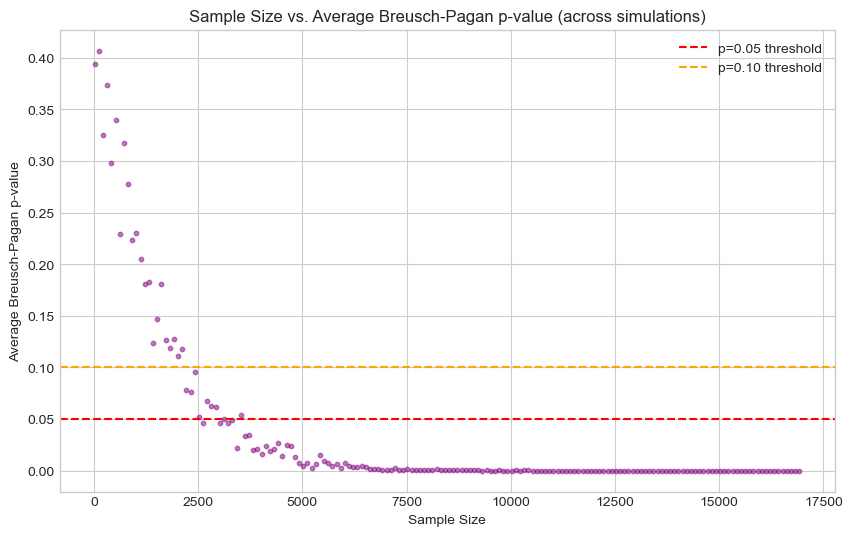

In [325]:
# Extract residuals and fitted values
residuals = model.resid
fitted_values = model.fittedvalues

# Parameters for the simulation
min_sample_size = 20      # Minimum sample size
max_sample_size = 17000    # Maximum sample size
step_size = 100            # Step size for increasing sample size
num_simulations = 100     # Number of simulations per sample size
dot_size = 10             # Size of the dots in the plot

# Define the range of sample sizes
sample_sizes = np.arange(min_sample_size, max_sample_size + 1, step_size)

# Initialize a list to store the results
results = []

# Loop through each sample size
for size in sample_sizes:
    p_values = []  # List to store p-values for each simulation at this sample size

    # Perform multiple simulations for each sample size
    for _ in range(num_simulations):
        # Randomly sample indices and select subset of residuals and fitted values
        indices = np.random.choice(range(len(residuals)), size=size, replace=False)
        subsample_residuals = residuals.iloc[indices]
        subsample_fitted_values = fitted_values.iloc[indices]

        # Prepare data for Breusch-Pagan test
        exog = add_constant(subsample_fitted_values)  # Add constant to independent variables
        bp_test = het_breuschpagan(subsample_residuals, exog)

        # Store the p-value from the Breusch-Pagan test
        p_value = bp_test[1]  # p-value is the second element in the returned tuple
        p_values.append(p_value)
    
    # Calculate the average p-value across simulations
    avg_p_value = np.mean(p_values)
    
    # Append results to the list
    results.append({'Sample Size': size, 'Average Breusch-Pagan p-value': avg_p_value})

# Convert results to a DataFrame for easy plotting
results_df = pd.DataFrame(results)

# Plot the Sample Size vs. Average Breusch-Pagan P-Value curve
plt.figure(figsize=(10, 6))
plt.scatter(results_df['Sample Size'], results_df['Average Breusch-Pagan p-value'], alpha=0.5, s=dot_size, c="purple")
plt.axhline(0.05, color='red', linestyle='--', label='p=0.05 threshold')
plt.axhline(0.10, color='orange', linestyle='--', label='p=0.10 threshold')
plt.xlabel('Sample Size')
plt.ylabel('Average Breusch-Pagan p-value')
plt.title('Sample Size vs. Average Breusch-Pagan p-value (across simulations)')
plt.legend()
plt.show()

#### TODO: Type 3 explanation
Performs ANOVA with Type III sum of squares, which accounts for the hierarchical structure of the model and the presence of other variables.

Conclusion:\
There is statistical significance between the surveys, as indicated by the ANOVA results, and the large sample sizes across factorial cells enhance our confidence in these findings. However, the magnitude of the observed differences, as reflected in the weighted average Eta-squared values, suggests that these differences are relatively small in practical terms.

The weighted average Eta-squared values indicate that the differences between surveys account for only 0.8%, 2.7%, and 3.1% of the variance in salaries for the respective survey comparisons (df_k vs. df_it, df_k vs. df_ai, and df_ai vs. df_it). This means that while the surveys do exhibit statistically significant differences, the practical impact of these differences is minor. The majority of the variance in salaries is explained by factors other than the survey source, such as seniority level, job category, and other relevant factors (other individual differences between respondants).

In summary, while the differences between the surveys are statistically detectable, the effect sizes are small, indicating that the surveys are more similar than different in terms of the salary distributions they represent.

### Multiway - IT

In [329]:
df_it_w_l.head(1)

,seniority_level,level_1,age,city,job_title,language_at_work,company_size,company_type,salary,year,country,experience,skills,skills_2,employment_status,years_of_experience_in_germany,job_title_2,your_seniority_level,skills_3,company_industry,survey,city_category,language_category,company_size_category,industry_category,country_code,median_income_2020_usd,mean_income_2020_usd,gdp_ppp_usd,glassdoor_software_engineer_usd,salary_normmed,salary_normmean,salary_normgdp,salary_normse,salary_norm,salary_2024,salary_norm_2024,salary_normmed_2024,salary_normmean_2024,salary_normgdp_2024,salary_normse_2024,job_category,salary_log,salary_2024_log,salary_norm_log,salary_norm_2024_log,salary_normmed_2024_log,salary_normmean_2024_log,salary_normgdp_2024_log,salary_normse_2024_log,z_score,modif_z_score,modif_z_score_signed,developer_job_category,managerial_job_category
0,executive,8,35.0000,berlin,software engineer,english,101-1000,product,108343.9058,2020,de,15.0000,java,NaN,full-time employee,3.0000,NaN,NaN,NaN,NaN,it,berlin,English-speaking (but not german),m,other,de,16845,19730,69338,83332.0000,6.4318,5.4913,1.5625,1.3001,2.2239,128112.4736,2.6297,7.6054,6.4933,1.8477,1.5374,Software Engineer,11.5931,11.7607,0.7993,0.9669,2.0289,1.8708,0.6139,0.4301,-0.0643,0.0655,-0.0655,Software Engineer,Developers


In [330]:
# Define the dataframe to be used
df_name = df_it_w_l

# List of your categorical variables
categorical_vars = ['seniority_level', 'job_category', 'year', 'language_at_work', 'company_size']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_name[var] = df_name[var].astype('category')

# Define the formula for the model, adding the interaction term
interaction_term = ''#'C(seniority_level):C(job_category)'
formula = 'salary_norm_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])# + ' + ' + interaction_term

# Fit the model
model = ols(formula, data=df_name).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Function to calculate Cohen's f from partial eta-squared
def cohen_f_from_partial_eta_squared(eta_squared):
    if eta_squared >= 1 or eta_squared < 0:
        raise ValueError(f"Invalid eta-squared value: {eta_squared}. It must be between 0 and 1.")
    return np.sqrt(eta_squared / (1 - eta_squared))

# Initialize a dictionary to store power values
power_results = {}

# Total sample size
nobs = df_name.shape[0]

# Set alpha level (commonly 0.05)
alpha = 0.05

for var, actual_var in zip(variables, categorical_vars + [interaction_term]):
    # Get partial eta squared
    partial_eta_sq_var = anova_results.loc[var, 'Partial_eta_sq']
    # Compute Cohen's f
    effect_size = cohen_f_from_partial_eta_squared(partial_eta_sq_var)
    # Number of groups (levels) in the actual variable
    if var == interaction_term:
        k_groups = df_name.groupby(['job_category', 'seniority_level'], observed=True).ngroups
        group_sizes = df_name.groupby(['job_category', 'seniority_level'], observed=True).size().values
    else:
        k_groups = df_name[actual_var].nunique()
        group_sizes = df_name.groupby(actual_var, observed=True).size().values
    # Calculate the effective sample size for this variable
    nobs_var = len(group_sizes) * (len(group_sizes) / np.sum(1 / group_sizes))
    # Compute power
    power_analysis = FTestAnovaPower()
    power = power_analysis.power(effect_size=effect_size, nobs=nobs_var, alpha=alpha, k_groups=k_groups)
    # Store the power value
    power_results[var] = power

# Add power values to the anova_results DataFrame
anova_results['Power'] = pd.Series(power_results)

# Display the updated ANOVA results with power
anova_results

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Power
C(seniority_level),71.7489,3.0000,583.4805,0.0000,0.5991,0.2835,1.0000
C(job_category),19.2022,18.0000,26.0261,0.0000,0.1603,0.0957,1.0000
C(year),3.3696,5.0000,16.4414,0.0000,0.0281,0.0182,1.0000
C(language_at_work),7.2352,32.0000,5.5161,0.0000,0.0604,0.0384,0.0820
C(company_size),16.8198,4.0000,102.5874,0.0000,0.1404,0.0849,1.0000


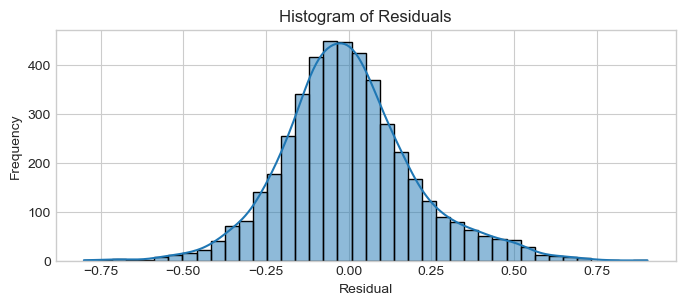

In [331]:
# Extract residuals from the fitted model
residuals = model.resid

# Plot histogram of residuals
plt.figure(figsize=(8, 3))
sns.histplot(residuals, kde=True, bins=40)
plt.title('Histogram of Residuals')
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.show()

<Figure size 800x300 with 0 Axes>

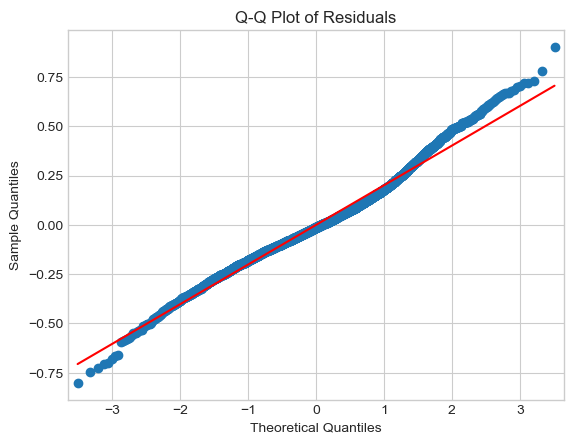

In [332]:
# Extract residuals from the fitted model
residuals = model.resid

# Create a Q-Q plot
plt.figure(figsize=(8, 3))
fig = sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

In [333]:
# Extract residuals from the fitted model
residuals = model.resid

# Perform the Cramér-von Mises test for normality
cvm_result = cramervonmises(residuals, 'norm')

# Calculate additional statistics
population_size = len(residuals)
kurtosis_value = kurtosis(residuals) # Excess kurtosis! Normal distribution should have 0.
skewness_value = skew(residuals)

# Create a DataFrame with results
normality_results = pd.DataFrame({
    'Test Statistic (CVM)': [cvm_result.statistic],
    'p-value': [cvm_result.pvalue],
    'Population Size': [population_size],
    'Kurtosis': [kurtosis_value],
    'Skewness': [skewness_value],
    'Significance@ p<0.10': ['*' if cvm_result.pvalue < 0.10 else ''],
    'Significance@ p<0.05': ['*' if cvm_result.pvalue < 0.05 else ''],
    'Significance@ p<0.01': ['*' if cvm_result.pvalue < 0.01 else '']
})

# Display the results
normality_results

,Test Statistic (CVM),p-value,Population Size,Kurtosis,Skewness,Significance@ p<0.10,Significance@ p<0.05,Significance@ p<0.01
0,207.4771,0.0000,4488,0.9125,0.3833,*,*,*


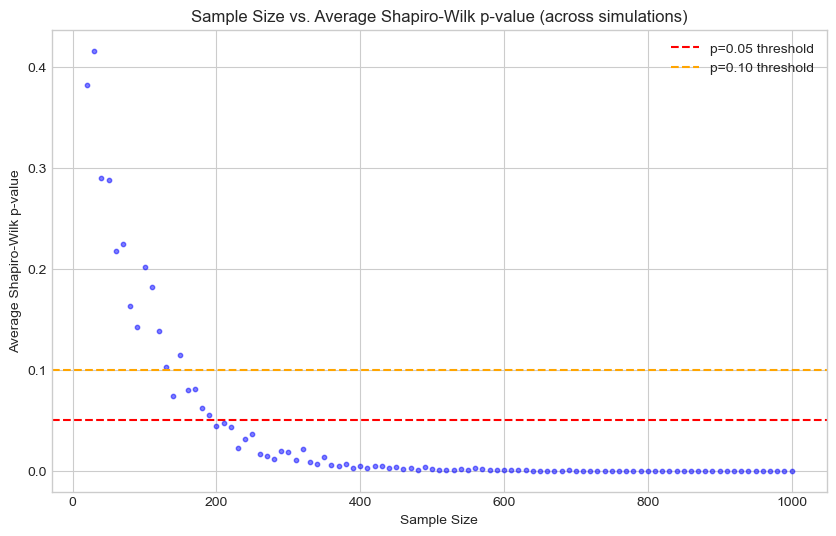

In [334]:
# Parameters for the simulation
min_sample_size = 20     # Minimum sample size
max_sample_size = 1000   # Maximum sample size
step_size = 10           # Step size for increasing sample size
num_simulations = 100     # Number of simulations per sample size
dot_size = 10            # Size of the dots in the plot

# Define the range of sample sizes
sample_sizes = np.arange(min_sample_size, max_sample_size + 1, step_size)

# Initialize a list to store the results
results = []

# Loop through each sample size
for size in sample_sizes:
    p_values = []  # List to store p-values for each simulation at this sample size

    # Perform multiple simulations for each sample size
    for _ in range(num_simulations):
        # Take a random subsample of the given size from residuals
        subsample = residuals.sample(size, random_state=np.random.randint(0, 10000))
        
        # Perform Shapiro-Wilk test and store the p-value
        _, p_value = shapiro(subsample)
        p_values.append(p_value)
    
    # Calculate the average p-value across simulations
    avg_p_value = np.mean(p_values)
    
    # Append results to the list
    results.append({'Sample Size': size, 'Average Shapiro-Wilk p-value': avg_p_value})

# Convert results to a DataFrame for easy plotting
results_df = pd.DataFrame(results)

# Plot the Sample Size vs. Average P-Value curve
plt.figure(figsize=(10, 6))
plt.scatter(results_df['Sample Size'], results_df['Average Shapiro-Wilk p-value'], alpha=0.5, s=dot_size, c="blue")
plt.axhline(0.05, color='red', linestyle='--', label='p=0.05 threshold')
plt.axhline(0.10, color='orange', linestyle='--', label='p=0.10 threshold')
plt.xlabel('Sample Size')
plt.ylabel('Average Shapiro-Wilk p-value')
plt.title('Sample Size vs. Average Shapiro-Wilk p-value (across simulations)')
plt.legend()
plt.show()

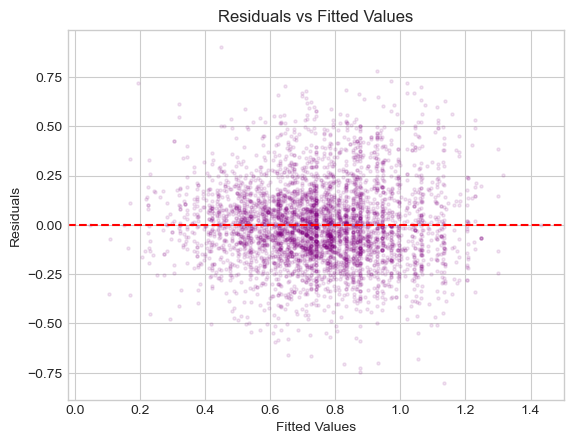

In [335]:
# Plot residuals to check for homoscedasticity
def plot_residuals(model):
    residuals = model.resid
    fitted_values = model.fittedvalues
    
    # Scatter plot of residuals vs fitted values
    plt.scatter(fitted_values, residuals, alpha=0.1, s=5, color='purple')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Fitted Values')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Fitted Values')
    plt.show()

# Example usage:
plot_residuals(model)

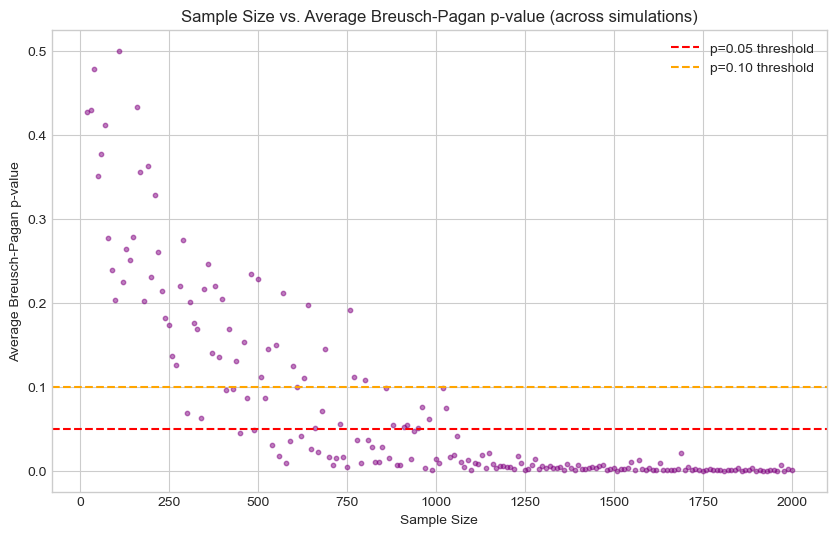

In [336]:
# Extract residuals and fitted values
residuals = model.resid
fitted_values = model.fittedvalues

# Parameters for the simulation
min_sample_size = 20      # Minimum sample size
max_sample_size = 2000    # Maximum sample size
step_size = 10            # Step size for increasing sample size
num_simulations = 10     # Number of simulations per sample size
dot_size = 10             # Size of the dots in the plot

# Define the range of sample sizes
sample_sizes = np.arange(min_sample_size, max_sample_size + 1, step_size)

# Initialize a list to store the results
results = []

# Loop through each sample size
for size in sample_sizes:
    p_values = []  # List to store p-values for each simulation at this sample size

    # Perform multiple simulations for each sample size
    for _ in range(num_simulations):
        # Randomly sample indices and select subset of residuals and fitted values
        indices = np.random.choice(range(len(residuals)), size=size, replace=False)
        subsample_residuals = residuals.iloc[indices]
        subsample_fitted_values = fitted_values.iloc[indices]

        # Prepare data for Breusch-Pagan test
        exog = add_constant(subsample_fitted_values)  # Add constant to independent variables
        bp_test = het_breuschpagan(subsample_residuals, exog)

        # Store the p-value from the Breusch-Pagan test
        p_value = bp_test[1]  # p-value is the second element in the returned tuple
        p_values.append(p_value)
    
    # Calculate the average p-value across simulations
    avg_p_value = np.mean(p_values)
    
    # Append results to the list
    results.append({'Sample Size': size, 'Average Breusch-Pagan p-value': avg_p_value})

# Convert results to a DataFrame for easy plotting
results_df = pd.DataFrame(results)

# Plot the Sample Size vs. Average Breusch-Pagan P-Value curve
plt.figure(figsize=(10, 6))
plt.scatter(results_df['Sample Size'], results_df['Average Breusch-Pagan p-value'], alpha=0.5, s=dot_size, c="purple")
plt.axhline(0.05, color='red', linestyle='--', label='p=0.05 threshold')
plt.axhline(0.10, color='orange', linestyle='--', label='p=0.10 threshold')
plt.xlabel('Sample Size')
plt.ylabel('Average Breusch-Pagan p-value')
plt.title('Sample Size vs. Average Breusch-Pagan p-value (across simulations)')
plt.legend()
plt.show()

### Multiway - AI-Jobs

In [338]:
df_ai_w_l.head(1)

,seniority_level,level_1,year,employment_status,job_title,salary_in_currency,salary_currency,salary,country,remote_ratio,company_location,company_size,ratio,survey,company_size_category,country_code,median_income_2020_usd,mean_income_2020_usd,gdp_ppp_usd,glassdoor_software_engineer_usd,salary_normmed,salary_normmean,salary_normgdp,salary_normse,salary_norm,salary_2024,salary_norm_2024,salary_normmed_2024,salary_normmean_2024,salary_normgdp_2024,salary_normse_2024,job_category,salary_log,salary_2024_log,salary_norm_log,salary_norm_2024_log,salary_normmed_2024_log,salary_normmean_2024_log,salary_normgdp_2024_log,salary_normse_2024_log,z_score,modif_z_score,modif_z_score_signed,developer_job_category,managerial_job_category
0,junior,5,2024,ft,data analyst,102927,usd,102927,au,0,au,m,1.0000,ai,m,au,17076,21329,69115,81659.0000,6.0276,4.8257,1.4892,1.2604,1.5811,102927.0000,1.5811,6.0276,4.8257,1.4892,1.2604,Data Analyst,11.5418,11.5418,0.4581,0.4581,1.7963,1.5740,0.3982,0.2315,0.3630,0.5390,0.5390,Data Analyst,Developers


In [339]:
# Define the dataframe to be used
df_name = df_ai_w_l

# List of your categorical variables
categorical_vars = ['seniority_level', 'job_category', 'year', 'company_size']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_name[var] = df_name[var].astype('category')

# Define the formula for the model, adding the interaction term
interaction_term = ''#'C(seniority_level):C(job_category)'
formula = 'salary_norm_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])# + ' + ' + interaction_term

# Fit the model
model = ols(formula, data=df_name).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Function to calculate Cohen's f from partial eta-squared
def cohen_f_from_partial_eta_squared(eta_squared):
    if eta_squared >= 1 or eta_squared < 0:
        raise ValueError(f"Invalid eta-squared value: {eta_squared}. It must be between 0 and 1.")
    return np.sqrt(eta_squared / (1 - eta_squared))

# Initialize a dictionary to store power values
power_results = {}

# Total sample size
nobs = df_name.shape[0]

# Set alpha level (commonly 0.05)
alpha = 0.05

for var, actual_var in zip(variables, categorical_vars + [interaction_term]):
    # Get partial eta squared
    partial_eta_sq_var = anova_results.loc[var, 'Partial_eta_sq']
    # Compute Cohen's f
    effect_size = cohen_f_from_partial_eta_squared(partial_eta_sq_var)
    # Number of groups (levels) in the actual variable
    if var == interaction_term:
        k_groups = df_name.groupby(['job_category', 'seniority_level'], observed=True).ngroups
        group_sizes = df_name.groupby(['job_category', 'seniority_level'], observed=True).size().values
    else:
        k_groups = df_name[actual_var].nunique()
        group_sizes = df_name.groupby(actual_var, observed=True).size().values
    # Calculate the effective sample size for this variable
    nobs_var = len(group_sizes) * (len(group_sizes) / np.sum(1 / group_sizes))
    # Compute power
    power_analysis = FTestAnovaPower()
    power = power_analysis.power(effect_size=effect_size, nobs=nobs_var, alpha=alpha, k_groups=k_groups)
    # Store the power value
    power_results[var] = power

# Add power values to the anova_results DataFrame
anova_results['Power'] = pd.Series(power_results)

# Display the updated ANOVA results with power
anova_results

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Power
C(seniority_level),273.2368,3.0000,762.3414,0.0000,0.4748,0.1330,1.0000
C(job_category),252.6110,7.0000,302.0549,0.0000,0.4390,0.1242,1.0000
C(year),7.1609,4.0000,14.9844,0.0000,0.0124,0.0040,0.2625
C(company_size),2.3395,2.0000,9.7908,0.0001,0.0041,0.0013,0.1250


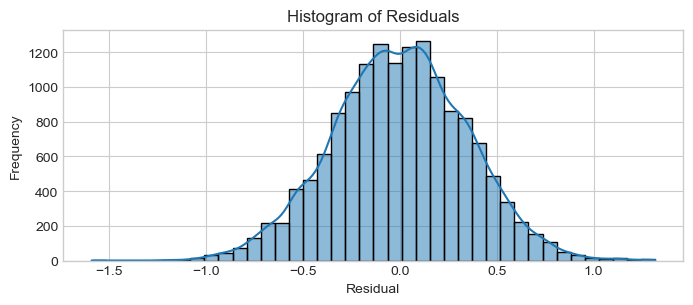

In [340]:
# Extract residuals from the fitted model
residuals = model.resid

# Plot histogram of residuals
plt.figure(figsize=(8, 3))
sns.histplot(residuals, kde=True, bins=40)
plt.title('Histogram of Residuals')
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.show()

<Figure size 800x300 with 0 Axes>

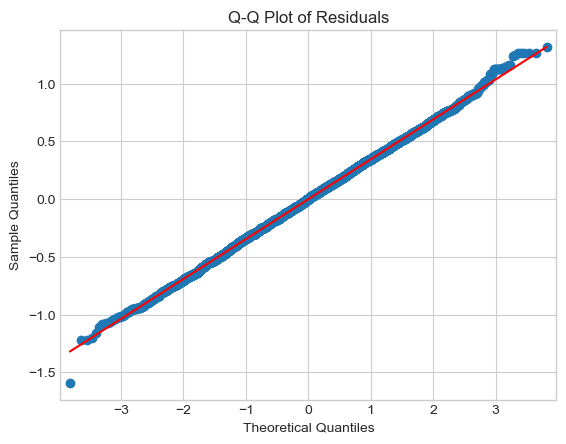

In [341]:
# Extract residuals from the fitted model
residuals = model.resid

# Create a Q-Q plot
plt.figure(figsize=(8, 3))
fig = sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

In [342]:
# Extract residuals from the fitted model
residuals = model.resid

# Perform the Cramér-von Mises test for normality
cvm_result = cramervonmises(residuals, 'norm')

# Calculate additional statistics
population_size = len(residuals)
kurtosis_value = kurtosis(residuals) # Excess kurtosis! Normal distribution should have 0.
skewness_value = skew(residuals)

# Create a DataFrame with results
normality_results = pd.DataFrame({
    'Test Statistic (CVM)': [cvm_result.statistic],
    'p-value': [cvm_result.pvalue],
    'Population Size': [population_size],
    'Kurtosis': [kurtosis_value],
    'Skewness': [skewness_value],
    'Significance@ p<0.10': ['*' if cvm_result.pvalue < 0.10 else ''],
    'Significance@ p<0.05': ['*' if cvm_result.pvalue < 0.05 else ''],
    'Significance@ p<0.01': ['*' if cvm_result.pvalue < 0.01 else '']
})

# Display the results
normality_results

,Test Statistic (CVM),p-value,Population Size,Kurtosis,Skewness,Significance@ p<0.10,Significance@ p<0.05,Significance@ p<0.01
0,391.0267,0.0000,14927,0.0250,-0.0129,*,*,*


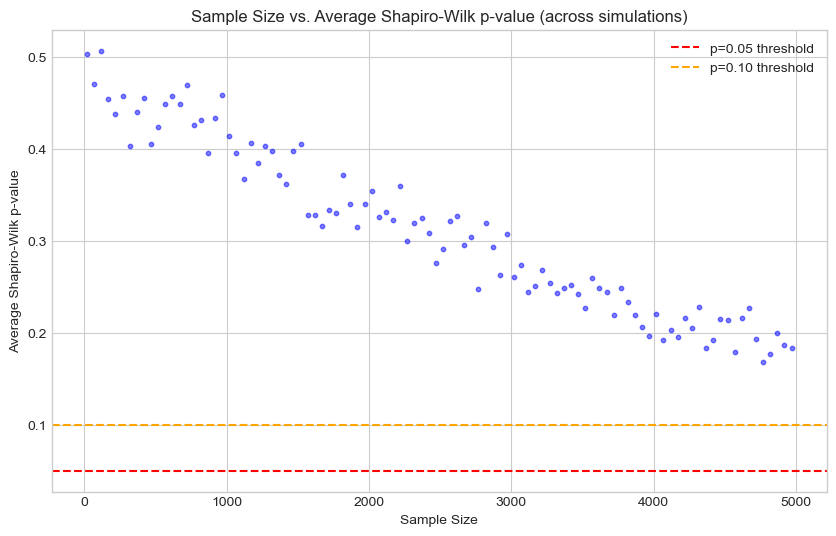

In [343]:
# Parameters for the simulation
min_sample_size = 20     # Minimum sample size
max_sample_size = 5000   # Maximum sample size
step_size = 50           # Step size for increasing sample size
num_simulations = 100     # Number of simulations per sample size
dot_size = 10            # Size of the dots in the plot

# Define the range of sample sizes
sample_sizes = np.arange(min_sample_size, max_sample_size + 1, step_size)

# Initialize a list to store the results
results = []

# Loop through each sample size
for size in sample_sizes:
    p_values = []  # List to store p-values for each simulation at this sample size

    # Perform multiple simulations for each sample size
    for _ in range(num_simulations):
        # Take a random subsample of the given size from residuals
        subsample = residuals.sample(size, random_state=np.random.randint(0, 10000))
        
        # Perform Shapiro-Wilk test and store the p-value
        _, p_value = shapiro(subsample)
        p_values.append(p_value)
    
    # Calculate the average p-value across simulations
    avg_p_value = np.mean(p_values)
    
    # Append results to the list
    results.append({'Sample Size': size, 'Average Shapiro-Wilk p-value': avg_p_value})

# Convert results to a DataFrame for easy plotting
results_df = pd.DataFrame(results)

# Plot the Sample Size vs. Average P-Value curve
plt.figure(figsize=(10, 6))
plt.scatter(results_df['Sample Size'], results_df['Average Shapiro-Wilk p-value'], alpha=0.5, s=dot_size, c="blue")
plt.axhline(0.05, color='red', linestyle='--', label='p=0.05 threshold')
plt.axhline(0.10, color='orange', linestyle='--', label='p=0.10 threshold')
plt.xlabel('Sample Size')
plt.ylabel('Average Shapiro-Wilk p-value')
plt.title('Sample Size vs. Average Shapiro-Wilk p-value (across simulations)')
plt.legend()
plt.show()

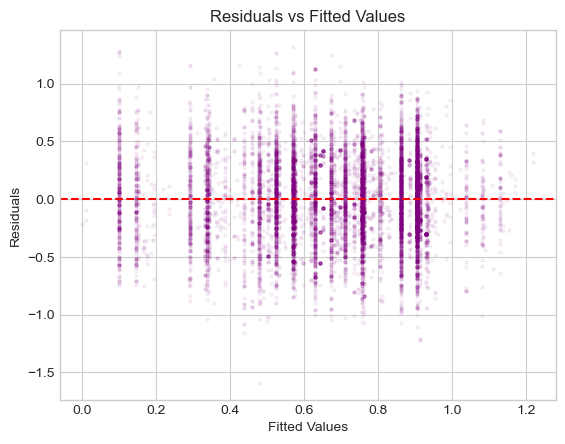

In [344]:
# Plot residuals to check for homoscedasticity
def plot_residuals(model):
    residuals = model.resid
    fitted_values = model.fittedvalues
    
    # Scatter plot of residuals vs fitted values
    plt.scatter(fitted_values, residuals, alpha=0.05, s=5, color='purple')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Fitted Values')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Fitted Values')
    plt.show()

# Example usage:
plot_residuals(model)

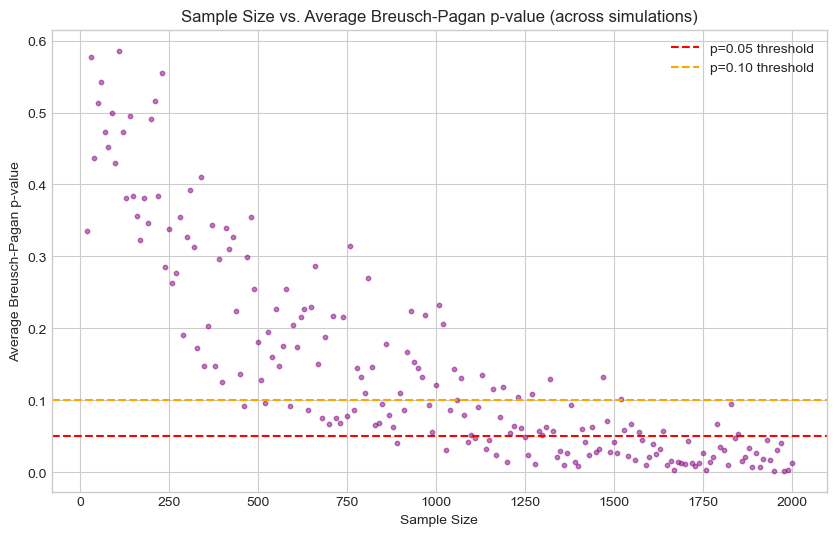

In [345]:
# Extract residuals and fitted values
residuals = model.resid
fitted_values = model.fittedvalues

# Parameters for the simulation
min_sample_size = 20      # Minimum sample size
max_sample_size = 2000    # Maximum sample size
step_size = 10            # Step size for increasing sample size
num_simulations = 10     # Number of simulations per sample size
dot_size = 10             # Size of the dots in the plot

# Define the range of sample sizes
sample_sizes = np.arange(min_sample_size, max_sample_size + 1, step_size)

# Initialize a list to store the results
results = []

# Loop through each sample size
for size in sample_sizes:
    p_values = []  # List to store p-values for each simulation at this sample size

    # Perform multiple simulations for each sample size
    for _ in range(num_simulations):
        # Randomly sample indices and select subset of residuals and fitted values
        indices = np.random.choice(range(len(residuals)), size=size, replace=False)
        subsample_residuals = residuals.iloc[indices]
        subsample_fitted_values = fitted_values.iloc[indices]

        # Prepare data for Breusch-Pagan test
        exog = add_constant(subsample_fitted_values)  # Add constant to independent variables
        bp_test = het_breuschpagan(subsample_residuals, exog)

        # Store the p-value from the Breusch-Pagan test
        p_value = bp_test[1]  # p-value is the second element in the returned tuple
        p_values.append(p_value)
    
    # Calculate the average p-value across simulations
    avg_p_value = np.mean(p_values)
    
    # Append results to the list
    results.append({'Sample Size': size, 'Average Breusch-Pagan p-value': avg_p_value})

# Convert results to a DataFrame for easy plotting
results_df = pd.DataFrame(results)

# Plot the Sample Size vs. Average Breusch-Pagan P-Value curve
plt.figure(figsize=(10, 6))
plt.scatter(results_df['Sample Size'], results_df['Average Breusch-Pagan p-value'], alpha=0.5, s=dot_size, c="purple")
plt.axhline(0.05, color='red', linestyle='--', label='p=0.05 threshold')
plt.axhline(0.10, color='orange', linestyle='--', label='p=0.10 threshold')
plt.xlabel('Sample Size')
plt.ylabel('Average Breusch-Pagan p-value')
plt.title('Sample Size vs. Average Breusch-Pagan p-value (across simulations)')
plt.legend()
plt.show()

### Multiway - Kaggle

In [347]:
df_k_w_l.head(1)

,age,country,education_level,job_title,job_title_2,company_size,salary_range,year,lower_salary,upper_salary,salary,industry,are_you_student,survey,seniority_level,company_size_category,country_code,median_income_2020_usd,mean_income_2020_usd,gdp_ppp_usd,glassdoor_software_engineer_usd,salary_normmed,salary_normmean,salary_normgdp,salary_normse,salary_norm,salary_2024,salary_norm_2024,salary_normmed_2024,salary_normmean_2024,salary_normgdp_2024,salary_normse_2024,job_category,salary_log,salary_2024_log,salary_norm_log,salary_norm_2024_log,salary_normmed_2024_log,salary_normmean_2024_log,salary_normgdp_2024_log,salary_normse_2024_log,z_score,modif_z_score,modif_z_score_signed,developer_job_category,managerial_job_category
0,22-24,fr,master’s degree,software engineer,-1.0000,"1000-9,999 employees","30,000-39,999",2019,30000.0000,39999.0000,34999.5000,NaN,NaN,k,junior,l,fr,16372,19409,61157,58888.0000,2.1378,1.8033,0.5723,0.5943,0.8560,42130.4935,1.0304,2.5733,2.1707,0.6889,0.7154,Software Engineer,10.4631,10.6485,-0.1555,0.0300,0.9452,0.7750,-0.3727,-0.3349,0.3156,0.0779,0.0779,Software Engineer,Developers


In [348]:
# Define the dataframe to be used
df_name = df_k_w_l

# List of your categorical variables
categorical_vars = ['seniority_level', 'job_category','company_size','education_level','year']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_name[var] = df_name[var].astype('category')

# Define the formula for the model, adding the interaction term
interaction_term = ''#'C(seniority_level):C(job_category)'
formula = 'salary_norm_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])# + ' + ' + interaction_term

# Fit the model
model = ols(formula, data=df_name).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Function to calculate Cohen's f from partial eta-squared
def cohen_f_from_partial_eta_squared(eta_squared):
    if eta_squared >= 1 or eta_squared < 0:
        raise ValueError(f"Invalid eta-squared value: {eta_squared}. It must be between 0 and 1.")
    return np.sqrt(eta_squared / (1 - eta_squared))

# Initialize a dictionary to store power values
power_results = {}

# Total sample size
nobs = df_name.shape[0]

# Set alpha level (commonly 0.05)
alpha = 0.05

for var, actual_var in zip(variables, categorical_vars + [interaction_term]):
    # Get partial eta squared
    partial_eta_sq_var = anova_results.loc[var, 'Partial_eta_sq']
    # Compute Cohen's f
    effect_size = cohen_f_from_partial_eta_squared(partial_eta_sq_var)
    # Number of groups (levels) in the actual variable
    if var == interaction_term:
        k_groups = df_name.groupby(['job_category', 'seniority_level'], observed=True).ngroups
        group_sizes = df_name.groupby(['job_category', 'seniority_level'], observed=True).size().values
    else:
        k_groups = df_name[actual_var].nunique()
        group_sizes = df_name.groupby(actual_var, observed=True).size().values
    # Calculate the effective sample size for this variable
    nobs_var = len(group_sizes) * (len(group_sizes) / np.sum(1 / group_sizes))
    # Compute power
    power_analysis = FTestAnovaPower()
    power = power_analysis.power(effect_size=effect_size, nobs=nobs_var, alpha=alpha, k_groups=k_groups)
    # Store the power value
    power_results[var] = power

# Add power values to the anova_results DataFrame
anova_results['Power'] = pd.Series(power_results)

# Display the updated ANOVA results with power
anova_results

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Power
C(seniority_level),315.8719,3.0000,559.0811,0.0000,0.5913,0.1831,1.0000
C(job_category),73.6119,7.0000,55.8386,0.0000,0.1378,0.0496,0.9992
C(company_size),22.6032,5.0000,24.0040,0.0000,0.0423,0.0158,1.0000
C(education_level),1.8094,3.0000,3.2027,0.0223,0.0034,0.0013,0.3465
C(year),3.5369,3.0000,6.2602,0.0003,0.0066,0.0025,0.9565


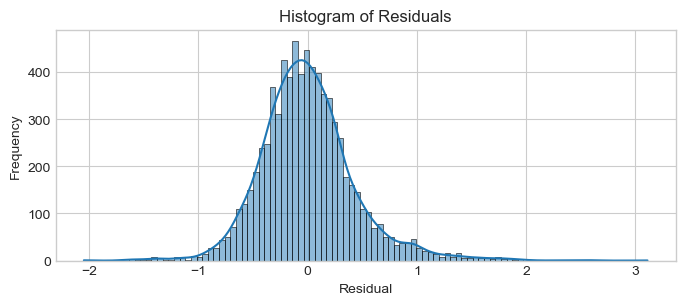

In [349]:
# Extract residuals from the fitted model
residuals = model.resid

# Plot histogram of residuals
plt.figure(figsize=(8, 3))
sns.histplot(residuals, kde=True, bins=100)
plt.title('Histogram of Residuals')
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.show()

<Figure size 800x300 with 0 Axes>

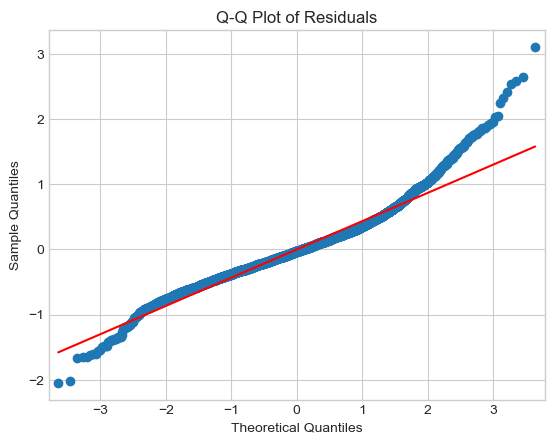

In [350]:
# Extract residuals from the fitted model
residuals = model.resid

# Create a Q-Q plot
plt.figure(figsize=(8, 3))
fig = sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

In [351]:
# Extract residuals from the fitted model
residuals = model.resid

# Perform the Cramér-von Mises test for normality
cvm_result = cramervonmises(residuals, 'norm')

# Calculate additional statistics
population_size = len(residuals)
kurtosis_value = kurtosis(residuals) # Excess kurtosis! Normal distribution should have 0.
skewness_value = skew(residuals)

# Create a DataFrame with results
normality_results = pd.DataFrame({
    'Test Statistic (CVM)': [cvm_result.statistic],
    'p-value': [cvm_result.pvalue],
    'Population Size': [population_size],
    'Kurtosis': [kurtosis_value],
    'Skewness': [skewness_value],
    'Significance@ p<0.10': ['*' if cvm_result.pvalue < 0.10 else ''],
    'Significance@ p<0.05': ['*' if cvm_result.pvalue < 0.05 else ''],
    'Significance@ p<0.01': ['*' if cvm_result.pvalue < 0.01 else '']
})

# Display the results
normality_results

,Test Statistic (CVM),p-value,Population Size,Kurtosis,Skewness,Significance@ p<0.10,Significance@ p<0.05,Significance@ p<0.01
0,165.2268,0.0000,7506,3.0196,0.7639,*,*,*


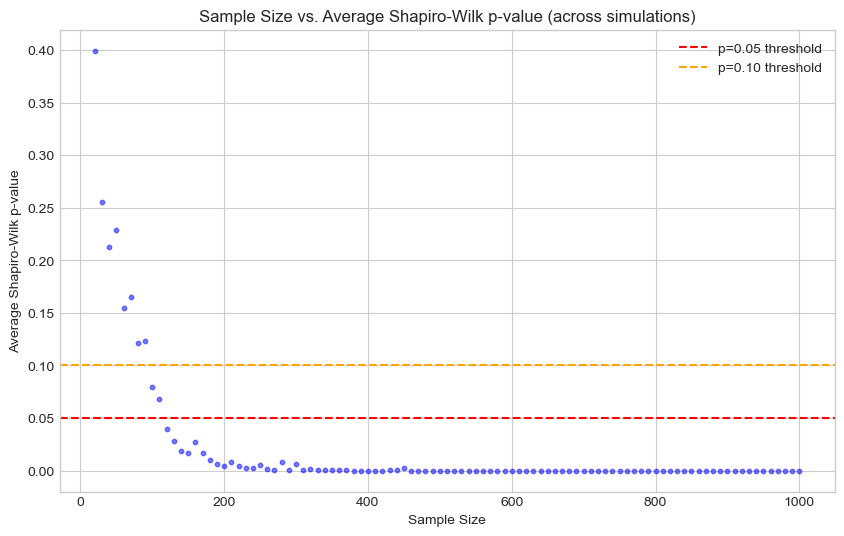

In [352]:
# Parameters for the simulation
min_sample_size = 20     # Minimum sample size
max_sample_size = 1000   # Maximum sample size
step_size = 10           # Step size for increasing sample size
num_simulations = 100     # Number of simulations per sample size
dot_size = 10            # Size of the dots in the plot

# Define the range of sample sizes
sample_sizes = np.arange(min_sample_size, max_sample_size + 1, step_size)

# Initialize a list to store the results
results = []

# Loop through each sample size
for size in sample_sizes:
    p_values = []  # List to store p-values for each simulation at this sample size

    # Perform multiple simulations for each sample size
    for _ in range(num_simulations):
        # Take a random subsample of the given size from residuals
        subsample = residuals.sample(size, random_state=np.random.randint(0, 10000))
        
        # Perform Shapiro-Wilk test and store the p-value
        _, p_value = shapiro(subsample)
        p_values.append(p_value)
    
    # Calculate the average p-value across simulations
    avg_p_value = np.mean(p_values)
    
    # Append results to the list
    results.append({'Sample Size': size, 'Average Shapiro-Wilk p-value': avg_p_value})

# Convert results to a DataFrame for easy plotting
results_df = pd.DataFrame(results)

# Plot the Sample Size vs. Average P-Value curve
plt.figure(figsize=(10, 6))
plt.scatter(results_df['Sample Size'], results_df['Average Shapiro-Wilk p-value'], alpha=0.5, s=dot_size, c="blue")
plt.axhline(0.05, color='red', linestyle='--', label='p=0.05 threshold')
plt.axhline(0.10, color='orange', linestyle='--', label='p=0.10 threshold')
plt.xlabel('Sample Size')
plt.ylabel('Average Shapiro-Wilk p-value')
plt.title('Sample Size vs. Average Shapiro-Wilk p-value (across simulations)')
plt.legend()
plt.show()

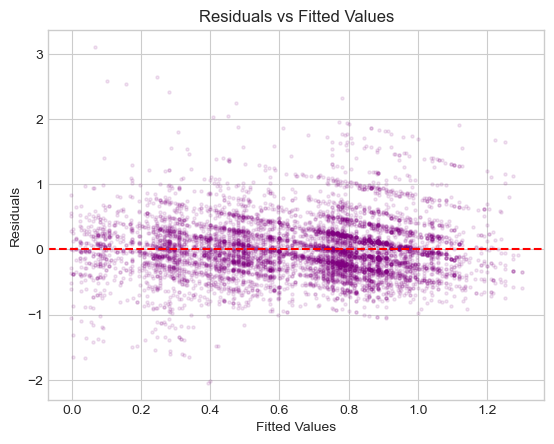

In [353]:
# Plot residuals to check for homoscedasticity
def plot_residuals(model):
    residuals = model.resid
    fitted_values = model.fittedvalues
    
    # Scatter plot of residuals vs fitted values
    plt.scatter(fitted_values, residuals, alpha=0.1, s=5, color='purple')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Fitted Values')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Fitted Values')
    plt.show()

# Example usage:
plot_residuals(model)

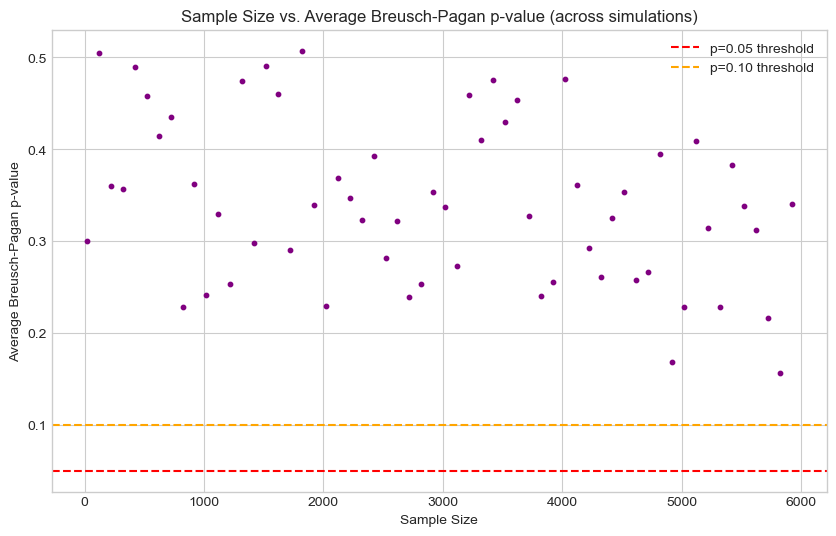

In [354]:
# Extract residuals and fitted values
residuals = model.resid
fitted_values = model.fittedvalues

# Parameters for the simulation
min_sample_size = 20      # Minimum sample size
max_sample_size = 6000    # Maximum sample size
step_size = 100            # Step size for increasing sample size
num_simulations = 10     # Number of simulations per sample size
dot_size = 10             # Size of the dots in the plot

# Define the range of sample sizes
sample_sizes = np.arange(min_sample_size, max_sample_size + 1, step_size)

# Initialize a list to store the results
results = []

# Loop through each sample size
for size in sample_sizes:
    p_values = []  # List to store p-values for each simulation at this sample size

    # Perform multiple simulations for each sample size
    for _ in range(num_simulations):
        # Randomly sample indices and select subset of residuals and fitted values
        indices = np.random.choice(range(len(residuals)), size=size, replace=False)
        subsample_residuals = residuals.iloc[indices]
        subsample_fitted_values = fitted_values.iloc[indices]

        # Prepare data for Breusch-Pagan test
        exog = add_constant(subsample_fitted_values)  # Add constant to independent variables
        bp_test = het_breuschpagan(subsample_residuals, exog)

        # Store the p-value from the Breusch-Pagan test
        p_value = bp_test[1]  # p-value is the second element in the returned tuple
        p_values.append(p_value)
    
    # Calculate the average p-value across simulations
    avg_p_value = np.mean(p_values)
    
    # Append results to the list
    results.append({'Sample Size': size, 'Average Breusch-Pagan p-value': avg_p_value})

# Convert results to a DataFrame for easy plotting
results_df = pd.DataFrame(results)

# Plot the Sample Size vs. Average Breusch-Pagan P-Value curve
plt.figure(figsize=(10, 6))
plt.scatter(results_df['Sample Size'], results_df['Average Breusch-Pagan p-value'], alpha=1, s=dot_size, c="purple")
plt.axhline(0.05, color='red', linestyle='--', label='p=0.05 threshold')
plt.axhline(0.10, color='orange', linestyle='--', label='p=0.10 threshold')
plt.xlabel('Sample Size')
plt.ylabel('Average Breusch-Pagan p-value')
plt.title('Sample Size vs. Average Breusch-Pagan p-value (across simulations)')
plt.legend()
plt.show()

# Partial ETA-squared for individual surveys

### Ai-jobs.net

In [357]:
# List of your categorical variables
categorical_vars = ['seniority_level', 'job_category', 'year', 'country', 'company_size']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_ai_w_l[var] = df_ai_w_l[var].astype('category')

# Define the formula for the model
formula = 'salary_norm_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Fit the model
model = ols(formula, data=df_ai_w_l).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Display the results
anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq']]

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq
C(seniority_level),268.7992,3.0000,762.7505,0.0000,0.4748,0.1331
C(job_category),250.9789,7.0000,305.2214,0.0000,0.4433,0.1254
C(year),7.4485,4.0000,15.8520,0.0000,0.0132,0.0042
C(country),31.2794,12.0000,22.1898,0.0000,0.0553,0.0176
C(company_size),2.1992,2.0000,9.3608,0.0001,0.0039,0.0013


In [358]:
# Function to calculate Cohen's f from partial eta-squared
def cohen_f_from_partial_eta_squared(eta_squared):
    if eta_squared >= 1 or eta_squared < 0:
        raise ValueError(f"Invalid eta-squared value: {eta_squared}. It must be between 0 and 1.")
    return np.sqrt(eta_squared / (1 - eta_squared))

# Function to extract variable name from 'C(variable_name)'
def extract_variable_name(var):
    if var.startswith('C(') and var.endswith(')'):
        return var[2:-1]
    else:
        return var

# Initialize a dictionary to store power values
power_results = {}

# Total sample size
nobs = df_ai_w_l.shape[0]

# Set alpha level (commonly 0.05)
alpha = 0.05

for var in variables:
    # Get the actual variable name without 'C()'
    var_name = extract_variable_name(var)
    # Get partial eta squared
    partial_eta_sq_var = anova_results.loc[var, 'Partial_eta_sq']
    # Compute Cohen's f
    effect_size = cohen_f_from_partial_eta_squared(partial_eta_sq_var)
    # Number of groups (levels) in the variable
    k_groups = df_combined[var_name].nunique()
    # Calculate the effective sample size for this variable
    # Sum of observations across levels of the factor
    nobs_var = df_combined.groupby(var_name, observed=True).size().sum()
    # Alternatively, use the harmonic mean of group sizes
    group_sizes = df_combined.groupby(var_name, observed=True).size().values
    nobs_var = len(group_sizes) * (len(group_sizes) / np.sum(1 / group_sizes))
    # Compute power
    power_analysis = FTestAnovaPower()
    power = power_analysis.power(effect_size=effect_size, nobs=nobs_var, alpha=alpha, k_groups=k_groups)
    # Store the power value
    power_results[var] = power

# Add power values to the anova_results DataFrame
anova_results['Power'] = pd.Series(power_results)

# Display the updated ANOVA results with power
display(anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq', 'Power']])

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Power
C(seniority_level),268.7992,3.0000,762.7505,0.0000,0.4748,0.1331,1.0000
C(job_category),250.9789,7.0000,305.2214,0.0000,0.4433,0.1254,1.0000
C(year),7.4485,4.0000,15.8520,0.0000,0.0132,0.0042,1.0000
C(country),31.2794,12.0000,22.1898,0.0000,0.0553,0.0176,0.4984
C(company_size),2.1992,2.0000,9.3608,0.0001,0.0039,0.0013,0.3700


### Kaggle

In [360]:
df_k_w_l.head(1)

,age,country,education_level,job_title,job_title_2,company_size,salary_range,year,lower_salary,upper_salary,salary,industry,are_you_student,survey,seniority_level,company_size_category,country_code,median_income_2020_usd,mean_income_2020_usd,gdp_ppp_usd,glassdoor_software_engineer_usd,salary_normmed,salary_normmean,salary_normgdp,salary_normse,salary_norm,salary_2024,salary_norm_2024,salary_normmed_2024,salary_normmean_2024,salary_normgdp_2024,salary_normse_2024,job_category,salary_log,salary_2024_log,salary_norm_log,salary_norm_2024_log,salary_normmed_2024_log,salary_normmean_2024_log,salary_normgdp_2024_log,salary_normse_2024_log,z_score,modif_z_score,modif_z_score_signed,developer_job_category,managerial_job_category
0,22-24,fr,master’s degree,software engineer,-1.0000,"1000-9,999 employees","30,000-39,999",2019,30000.0000,39999.0000,34999.5000,NaN,NaN,k,junior,l,fr,16372,19409,61157,58888.0000,2.1378,1.8033,0.5723,0.5943,0.8560,42130.4935,1.0304,2.5733,2.1707,0.6889,0.7154,Software Engineer,10.4631,10.6485,-0.1555,0.0300,0.9452,0.7750,-0.3727,-0.3349,0.3156,0.0779,0.0779,Software Engineer,Developers


In [361]:
# List of your categorical variables
categorical_vars = ['seniority_level', 'job_category', 'year', 'country','education_level','company_size','industry']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_k_w_l[var] = df_k_w_l[var].astype('category')

# Define the formula for the model
formula = 'salary_norm_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Fit the model
model = ols(formula, data=df_k_w_l).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Display the results
anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq']]

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 5, but rank is 4



,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq
C(seniority_level),142.2724,3.0000,243.7558,0.0000,0.5217,0.1835
C(job_category),39.6783,7.0000,29.1347,0.0000,0.1455,0.0590
C(year),4.0351,3.0000,6.9133,0.0010,0.0148,0.0063
C(country),8.2827,11.0000,3.8702,0.0000,0.0304,0.0129
C(education_level),6.1149,3.0000,10.4767,0.0000,0.0224,0.0096
C(company_size),16.3084,5.0000,16.7648,0.0000,0.0598,0.0251
C(industry),54.2968,17.0000,16.4165,0.0000,0.1991,0.0790


Note: "covariance of constraints does not have full rank. The number of constraints is..."
This warning suggests that there is multicollinearity or redundancy among the independent variables in the model,
leading to a rank deficiency in the covariance matrix. As a result, some independent variables may not have 
distinct or interpretable effects on the dependent variable, which can impact the reliability of the ANOVA results.

In [363]:
# Function to calculate Cohen's f from partial eta-squared
def cohen_f_from_partial_eta_squared(eta_squared):
    if eta_squared >= 1 or eta_squared < 0:
        raise ValueError(f"Invalid eta-squared value: {eta_squared}. It must be between 0 and 1.")
    return np.sqrt(eta_squared / (1 - eta_squared))

# Function to extract variable name from 'C(variable_name)'
def extract_variable_name(var):
    if var.startswith('C(') and var.endswith(')'):
        return var[2:-1]
    else:
        return var

# Initialize a dictionary to store power values
power_results = {}

# Total sample size
nobs = df_k_w_l.shape[0]

# Set alpha level (commonly 0.05)
alpha = 0.05

for var in variables:
    # Get the actual variable name without 'C()'
    var_name = extract_variable_name(var)
    # Get partial eta squared
    partial_eta_sq_var = anova_results.loc[var, 'Partial_eta_sq']
    # Compute Cohen's f
    effect_size = cohen_f_from_partial_eta_squared(partial_eta_sq_var)
    # Number of groups (levels) in the variable
    k_groups = df_combined[var_name].nunique()
    # Calculate the effective sample size for this variable
    # Sum of observations across levels of the factor
    nobs_var = df_combined.groupby(var_name, observed=True).size().sum()
    # Alternatively, use the harmonic mean of group sizes
    group_sizes = df_combined.groupby(var_name,observed=True).size().values
    nobs_var = len(group_sizes) * (len(group_sizes) / np.sum(1 / group_sizes))
    # Compute power
    power_analysis = FTestAnovaPower()
    power = power_analysis.power(effect_size=effect_size, nobs=nobs_var, alpha=alpha, k_groups=k_groups)
    # Store the power value
    power_results[var] = power

# Add power values to the anova_results DataFrame
anova_results['Power'] = pd.Series(power_results)

# Display the updated ANOVA results with power
display(anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq', 'Power']])

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Power
C(seniority_level),142.2724,3.0000,243.7558,0.0000,0.5217,0.1835,1.0000
C(job_category),39.6783,7.0000,29.1347,0.0000,0.1455,0.0590,1.0000
C(year),4.0351,3.0000,6.9133,0.0010,0.0148,0.0063,1.0000
C(country),8.2827,11.0000,3.8702,0.0000,0.0304,0.0129,0.3609
C(education_level),6.1149,3.0000,10.4767,0.0000,0.0224,0.0096,0.9978
C(company_size),16.3084,5.0000,16.7648,0.0000,0.0598,0.0251,1.0000
C(industry),54.2968,17.0000,16.4165,0.0000,0.1991,0.0790,1.0000


### DE-IT

In [365]:
df_it_w_l.head(1)

,seniority_level,level_1,age,city,job_title,language_at_work,company_size,company_type,salary,year,country,experience,skills,skills_2,employment_status,years_of_experience_in_germany,job_title_2,your_seniority_level,skills_3,company_industry,survey,city_category,language_category,company_size_category,industry_category,country_code,median_income_2020_usd,mean_income_2020_usd,gdp_ppp_usd,glassdoor_software_engineer_usd,salary_normmed,salary_normmean,salary_normgdp,salary_normse,salary_norm,salary_2024,salary_norm_2024,salary_normmed_2024,salary_normmean_2024,salary_normgdp_2024,salary_normse_2024,job_category,salary_log,salary_2024_log,salary_norm_log,salary_norm_2024_log,salary_normmed_2024_log,salary_normmean_2024_log,salary_normgdp_2024_log,salary_normse_2024_log,z_score,modif_z_score,modif_z_score_signed,developer_job_category,managerial_job_category
0,executive,8,35.0000,berlin,software engineer,english,101-1000,product,108343.9058,2020,de,15.0000,java,NaN,full-time employee,3.0000,NaN,NaN,NaN,NaN,it,berlin,English-speaking (but not german),m,other,de,16845,19730,69338,83332.0000,6.4318,5.4913,1.5625,1.3001,2.2239,128112.4736,2.6297,7.6054,6.4933,1.8477,1.5374,Software Engineer,11.5931,11.7607,0.7993,0.9669,2.0289,1.8708,0.6139,0.4301,-0.0643,0.0655,-0.0655,Software Engineer,Developers


In [366]:
# List of your categorical variables
categorical_vars = ['seniority_level', 'job_category', 'year', 'company_industry', 'language_category', 'company_size', 'city']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_it_w_l[var] = df_it_w_l[var].astype('category')

# Define the formula for the model
formula = 'salary_2024_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Fit the model
model = ols(formula, data=df_it_w_l).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Display the results
anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq']]

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 18, but rank is 15

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 5, but rank is 1

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 135, but rank is 16



,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq
C(seniority_level),5.2239,3.0000,24.8688,0.0000,0.2133,0.1238
C(job_category),3.8246,18.0000,3.0346,0.0001,0.1562,0.0938
C(year),0.3368,5.0000,0.9620,0.3271,0.0138,0.0090
C(company_industry),0.7442,11.0000,0.9662,0.4763,0.0304,0.0197
C(language_category),1.2420,2.0000,8.8690,0.0002,0.0507,0.0325
C(company_size),2.9148,4.0000,10.4070,0.0000,0.1190,0.0731
C(city),10.1330,135.0000,1.0720,0.3791,0.4138,0.2151


Note: "covariance of constraints does not have full rank. The number of constraints is..."
This warning suggests that there is multicollinearity or redundancy among the independent variables in the model,
leading to a rank deficiency in the covariance matrix. As a result, some independent variables may not have 
distinct or interpretable effects on the dependent variable, which can impact the reliability of the ANOVA results.

In [368]:
# Function to calculate Cohen's f from partial eta-squared
def cohen_f_from_partial_eta_squared(eta_squared):
    if eta_squared >= 1 or eta_squared < 0:
        raise ValueError(f"Invalid eta-squared value: {eta_squared}. It must be between 0 and 1.")
    return np.sqrt(eta_squared / (1 - eta_squared))

# Function to extract variable name from 'C(variable_name)'
def extract_variable_name(var):
    if var.startswith('C(') and var.endswith(')'):
        return var[2:-1]
    else:
        return var

# Initialize a dictionary to store power values
power_results = {}

# Total sample size
nobs = df_it_w_l.shape[0]

# Set alpha level (commonly 0.05)
alpha = 0.05

for var in variables:
    # Get the actual variable name without 'C()'
    var_name = extract_variable_name(var)
    # Get partial eta squared
    partial_eta_sq_var = anova_results.loc[var, 'Partial_eta_sq']
    # Compute Cohen's f
    effect_size = cohen_f_from_partial_eta_squared(partial_eta_sq_var)
    # Number of groups (levels) in the variable
    k_groups = df_combined[var_name].nunique()
    # Calculate the effective sample size for this variable
    # Sum of observations across levels of the factor
    nobs_var = df_combined.groupby(var_name, observed=True).size().sum()
    # Alternatively, use the harmonic mean of group sizes
    group_sizes = df_combined.groupby(var_name, observed=True).size().values
    nobs_var = len(group_sizes) * (len(group_sizes) / np.sum(1 / group_sizes))
    # Compute power
    power_analysis = FTestAnovaPower()
    power = power_analysis.power(effect_size=effect_size, nobs=nobs_var, alpha=alpha, k_groups=k_groups)
    # Store the power value
    power_results[var] = power

# Add power values to the anova_results DataFrame
anova_results['Power'] = pd.Series(power_results)

# Display the updated ANOVA results with power
display(anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq', 'Power']])

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Power
C(seniority_level),5.2239,3.0000,24.8688,0.0000,0.2133,0.1238,1.0000
C(job_category),3.8246,18.0000,3.0346,0.0001,0.1562,0.0938,1.0000
C(year),0.3368,5.0000,0.9620,0.3271,0.0138,0.0090,1.0000
C(company_industry),0.7442,11.0000,0.9662,0.4763,0.0304,0.0197,0.0885
C(language_category),1.2420,2.0000,8.8690,0.0002,0.0507,0.0325,0.9909
C(company_size),2.9148,4.0000,10.4070,0.0000,0.1190,0.0731,1.0000
C(city),10.1330,135.0000,1.0720,0.3791,0.4138,0.2151,0.5088


# Post-hoc power Analysis

Use post-hoc power analysis to understand whether non-significant results are due to a lack of power or a true absence of effect.

In [371]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.power import FTestAnovaPower

In [372]:
# List of your categorical variables
categorical_vars = ['survey', 'seniority_level', 'job_category', 'year', 'country', 'company_size']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_combined[var] = df_combined[var].astype('category')

# Define the formula for the model
formula = 'salary_norm_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Fit the model
model = ols(formula, data=df_combined).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Display the results
anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq']]

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq
C(survey),4.7727,2.0000,19.0123,0.0000,0.0041,0.0014
C(seniority_level),697.3545,3.0000,1851.9660,0.0000,0.5958,0.1713
C(job_category),329.3047,22.0000,119.2548,0.0000,0.2813,0.0890
C(year),22.0199,6.0000,29.2392,0.0000,0.0188,0.0065
C(country),43.0186,12.0000,28.5612,0.0000,0.0368,0.0126
C(company_size),60.7510,13.0000,37.2315,0.0000,0.0519,0.0177


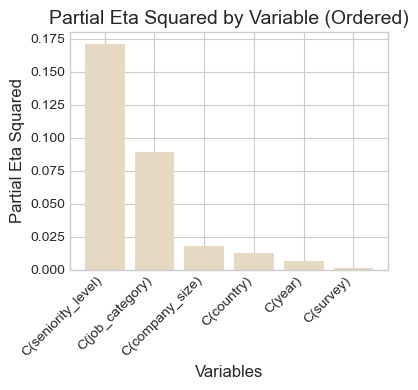

In [373]:
import matplotlib.pyplot as plt

# Assuming 'anova_results' is a DataFrame with the ANOVA results

# Sort by Partial Eta Squared in descending order
anova_results_sorted = anova_results.sort_values(by='Partial_eta_sq', ascending=False)

# Extracting sorted variables and Partial Eta Squared values
variables = anova_results_sorted.index  # Assuming index contains the variable names
partial_eta_sq = anova_results_sorted['Partial_eta_sq']

# Plotting
plt.figure(figsize=(4, 4))
plt.bar(variables, partial_eta_sq, color='#e6d8c1')
plt.xlabel('Variables', fontsize=12)
plt.ylabel('Partial Eta Squared', fontsize=12)
plt.title('Partial Eta Squared by Variable (Ordered)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [374]:

# Function to calculate Cohen's f from partial eta-squared
def cohen_f_from_partial_eta_squared(eta_squared):
    if eta_squared >= 1 or eta_squared < 0:
        raise ValueError(f"Invalid eta-squared value: {eta_squared}. It must be between 0 and 1.")
    return np.sqrt(eta_squared / (1 - eta_squared))

# Function to extract variable name from 'C(variable_name)'
def extract_variable_name(var):
    if var.startswith('C(') and var.endswith(')'):
        return var[2:-1]
    else:
        return var

# Initialize a dictionary to store power values
power_results = {}

# Total sample size
nobs = df_combined.shape[0]

# Set alpha level (commonly 0.05)
alpha = 0.05

for var in variables:
    # Get the actual variable name without 'C()'
    var_name = extract_variable_name(var)
    # Get partial eta squared
    partial_eta_sq_var = anova_results.loc[var, 'Partial_eta_sq']
    # Compute Cohen's f
    effect_size = cohen_f_from_partial_eta_squared(partial_eta_sq_var)
    # Number of groups (levels) in the variable
    k_groups = df_combined[var_name].nunique()
    # Compute power
    power_analysis = FTestAnovaPower()
    power = power_analysis.power(effect_size=effect_size, nobs=nobs, alpha=alpha, k_groups=k_groups)
    # Store the power value
    power_results[var] = power

# Add power values to the anova_results DataFrame
anova_results['Power'] = pd.Series(power_results)

# Display the updated ANOVA results with power
display(anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq', 'Power']])

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Power
C(survey),4.7727,2.0000,19.0123,0.0000,0.0041,0.0014,0.9999
C(seniority_level),697.3545,3.0000,1851.9660,0.0000,0.5958,0.1713,1.0000
C(job_category),329.3047,22.0000,119.2548,0.0000,0.2813,0.0890,1.0000
C(year),22.0199,6.0000,29.2392,0.0000,0.0188,0.0065,1.0000
C(country),43.0186,12.0000,28.5612,0.0000,0.0368,0.0126,1.0000
C(company_size),60.7510,13.0000,37.2315,0.0000,0.0519,0.0177,1.0000


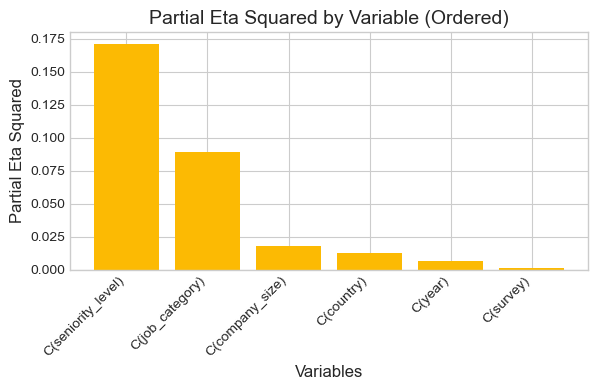

In [375]:
import matplotlib.pyplot as plt

# Assuming 'anova_results' is a DataFrame with the ANOVA results

# Sort by Partial Eta Squared in descending order
anova_results_sorted = anova_results.sort_values(by='Partial_eta_sq', ascending=False)

# Extracting sorted variables and Partial Eta Squared values
variables = anova_results_sorted.index  # Assuming index contains the variable names
partial_eta_sq = anova_results_sorted['Partial_eta_sq']

# Plotting
plt.figure(figsize=(6, 4))
plt.bar(variables, partial_eta_sq, color='#fcba03')
plt.xlabel('Variables', fontsize=12)
plt.ylabel('Partial Eta Squared', fontsize=12)
plt.title('Partial Eta Squared by Variable (Ordered)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [376]:
# List of your categorical variables
categorical_vars = ['seniority_level', 'job_category', 'year', 'company_industry', 'language_category', 'company_size']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_it_w_l[var] = df_it_w_l[var].astype('category')

# Define the formula for the model
formula = 'salary_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Fit the model
model = ols(formula, data=df_it_w_l).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Display the results
anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq']]

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 18, but rank is 15

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 5, but rank is 1



,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq
C(seniority_level),5.0776,3.0000,38.1283,0.0000,0.3363,0.1737
C(job_category),4.0340,18.0000,5.0487,0.0000,0.2672,0.1431
C(year),0.3808,5.0000,1.7156,0.1908,0.0252,0.0155
C(company_industry),0.7288,11.0000,1.4926,0.1300,0.0483,0.0293
C(language_category),1.5387,2.0000,17.3313,0.0000,0.1019,0.0599
C(company_size),3.2625,4.0000,18.3742,0.0000,0.2161,0.1190


Note: "covariance of constraints does not have full rank. The number of constraints is..."
This warning suggests that there is multicollinearity or redundancy among the independent variables in the model,
leading to a rank deficiency in the covariance matrix. As a result, some independent variables may not have 
distinct or interpretable effects on the dependent variable, which can impact the reliability of the ANOVA results.

In [378]:
# Function to calculate Cohen's f from partial eta-squared
def cohen_f_from_partial_eta_squared(eta_squared):
    if eta_squared >= 1 or eta_squared < 0:
        raise ValueError(f"Invalid eta-squared value: {eta_squared}. It must be between 0 and 1.")
    return np.sqrt(eta_squared / (1 - eta_squared))

# Function to extract variable name from 'C(variable_name)'
def extract_variable_name(var):
    if var.startswith('C(') and var.endswith(')'):
        return var[2:-1]
    else:
        return var

# Initialize a dictionary to store power values
power_results = {}

# Total sample size
nobs = df_it_w_l.shape[0]

# Set alpha level (commonly 0.05)
alpha = 0.05

for var in variables:
    # Get the actual variable name without 'C()'
    var_name = extract_variable_name(var)
    # Get partial eta squared
    partial_eta_sq_var = anova_results.loc[var, 'Partial_eta_sq']
    # Compute Cohen's f
    effect_size = cohen_f_from_partial_eta_squared(partial_eta_sq_var)
    # Number of groups (levels) in the variable
    k_groups = df_combined[var_name].nunique()
    # Compute power
    power_analysis = FTestAnovaPower()
    power = power_analysis.power(effect_size=effect_size, nobs=nobs, alpha=alpha, k_groups=k_groups)
    # Store the power value
    power_results[var] = power

# Add power values to the anova_results DataFrame
anova_results['Power'] = pd.Series(power_results)

# Display the updated ANOVA results with power
display(anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq', 'Power']])

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Power
C(seniority_level),5.0776,3.0000,38.1283,0.0000,0.3363,0.1737,1.0000
C(job_category),4.0340,18.0000,5.0487,0.0000,0.2672,0.1431,1.0000
C(year),0.3808,5.0000,1.7156,0.1908,0.0252,0.0155,1.0000
C(company_industry),0.7288,11.0000,1.4926,0.1300,0.0483,0.0293,1.0000
C(language_category),1.5387,2.0000,17.3313,0.0000,0.1019,0.0599,1.0000
C(company_size),3.2625,4.0000,18.3742,0.0000,0.2161,0.1190,1.0000


Statistical Power: The probability that a test will correctly reject a false null hypothesis (i.e., detect a true effect when it exists). A commonly accepted threshold for adequate power is 0.80 (or 80%).\
We can be more confident that there is no significant effect associated with this variable in the data.\
The study was adequately powered to detect a meaningful effect if one existed.\
\
Variables with Significant P-value and Adequate Power: Confirm the effect and consider its practical implications.\
Variables with High Power and High P-value: Conclude that there is likely no significant effect. Focus resources on other variables with potential effects.

In [380]:

# Function to calculate Cohen's f from partial eta-squared
def cohen_f_from_partial_eta_squared(eta_squared):
    if eta_squared >= 1 or eta_squared < 0:
        raise ValueError(f"Invalid eta-squared value: {eta_squared}. It must be between 0 and 1.")
    return np.sqrt(eta_squared / (1 - eta_squared))

# Function to extract variable name from 'C(variable_name)'
def extract_variable_name(var):
    if var.startswith('C(') and var.endswith(')'):
        return var[2:-1]
    else:
        return var

# Initialize a dictionary to store power values
power_results = {}

# Total sample size
nobs = df_it_w_l.shape[0]

# Set alpha level (commonly 0.05)
alpha = 0.05

for var in variables:
    # Get the actual variable name without 'C()'
    var_name = extract_variable_name(var)
    # Get partial eta squared
    partial_eta_sq_var = anova_results.loc[var, 'Partial_eta_sq']
    # Compute Cohen's f
    effect_size = cohen_f_from_partial_eta_squared(partial_eta_sq_var)
    # Number of groups (levels) in the variable
    k_groups = df_combined[var_name].nunique()
    # Calculate the effective sample size for this variable
    # Sum of observations across levels of the factor
    nobs_var = df_combined.groupby(var_name, observed=True).size().sum()
    # Alternatively, use the harmonic mean of group sizes
    group_sizes = df_combined.groupby(var_name, observed=True).size().values
    nobs_var = len(group_sizes) * (len(group_sizes) / np.sum(1 / group_sizes))
    # Compute power
    power_analysis = FTestAnovaPower()
    power = power_analysis.power(effect_size=effect_size, nobs=nobs_var, alpha=alpha, k_groups=k_groups)
    # Store the power value
    power_results[var] = power

# Add power values to the anova_results DataFrame
anova_results['Power'] = pd.Series(power_results)

# Display the updated ANOVA results with power
display(anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq', 'Power']])

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Power
C(seniority_level),5.0776,3.0000,38.1283,0.0000,0.3363,0.1737,1.0000
C(job_category),4.0340,18.0000,5.0487,0.0000,0.2672,0.1431,1.0000
C(year),0.3808,5.0000,1.7156,0.1908,0.0252,0.0155,1.0000
C(company_industry),0.7288,11.0000,1.4926,0.1300,0.0483,0.0293,0.1114
C(language_category),1.5387,2.0000,17.3313,0.0000,0.1019,0.0599,1.0000
C(company_size),3.2625,4.0000,18.3742,0.0000,0.2161,0.1190,1.0000


## Try: 17:20

In [382]:
# Define the dataframe to be used
df_name = df_ai_w_l  # You can update df_combined to any other dataframe as needed

# List of your categorical variables
categorical_vars = ['seniority_level', 'job_category', 'year', 'country', 'company_size']

# Convert variables to 'category' data type
for var in categorical_vars:
    df_name[var] = df_name[var].astype('category')

# Define the formula for the model
formula = 'salary_norm_log ~ ' + ' + '.join(['C(' + var + ')' for var in categorical_vars])

# Fit the model
model = ols(formula, data=df_name).fit()

# Perform ANOVA with Type III sum of squares
anova_table = sm.stats.anova_lm(model, typ=3)

# Calculate total sum of squares excluding 'Residual' and 'Intercept'
ss_total = anova_table.loc[anova_table.index != 'Residual', 'sum_sq'].sum()

# Get the sum of squares for residual
ss_residual = anova_table.loc['Residual', 'sum_sq']

# Variables to calculate eta-squared for
variables = [var for var in anova_table.index if var not in ['Residual', 'Intercept']]

# Initialize dictionaries to store eta-squared values
eta_sq = {}
partial_eta_sq = {}

for var in variables:
    ss_effect = anova_table.loc[var, 'sum_sq']
    eta_sq[var] = ss_effect / ss_total
    partial_eta_sq[var] = ss_effect / (ss_effect + ss_residual)

# Create DataFrame for eta-squared values
eta_sq_df = pd.DataFrame({
    'Eta_sq': eta_sq,
    'Partial_eta_sq': partial_eta_sq
})

# Merge with the ANOVA table
anova_results = anova_table.loc[variables].join(eta_sq_df)

# Function to calculate Cohen's f from partial eta-squared
def cohen_f_from_partial_eta_squared(eta_squared):
    if eta_squared >= 1 or eta_squared < 0:
        raise ValueError(f"Invalid eta-squared value: {eta_squared}. It must be between 0 and 1.")
    return np.sqrt(eta_squared / (1 - eta_squared))

# Initialize a dictionary to store power values
power_results = {}

# Total sample size
nobs = df_name.shape[0]

# Set alpha level (commonly 0.05)
alpha = 0.05

for var, actual_var in zip(variables, categorical_vars):
    # Get partial eta squared
    partial_eta_sq_var = anova_results.loc[var, 'Partial_eta_sq']
    # Compute Cohen's f
    effect_size = cohen_f_from_partial_eta_squared(partial_eta_sq_var)
    # Number of groups (levels) in the actual variable
    k_groups = df_name[actual_var].nunique()
    # Calculate the effective sample size for this variable
    # Sum of observations across levels of the factor
    nobs_var = df_name.groupby(actual_var, observed=True).size().sum()
    # Alternatively, use the harmonic mean of group sizes
    group_sizes = df_name.groupby(actual_var, observed=True).size().values
    nobs_var = len(group_sizes) * (len(group_sizes) / np.sum(1 / group_sizes))
    # Compute power
    power_analysis = FTestAnovaPower()
    power = power_analysis.power(effect_size=effect_size, nobs=nobs_var, alpha=alpha, k_groups=k_groups)
    # Store the power value
    power_results[var] = power

# Add power values to the anova_results DataFrame
anova_results['Power'] = pd.Series(power_results)

# Display the updated ANOVA results with power
display(anova_results[['sum_sq', 'df', 'F', 'PR(>F)', 'Eta_sq', 'Partial_eta_sq', 'Power']])

,sum_sq,df,F,PR(>F),Eta_sq,Partial_eta_sq,Power
C(seniority_level),268.7992,3.0000,762.7505,0.0000,0.4778,0.1331,1.0000
C(job_category),250.9789,7.0000,305.2214,0.0000,0.4461,0.1254,1.0000
C(year),5.9991,4.0000,12.7675,0.0000,0.0107,0.0034,0.2268
C(country),31.2794,12.0000,22.1898,0.0000,0.0556,0.0176,0.0772
C(company_size),2.1992,2.0000,9.3608,0.0001,0.0039,0.0013,0.1215
